INTRODUCTION

The MIMIC-III (Medical Information Mart for Intensive Care III) dataset is a freely available collection of de-identified electronic health records (EHRs) from critically ill patients who were admitted to the Beth Israel Deaconess Medical Center (BIDMC) between 2001 and 2012. The dataset contains comprehensive clinical data on over 58,000 patients, including demographic information, diagnoses, medications, laboratory results, and physiological data such as vital signs and ventilator settings.

The MIMIC-III dataset is widely used for research in clinical informatics, machine learning, and data science. It has been used to develop predictive models for mortality, sepsis, and other critical care outcomes, as well as to investigate a wide range of research questions in areas such as pharmacology, epidemiology, and public health. The dataset has also been used to develop and evaluate clinical decision support tools, as well as to inform healthcare policy and practice.

In [ ]:
!pip install jyquickhelper

In [68]:
from jyquickhelper import add_notebook_menu
add_notebook_menu(first_level=1, last_level=5, header="<font color='blus'>Data Science Mission - MIMIC-III</font>")

# 1. Importing required libraries

In [ ]:
!pip install pyathena

import pyathena as pa

!pip install squarify 

import squarify     

!pip install fastparquet

In [4]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import matplotlib as mpl 
import matplotlib.cm as cm 
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd 

import gensim

import random

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, MinMaxScaler
from sklearn import metrics, linear_model, tree, naive_bayes, neighbors, ensemble, neural_network, svm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn import linear_model
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix 
from sklearn import metrics
# import feature extraction methods from sklearn
from sklearn.feature_extraction.text import CountVectorizer

import statsmodels.api as sm

import seaborn as sns

from scipy.stats import chi2_contingency

import nltk
nltk.download('stopwords')

from gensim.utils import simple_preprocess
# importing stop words from nltk corpus
from nltk.corpus import stopwords

# pre-processing of text
import string
import re

# import time function from time module to track the training duration
from time import time


from scipy.stats import chi2_contingency

import pickle

import joblib

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [5]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 2000)

In [6]:
def na_percentage(df):
    """
    Returns a pandas DataFrame with the percentage of NaN values in each column of the input DataFrame,
    and a list of column names with more than 50% NaN values
    """
    total_count = len(df)
    na_count = df.isna().sum()
    na_percentage = round(na_count / total_count * 100, 2)
    na_df = pd.DataFrame({'Column Name': na_percentage.index,
                          'NA Count': na_count.values,
                          'NA %': na_percentage.values})
    na_columns = na_df[na_df['NA %'] > 50]['Column Name'].tolist()

    return na_df, na_columns

In [7]:
def remove_outliers(column):
    """
    Returns a column with the no outliers
    """
    
    # Calculate the first and third quartiles
    q1, q3 = np.percentile(column, [25, 75])

    # Calculate the IQR
    iqr = q3 - q1

    # Calculate the lower and upper bounds
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)

    # Filter out values outside the bounds
    filtered_column = column[(column >= lower_bound) & (column <= upper_bound)]

    return filtered_column

In [8]:
def create_value_counts_dataframe(dataframe, column):
    """
    Creates a new dataframe with columns 'Category', 'Count', and 'Percentage'
    based on the value counts of a given dataframe and column.
    
    Parameters:
    dataframe (pandas.DataFrame): The dataframe to use.
    column (str): The column of the dataframe to count values for.
    
    Returns:
    pandas.DataFrame: A new dataframe with columns 'Category', 'Count', and 'Percentage'.
    """
    
    # get value counts of column
    value_counts = dataframe[column].value_counts()
    
    # create new dataframe with columns 'Category', 'Count', and 'Percentage'
    new_dataframe = pd.DataFrame({'Category': value_counts.index,
                                  'Count': value_counts.values,
                                  'Percentage': (value_counts.values / len(dataframe)) * 100})
    
    return new_dataframe

In [9]:
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

## 1.1 Data source - Amazon S3 bucket

In [10]:
bucket='mimic-iii-physionet'

## 1.2 Connection to AWS Athena

In [53]:
athena_connect = pa.connect(
    s3_staging_dir='s3://mydatasciencemissions3/',
    region_name='us-east-1')

## 1.3 Data transformation architecture in AWS

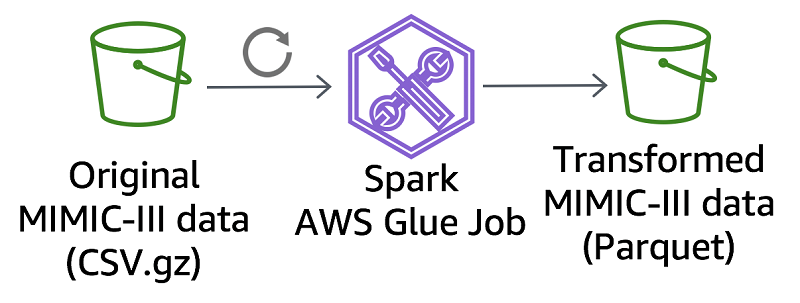

In [100]:
Image("https://d2908q01vomqb2.cloudfront.net/b6692ea5df920cad691c20319a6fffd7a4a766b8/2019/08/20/BiomedicalMIMICAthena1-1.png")



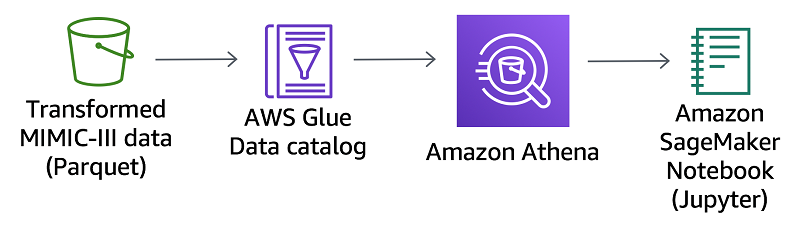

In [101]:
Image("https://d2908q01vomqb2.cloudfront.net/b6692ea5df920cad691c20319a6fffd7a4a766b8/2019/08/20/BiomedicalMIMICAthena4-1.png")



## 1.4 List of Tables in Database:
1. admissions
2. callout
3. caregivers
4. chartevents
5. cpt_events
6. d_cpt
7. d_icd_diagnoses
8. d_icd_procedures
9. d_items
10. d_labitems
11. datetimeevents
12. diagnoses_icd
13. drgcodes
14. icustays
15. inputevents_cv
16. inputevents_mv
17. labevents
18. microbiologyevents
19. noteevents
20. outputevents
21. patients
22. prescriptions
23. procedureevents_mv
24. procedures_icd
25. services
26. transfers

**********************************************************************************************************************

# 2. Exploratory Data Analysis

**********************************************************************************************************************

## 2.1 admissions

### 2.1.1 Data description

SUBJECT_ID: unique identifier for the patient

HADM_ID: unique identifier for the hospital admission

ADMITTIME: date and time of admission

DISCHTIME: date and time of discharge

DEATHTIME: date and time of death, if applicable

ADMISSION_TYPE: type of admission (emergency, urgent, elective, newborn)

ADMISSION_LOCATION: location where the patient was admitted (e.g., emergency department, transfer from another hospital)

DISCHARGE_LOCATION: location where the patient was discharged (e.g., home, nursing home)

INSURANCE: type of insurance

LANGUAGE: patient's preferred language

RELIGION: patient's religious affiliation

MARITAL_STATUS: patient's marital status

ETHNICITY: patient's ethnicity

DIAGNOSIS: primary diagnosis for the hospital admission

HOSPITAL_EXPIRE_FLAG: binary flag indicating whether the patient died during the hospital admission

HAS_CHARTEVENTS_DATA: binary flag indicating whether there are any chart events recorded for the hospital admission


### 2.1.2 Importing data

In [14]:
data_key = 'ADMISSIONS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time admissions = pd.read_csv(data_location)

admissions.shape

CPU times: user 312 ms, sys: 40.5 ms, total: 353 ms
Wall time: 979 ms


(58976, 19)

In [15]:
admissions.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,BRAIN MASS,0,1
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,NaN,PROTESTANT QUAKER,SINGLE,WHITE,NaN,NaN,INTERIOR MYOCARDIAL INFARCTION,0,1
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1


In [14]:
admissions.columns

Index(['ROW_ID', 'SUBJECT_ID', 'HADM_ID', 'ADMITTIME', 'DISCHTIME', 'DEATHTIME', 'ADMISSION_TYPE', 'ADMISSION_LOCATION', 'DISCHARGE_LOCATION', 'INSURANCE', 'LANGUAGE', 'RELIGION', 'MARITAL_STATUS', 'ETHNICITY', 'EDREGTIME', 'EDOUTTIME', 'DIAGNOSIS', 'HOSPITAL_EXPIRE_FLAG', 'HAS_CHARTEVENTS_DATA'], dtype='object')

### 2.1.3 Descriptive analysis

In [15]:
admissions.ADMISSION_LOCATION.value_counts()

EMERGENCY ROOM ADMIT         22754
PHYS REFERRAL/NORMAL DELI    15079
CLINIC REFERRAL/PREMATURE    12032
TRANSFER FROM HOSP/EXTRAM     8456
TRANSFER FROM SKILLED NUR      273
** INFO NOT AVAILABLE **       204
HMO REFERRAL/SICK              102
TRANSFER FROM OTHER HEALT       71
TRSF WITHIN THIS FACILITY        5
Name: ADMISSION_LOCATION, dtype: int64

In [16]:
# Count and percentage of expired admissions

create_value_counts_dataframe(admissions, 'HOSPITAL_EXPIRE_FLAG')

,Category,Count,Percentage
0,0,53122,90.073928
1,1,5854,9.926072


[Text(0, 0, '53122'), Text(0, 0, '5854')]

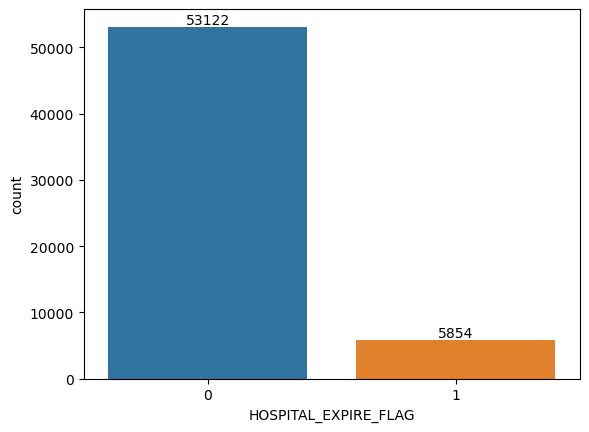

In [17]:
# Number of expired in the Hospital

ax = sns.countplot(data=admissions, x="HOSPITAL_EXPIRE_FLAG")
ax.bar_label(ax.containers[0])

In [16]:
# Number of admissions in Emergency Department(ED) based on "ADMISSION_LOCATION"

admissions.groupby('ADMISSION_LOCATION')[['EDREGTIME','EDOUTTIME']].count().sort_values('EDREGTIME', ascending=False)

,EDREGTIME,EDOUTTIME
ADMISSION_LOCATION,,
EMERGENCY ROOM ADMIT,22437,22437
CLINIC REFERRAL/PREMATURE,7932,7932
TRANSFER FROM HOSP/EXTRAM,196,196
TRANSFER FROM SKILLED NUR,192,192
PHYS REFERRAL/NORMAL DELI,103,103
TRANSFER FROM OTHER HEALT,14,14
** INFO NOT AVAILABLE **,2,2
HMO REFERRAL/SICK,1,1
TRSF WITHIN THIS FACILITY,0,0


With the above group, we can see that most patients who go through the ED are direct admissions, but sometimes clinical referrals and transfers also go via the ED.

[Text(0, 0, '5434'), Text(0, 0, '197'), Text(0, 0, '62'), Text(0, 0, '161')]

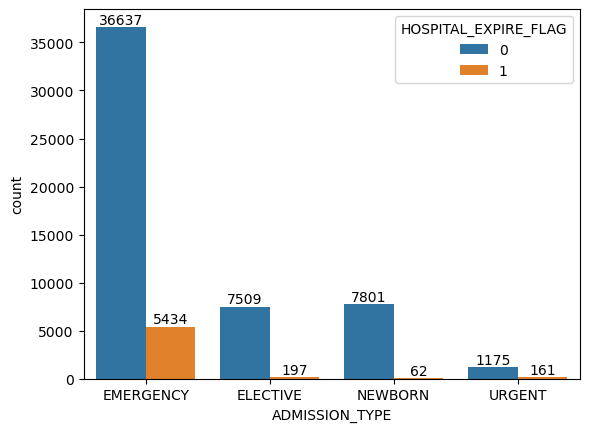

In [57]:
# Number of admissions in Emergency Department(ED) based on "ADMISSION_TYPE"

ax = sns.countplot(data=admissions, x="ADMISSION_TYPE", hue="HOSPITAL_EXPIRE_FLAG")
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

In [18]:
admissions[['ADMISSION_TYPE']].value_counts()

ADMISSION_TYPE
EMERGENCY         42071
NEWBORN            7863
ELECTIVE           7706
URGENT             1336
dtype: int64

In [19]:
admissions["ADMISSION_TYPE"].isnull().sum()

0

In [20]:
admissions_expired = admissions.loc[admissions['HOSPITAL_EXPIRE_FLAG'] == 1]

In [21]:
admissions_expired.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
9,30,31,128652,2108-08-22 23:27:00,2108-08-30 15:00:00,2108-08-30 15:00:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,DEAD/EXPIRED,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,STATUS EPILEPTICUS,1,1
57,55,56,181711,2104-01-02 02:01:00,2104-01-08 10:30:00,2104-01-08 10:30:00,EMERGENCY,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,Medicare,NaN,NOT SPECIFIED,NaN,WHITE,2104-01-01 23:59:00,2104-01-02 03:33:00,HEAD BLEED,1,1
63,61,61,189535,2119-01-04 18:12:00,2119-02-03 01:35:00,2119-02-03 01:35:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,DEAD/EXPIRED,Private,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,NON-HODGKINS LYMPHOMA;FEBRILE;NEUTROPENIA,1,1
70,68,67,155252,2157-12-02 00:45:00,2157-12-02 03:55:00,2157-12-02 03:55:00,EMERGENCY,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,Medicare,NaN,JEWISH,SINGLE,WHITE,2157-12-01 20:45:00,2157-12-02 00:55:00,SUBARACHNOID HEMORRHAGE,1,1
88,86,84,166401,2196-04-14 04:02:00,2196-04-17 13:42:00,2196-04-17 13:42:00,EMERGENCY,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,Private,NaN,OTHER,MARRIED,WHITE,2196-04-13 22:23:00,2196-04-14 04:31:00,"GLIOBLASTOMA,NAUSEA",1,1


In [59]:
# Top 15 diagnosis of expired admissions

create_value_counts_dataframe(admissions, 'DIAGNOSIS').head(15)

,Category,Count,Percentage
0,NEWBORN,7823,13.264718
1,PNEUMONIA,1566,2.655317
2,SEPSIS,1184,2.007596
3,CONGESTIVE HEART FAILURE,928,1.573521
4,CORONARY ARTERY DISEASE,840,1.424308
5,CHEST PAIN,778,1.319181
6,INTRACRANIAL HEMORRHAGE,713,1.208966
7,ALTERED MENTAL STATUS,712,1.207271
8,GASTROINTESTINAL BLEED,686,1.163185
9,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,583,0.988538


<AxesSubplot: >

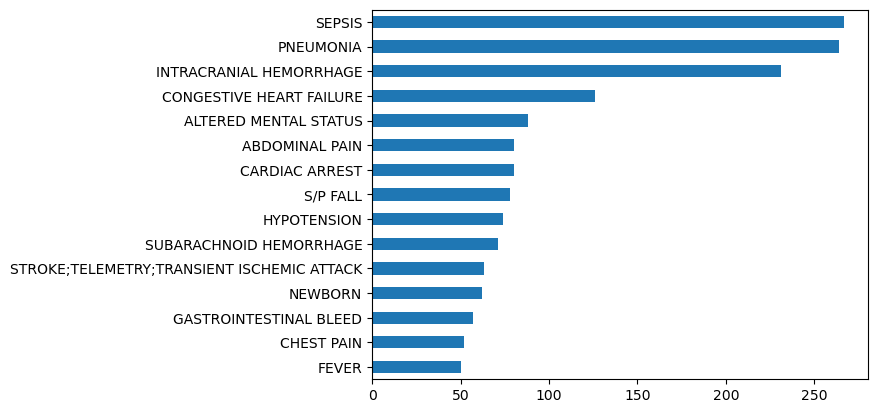

In [23]:
(admissions_expired.DIAGNOSIS.value_counts().head(15).sort_values()).plot.barh()

In [61]:
# Top 10 ETHNICITY of expired admissions

create_value_counts_dataframe(admissions, 'ETHNICITY').head(10)

,Category,Count,Percentage
0,WHITE,40996,69.513022
1,BLACK/AFRICAN AMERICAN,5440,9.224091
2,UNKNOWN/NOT SPECIFIED,4523,7.669221
3,HISPANIC OR LATINO,1696,2.875746
4,OTHER,1512,2.563755
5,ASIAN,1509,2.558668
6,UNABLE TO OBTAIN,814,1.380222
7,PATIENT DECLINED TO ANSWER,559,0.947843
8,ASIAN - CHINESE,277,0.469683
9,HISPANIC/LATINO - PUERTO RICAN,232,0.393380


<AxesSubplot: >

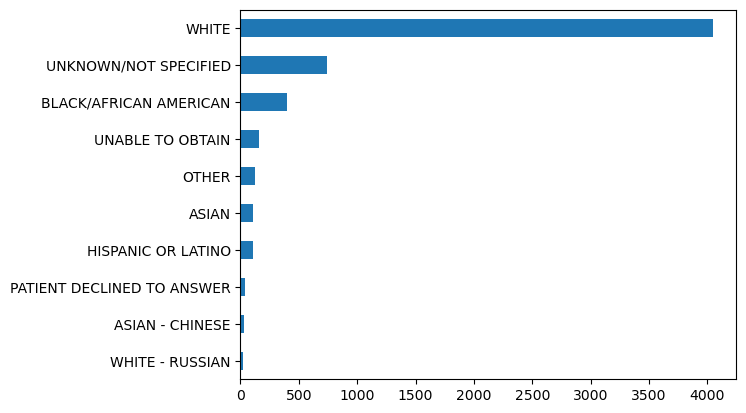

In [25]:
admissions_expired.ETHNICITY.value_counts().head(10).sort_values().plot.barh()

<AxesSubplot: >

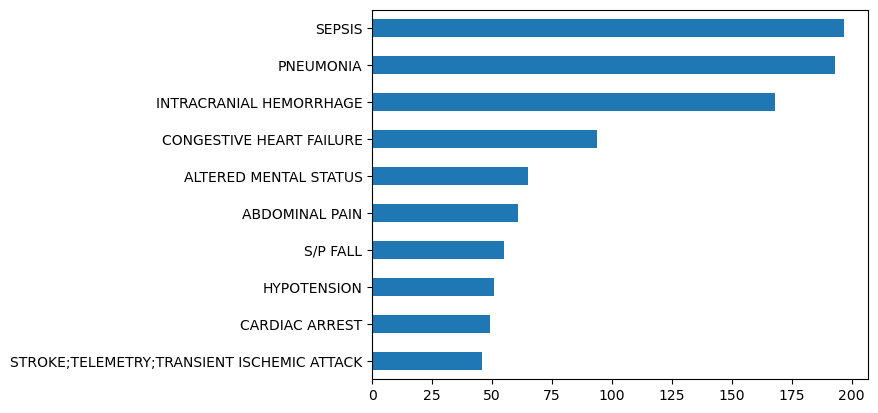

In [26]:
# Top 10 diagnosis of expired admissions who are "WHITE"

admissions_expired[admissions_expired["ETHNICITY"]=="WHITE"].DIAGNOSIS.value_counts().head(10).sort_values().plot.barh()


<AxesSubplot: >

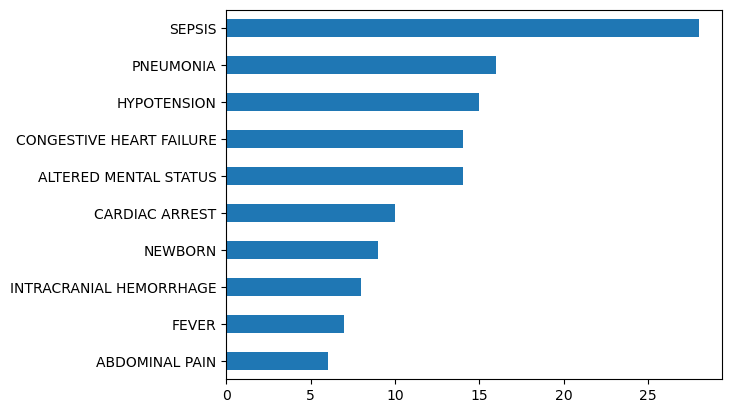

In [27]:
# Top 10 diagnosis of expired admissions who are "BLACK/AFRICAN AMERICAN"

admissions_expired[admissions_expired["ETHNICITY"]=="BLACK/AFRICAN AMERICAN"].DIAGNOSIS.value_counts().head(10).sort_values().plot.barh()

"Hypotension" is the 3rd major diagnosis for BLACK/AFRICAN AMERICAN ethnic group.

<AxesSubplot: >

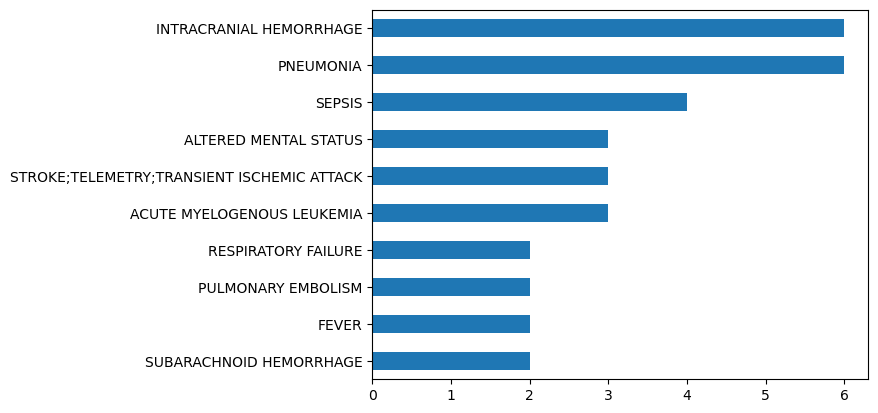

In [28]:
# Top 10 diagnosis of expired admissions who are "ASIAN"

admissions_expired[admissions_expired["ETHNICITY"]=="ASIAN"].DIAGNOSIS.value_counts().head(10).sort_values().plot.barh()

"Intracranial hemorrhage" is the major diagnosis in ASIAN ethnic group.

<AxesSubplot: >

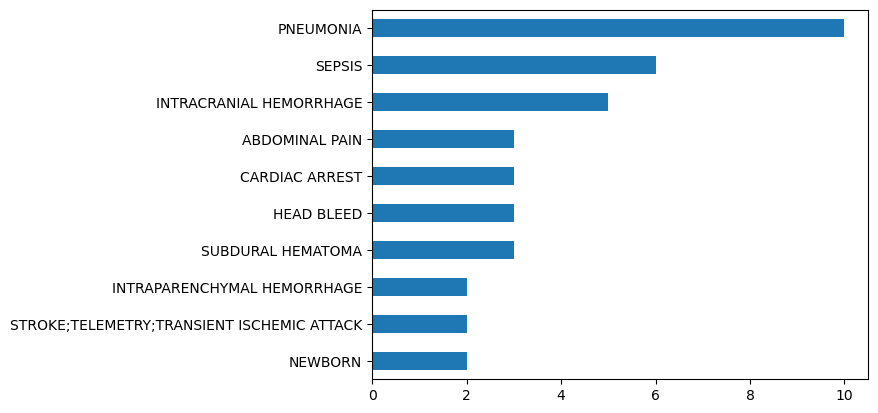

In [29]:
# Top 10 diagnosis of expired admissions who are "HISPANIC OR LATINO "

admissions_expired[admissions_expired["ETHNICITY"]=="HISPANIC OR LATINO"].DIAGNOSIS.value_counts().head(10).sort_values().plot.barh()


In [30]:
expired_hispanic_latino_diagnosis = pd.DataFrame(admissions_expired[admissions_expired["ETHNICITY"]=="HISPANIC OR LATINO"]
                                                 .DIAGNOSIS
                                                 .value_counts())


In [31]:
expired_asian_diagnosis = pd.DataFrame(admissions_expired[admissions_expired["ETHNICITY"]=="ASIAN"]
                                                 .DIAGNOSIS
                                                 .value_counts())

In [32]:
expired_black_or_african_american_diagnosis = pd.DataFrame(admissions_expired[admissions_expired["ETHNICITY"]=="BLACK/AFRICAN AMERICAN"]
                                                 .DIAGNOSIS
                                                 .value_counts())

In [33]:
expired_white_diagnosis = pd.DataFrame(admissions_expired[admissions_expired["ETHNICITY"]=="WHITE"]
                                                 .DIAGNOSIS
                                                 .value_counts())

In [34]:
expired_ethnic_diagnosis = pd.DataFrame()

expired_ethnic_diagnosis["WHITE"] = expired_white_diagnosis.index[0:10]
expired_ethnic_diagnosis["BLACK/AFRICAN AMERICA"] = expired_black_or_african_american_diagnosis.index[0:10]
expired_ethnic_diagnosis["ASIAN"] = expired_asian_diagnosis.index[0:10]
expired_ethnic_diagnosis["HISPANIC OR LATINO"] = expired_hispanic_latino_diagnosis.index[0:10]

### 2.1.4 Comparing Top 10 Diagnosis of expired patients among Ethnic groups

In [35]:
expired_ethnic_diagnosis.index = expired_ethnic_diagnosis.index + 1

In [36]:
expired_ethnic_diagnosis

,WHITE,BLACK/AFRICAN AMERICA,ASIAN,HISPANIC OR LATINO
1,SEPSIS,SEPSIS,PNEUMONIA,PNEUMONIA
2,PNEUMONIA,PNEUMONIA,INTRACRANIAL HEMORRHAGE,SEPSIS
3,INTRACRANIAL HEMORRHAGE,HYPOTENSION,SEPSIS,INTRACRANIAL HEMORRHAGE
4,CONGESTIVE HEART FAILURE,ALTERED MENTAL STATUS,ACUTE MYELOGENOUS LEUKEMIA,SUBDURAL HEMATOMA
5,ALTERED MENTAL STATUS,CONGESTIVE HEART FAILURE,STROKE;TELEMETRY;TRANSIENT ISCHEMIC ATTACK,HEAD BLEED
6,ABDOMINAL PAIN,CARDIAC ARREST,ALTERED MENTAL STATUS,CARDIAC ARREST
7,S/P FALL,NEWBORN,SUBARACHNOID HEMORRHAGE,ABDOMINAL PAIN
8,HYPOTENSION,INTRACRANIAL HEMORRHAGE,FEVER,NEWBORN
9,CARDIAC ARREST,FEVER,PULMONARY EMBOLISM,STROKE;TELEMETRY;TRANSIENT ISCHEMIC ATTACK
10,STROKE;TELEMETRY;TRANSIENT ISCHEMIC ATTACK,ABDOMINAL PAIN,RESPIRATORY FAILURE,INTRAPARENCHYMAL HEMORRHAGE


In [37]:
admissions.columns

Index(['ROW_ID', 'SUBJECT_ID', 'HADM_ID', 'ADMITTIME', 'DISCHTIME',
       'DEATHTIME', 'ADMISSION_TYPE', 'ADMISSION_LOCATION',
       'DISCHARGE_LOCATION', 'INSURANCE', 'LANGUAGE', 'RELIGION',
       'MARITAL_STATUS', 'ETHNICITY', 'EDREGTIME', 'EDOUTTIME', 'DIAGNOSIS',
       'HOSPITAL_EXPIRE_FLAG', 'HAS_CHARTEVENTS_DATA'],
      dtype='object')

In [38]:
# Chi-square test to find whether there is a relationship between "Ethnicity" and "Expire Flag"

# H0 - There is no relationship between "Ethnicity" and "Expire Flag"
# H1 - "Ethnicity" can be used to predict the patitents mortality

# create a contingency table
contingency_table = pd.crosstab(admissions['ETHNICITY'], admissions['HOSPITAL_EXPIRE_FLAG'])

# perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# print results
print(f'Chi-square statistic: {chi2:.2f}')
print(f'p-value: {p:.2f}')
print(f'Degrees of freedom: {dof}')

Chi-square statistic: 438.80
p-value: 0.00
Degrees of freedom: 40


This output suggests that a chi-square test was performed on a contingency table with 40 degrees of freedom, and the calculated chi-square statistic was 438.80. The p-value associated with this chi-square statistic is reported as 0.00, which means that the probability of obtaining a chi-square statistic as extreme or more extreme than 438.80 under the null hypothesis (i.e., no association between the two categorical variables) is essentially zero.

In other words, this result suggests that there is a strong association between the two categorical variables being tested. Given the low p-value and high chi-square statistic, it is reasonable to conclude that the association is statistically significant.

In [249]:
admissions.head()

,SUBJECT_ID,HADM_ID,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS
0,22,165315,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,UNOBTAINABLE,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,1,3.30
1,23,152223,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1,5,0.00
2,23,124321,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,1,6,0.00
3,24,161859,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,1,2,0.00
4,25,129635,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,UNOBTAINABLE,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,1,3,3.43


In [251]:
# count of each RELIGION

admissions.RELIGION.value_counts()

CATHOLIC                  19946
NOT SPECIFIED             11519
UNOBTAINABLE               8148
PROTESTANT QUAKER          6894
JEWISH                     5151
OTHER                      2621
EPISCOPALIAN                749
Not available               453
GREEK ORTHODOX              442
CHRISTIAN SCIENTIST         417
BUDDHIST                    255
MUSLIM                      211
JEHOVAH'S WITNESS           139
UNITARIAN-UNIVERSALIST      123
HINDU                       110
ROMANIAN EAST. ORTH          82
7TH DAY ADVENTIST            76
BAPTIST                      21
HEBREW                       15
METHODIST                     7
LUTHERAN                      1
Name: RELIGION, dtype: int64

In [82]:
# Count and percentage of each religion

a = create_value_counts_dataframe(admissions, "RELIGION")
a

,Category,Count,Percentage
0,CATHOLIC,20606,34.939636
1,NOT SPECIFIED,11753,19.928445
2,UNOBTAINABLE,8269,14.020958
3,PROTESTANT QUAKER,7134,12.096446
4,JEWISH,5314,9.010445
5,OTHER,2696,4.571351
6,EPISCOPALIAN,774,1.312398
7,GREEK ORTHODOX,459,0.778283
8,CHRISTIAN SCIENTIST,429,0.727415
9,BUDDHIST,267,0.452727


<AxesSubplot: >

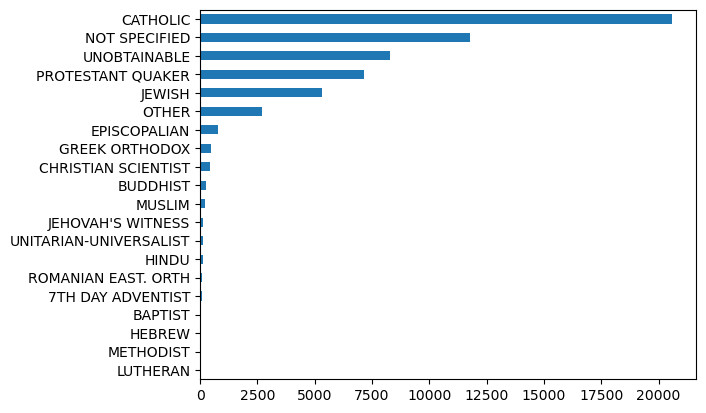

In [85]:
# Bar graph of each religion

(admissions.RELIGION.value_counts().sort_values()).plot.barh()

In [25]:
marital_status_df = create_value_counts_dataframe(admissions, 'MARITAL_STATUS')

In [26]:
marital_status_df

,Category,Count,Percentage
0,MARRIED,24239,41.099769
1,SINGLE,13254,22.473549
2,WIDOWED,7211,12.227008
3,DIVORCED,3213,5.447979
4,SEPARATED,571,0.968190
5,UNKNOWN (DEFAULT),345,0.584984
6,LIFE PARTNER,15,0.025434


<AxesSubplot: >

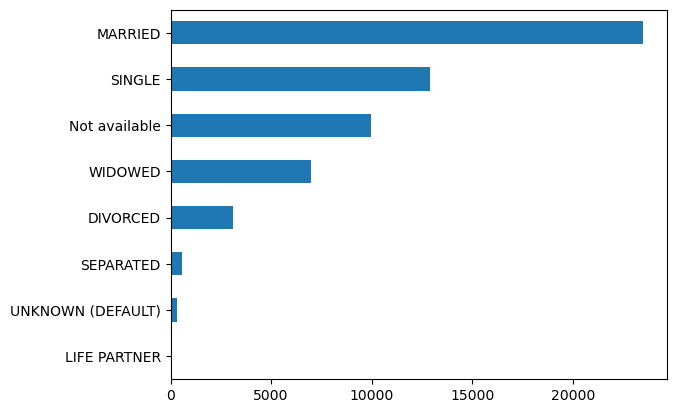

In [254]:
# # count of each MARITAL_STATUS

(admissions.MARITAL_STATUS.value_counts().sort_values()).plot.barh()

### 2.1.5 Cleaning table

In [16]:
admissions.shape

(58976, 19)

In [17]:
admissions.HAS_CHARTEVENTS_DATA.value_counts()

1    57384
0     1592
Name: HAS_CHARTEVENTS_DATA, dtype: int64

In [18]:
# removing subject_id that doesn't have chartevents data

admissions = admissions[admissions.HAS_CHARTEVENTS_DATA == 1]

In [19]:
# computing the duration of patients in hospital

# convert the 'ADMITTIME' and 'DISCHTIME' columns to datetime format

admissions['ADMITTIME'] = pd.to_datetime(admissions['ADMITTIME'])
admissions['DISCHTIME'] = pd.to_datetime(admissions['DISCHTIME'])

# compute the difference between 'ENDDATE' and 'STARTDATE' in days

admissions['ADMISSIONS_DURATION_DAYS'] = (admissions['DISCHTIME'] - admissions['ADMITTIME']).dt.days

In [20]:
# check for NA values

na_percentage(admissions)

(                 Column Name  NA Count   NA %
 0                     ROW_ID         0   0.00
 1                 SUBJECT_ID         0   0.00
 2                    HADM_ID         0   0.00
 3                  ADMITTIME         0   0.00
 4                  DISCHTIME         0   0.00
 5                  DEATHTIME     51558  89.85
 6             ADMISSION_TYPE         0   0.00
 7         ADMISSION_LOCATION         0   0.00
 8         DISCHARGE_LOCATION         0   0.00
 9                  INSURANCE         0   0.00
 10                  LANGUAGE     24512  42.72
 11                  RELIGION       453   0.79
 12            MARITAL_STATUS      9980  17.39
 13                 ETHNICITY         0   0.00
 14                 EDREGTIME     27005  47.06
 15                 EDOUTTIME     27005  47.06
 16                 DIAGNOSIS         4   0.01
 17      HOSPITAL_EXPIRE_FLAG         0   0.00
 18      HAS_CHARTEVENTS_DATA         0   0.00
 19  ADMISSIONS_DURATION_DAYS         0   0.00,
 ['DEATHTIME

In [21]:
# replacing NA values in EDREGTIME and EDOUTTIME columns with 0

admissions['EDREGTIME'] = admissions['EDREGTIME'].fillna(0)
admissions['EDOUTTIME'] = admissions['EDOUTTIME'].fillna(0)

In [22]:
# computing the duration of patients in Emergency Department(ED)

# convert the 'ADMITTIME' and 'DISCHTIME' columns to datetime format

admissions['EDREGTIME'] = pd.to_datetime(admissions['EDREGTIME'])
admissions['EDOUTTIME'] = pd.to_datetime(admissions['EDOUTTIME'])

# compute the difference between 'ENDDATE' and 'STARTDATE' in days

admissions['ADMISSIONS_ED_DURATION_HOURS'] = round(((admissions['EDOUTTIME'] - admissions['EDREGTIME']).dt.total_seconds()/3600),2)

In [23]:
admissions.EDOUTTIME.min(), admissions.EDOUTTIME.max()

(Timestamp('1970-01-01 00:00:00'), Timestamp('2210-08-17 18:25:00'))

In [24]:
admissions.EDREGTIME.min(), admissions.EDREGTIME.max()

(Timestamp('1970-01-01 00:00:00'), Timestamp('2210-08-17 10:14:00'))

In [25]:
# dropping unwanted columns

col_to_drop = ['ROW_ID', 'DISCHTIME', "DEATHTIME", "LANGUAGE", 'EDREGTIME', 'EDOUTTIME', 'HAS_CHARTEVENTS_DATA']

admissions.drop(columns=col_to_drop, axis=1, inplace=True)

In [26]:
# replace NaN values in column 'RELIGION' by a string

admissions['RELIGION'] = admissions['RELIGION'].fillna('RELIGION_NOT_SPECIFIED')
admissions['MARITAL_STATUS'] = admissions['MARITAL_STATUS'].fillna('MARITIAL_STATUS_NOT_SPECIFIED')

In [27]:
# dropping rows having NA's

admissions.dropna(inplace=True)

In [28]:
na_percentage(admissions)

(                     Column Name  NA Count  NA %
 0                     SUBJECT_ID         0   0.0
 1                        HADM_ID         0   0.0
 2                      ADMITTIME         0   0.0
 3                 ADMISSION_TYPE         0   0.0
 4             ADMISSION_LOCATION         0   0.0
 5             DISCHARGE_LOCATION         0   0.0
 6                      INSURANCE         0   0.0
 7                       RELIGION         0   0.0
 8                 MARITAL_STATUS         0   0.0
 9                      ETHNICITY         0   0.0
 10                     DIAGNOSIS         0   0.0
 11          HOSPITAL_EXPIRE_FLAG         0   0.0
 12      ADMISSIONS_DURATION_DAYS         0   0.0
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.0,
 [])

In [29]:
# replace 'UNOBTAINABLE' with 'NOT SPECIFIED' in column 'RELIGION'
admissions['RELIGION'] = admissions['RELIGION'].replace({'UNOBTAINABLE': 'RELIGION_NOT_SPECIFIED'})


In [30]:
# replace 'UNOBTAINABLE' with 'NOT SPECIFIED' in column 'RELIGION'
admissions['MARITAL_STATUS'] = admissions['MARITAL_STATUS'].replace({'UNKNOWN (DEFAULT)': 'MARITIAL_STATUS_NOT_SPECIFIED', 
                                                                     'LIFE PARTNER': 'MARRIED'})


In [31]:
# standardizing categories in 'ETHNICITY' column

admissions['ETHNICITY'] = admissions['ETHNICITY'].replace({'UNKNOWN/NOT SPECIFIED': 'ETHNICITY_NOT_SPECIFIED',
                                                           'PATIENT DECLINED TO ANSWER': 'ETHNICITY_NOT_SPECIFIED',
                                                           'UNABLE TO OBTAIN': 'ETHNICITY_NOT_SPECIFIED'})


In [32]:
# standardizing categories in 'DIAGNOSIS' column

admissions['DIAGNOSIS'] = admissions['DIAGNOSIS'].replace({'CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS GRAFT /SDA': 'CORONARY ARTERY BY PASS GRAFT',
                                                           'CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS GRAFT/SDA': 'CORONARY ARTERY BY PASS GRAFT',
                                                           'FZ2NMS\CORONARY ARTERY BYPASS GRAFT':'CORONARY ARTERY BY PASS GRAFT',
                                                           'CAD/AS\CORONARY ARTERY BYPASS GRAFT;AORTIC VALVE REPLACEMENT/SDA':'CORONARY ARTERY BY PASS GRAFT',
                                                           'CAD/CABG/SDA': 'CORONARY ARTERY BY PASS GRAFT',
                                                           'CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS GRAFT; W/MVR':'CORONARY ARTERY BY PASS GRAFT',
                                                           'CORONARY ARTERY DISEASE\BY PASS SDA': 'CORONARY ARTERY BY PASS GRAFT',
                                                           'AORTIC STENOSIS\AORTIC VALVE REPLACEMENT  ? CORONARY ARTERY BYPASS GRAFT WITH MVR /SDA':'CORONARY ARTERY BY PASS GRAFT',
                                                           '? CARDIOMYOPATHY':'CARDIOMYOPATHY',
                                                           'CODE SPESIS':'SEPSIS',
                                                           'SP CABG\CATH': "CORONARY ARTERY BY PASS GRAFT",
                                                           'CAD FOR CABG': 'CORONARY ARTERY BY PASS GRAFT'
                                                          })



In [33]:
# convert the 'ADMITTIME' column to datetime format
 
admissions['ADMITTIME'] = pd.to_datetime(admissions['ADMITTIME'], format='%Y-%m-%d')

In [34]:
admissions.head()

,SUBJECT_ID,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43


In [183]:
admissions.shape

(57380, 15)

In [35]:
%time admissions.to_parquet("admissions_cleaned.parquet", compression=None)

CPU times: user 85.8 ms, sys: 8.45 ms, total: 94.3 ms
Wall time: 93.5 ms


**********************************************************************************************************************

## 2.2 callout

### 2.2.1 Data description

The callout table in the MIMIC-III dataset contains information about requests made by healthcare providers to specialty services, such as consultations or procedures. The table records details of the request, the healthcare provider making the request, and the specialty service that is being requested.

ROW_ID: unique identifier for the row

SUBJECT_ID: unique identifier for the patient

HADM_ID: unique identifier for the hospital admission

SUBMIT_WARDID: ward ID where the callout was submitted

SUBMIT_CAREUNIT: care unit where the callout was submitted

CURR_WARDID: current ward ID of the patient

CURR_CAREUNIT: current care unit of the patient

CALLOUT_WARDID: ward ID for the callout

CALLOUT_SERVICE: service for the callout

REQUEST_TELE: flag indicating if the callout is for a teleconsultation

REQUEST_RESP: flag indicating if the callout is for a respiratory therapist

REQUEST_CDIFF: flag indicating if the callout is for a C. difficile consult

REQUEST_MRSA: flag indicating if the callout is for a MRSA consult

REQUEST_VRE: flag indicating if the callout is for a VRE consult

CALLOUT_STATUS: status of the callout

CALLOUT_OUTCOME: outcome of the callout

### 2.2.2 Importing data

In [20]:
data_key = 'CALLOUT.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

callout = pd.read_csv(data_location)

In [24]:
callout.shape

(34499, 24)

In [23]:
callout.head().T

,0,1,2,3,4
ROW_ID,402,403,404,405,157
SUBJECT_ID,854,864,864,867,306
HADM_ID,175684,138624,138624,184298,167129
SUBMIT_WARDID,52.0,15.0,12.0,7.0,57.0
SUBMIT_CAREUNIT,NaN,NaN,NaN,NaN,NaN
CURR_WARDID,29.0,55.0,55.0,17.0,3.0
CURR_CAREUNIT,MICU,CSRU,CSRU,CCU,SICU
CALLOUT_WARDID,1,55,55,17,44
CALLOUT_SERVICE,MED,CSURG,CSURG,CCU,NSURG
REQUEST_TELE,0,0,1,1,1


**********************************************************************************************************************

## 2.3 caregivers

### 2.3.1 Data description

ROW_ID: unique identifier for the row

CGID: The unique identifier for each caregiver. This is an integer value.

LABEL: A free-text label that describes the role of the caregiver. Examples include "Attending", "Resident", "Nurse", and "Intern".

DESCRIPTION: A more detailed description of the caregiver's role.

### 2.3.2 Importing data

In [45]:
data_key = 'CAREGIVERS'

data_location = 's3://{}/parquet/{}'.format(bucket, data_key)

caregivers = pd.read_parquet(data_location)

In [46]:
caregivers.shape

(7567, 4)

In [28]:
caregivers.head()

,ROW_ID,CGID,LABEL,DESCRIPTION
0,2228,16174,RO,Read Only
1,2229,16175,RO,Read Only
2,2230,16176,Res,Resident/Fellow/PA/NP
3,2231,16177,RO,Read Only
4,2232,16178,RT,Respiratory


### 2.3.3 Descriptive analysis

In [32]:
caregivers.CGID.value_counts().sum()

7567

In [33]:
caregivers.LABEL.value_counts().sum()

7518

<AxesSubplot: >

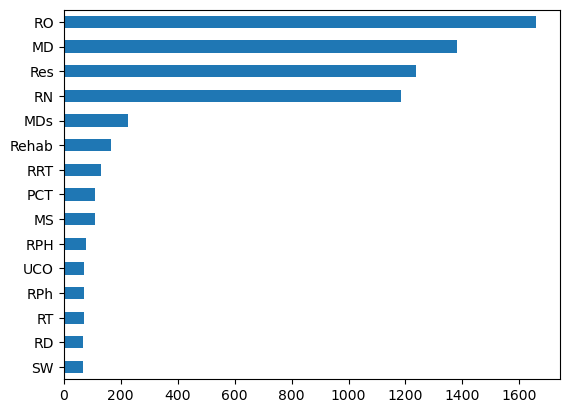

In [38]:
(caregivers.LABEL.value_counts().head(15).sort_values()).plot.barh()

In [36]:
caregivers.DESCRIPTION.value_counts().sum()

5155

<AxesSubplot: >

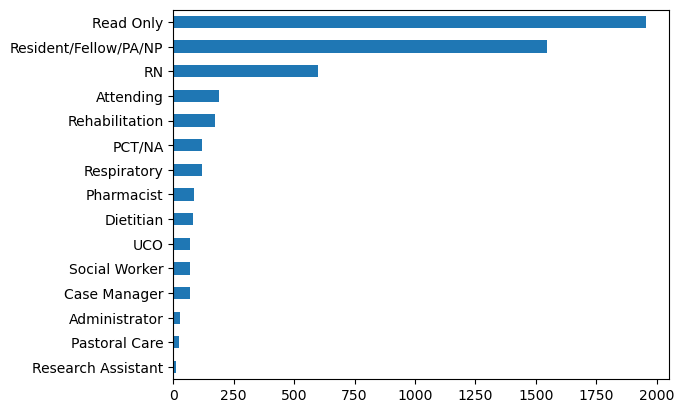

In [37]:
(caregivers.DESCRIPTION.value_counts().head(15).sort_values()).plot.barh()

**********************************************************************************************************************

## 2.4 chartevents

This table is one of the largest tables in the MIMIC-III dataset, and contains more than 330 million rows.


### 2.4.1 Data description

row_id: The unique identifier for each row in the table. This is an integer value.

subject_id: The unique identifier for each patient. This is an integer value that can be used to link the chartevents table to other tables in the MIMIC-III dataset.

hadm_id: The unique identifier for the hospital admission during which the observation was collected. This is an integer value that can be used to link the chartevents table to other tables in the MIMIC-III dataset.

icustay_id: The unique identifier for the ICU stay during which the observation was collected. This is an integer value that can be used to link the chartevents table to other tables in the MIMIC-III dataset.

itemid: The unique identifier for the type of measurement or observation that was collected. This is an integer value that can be used to link the chartevents table to the d_items table in the MIMIC-III dataset.

charttime: The date and time at which the measurement or observation was recorded. This is a timestamp value.

value: The actual value of the measurement or observation that was recorded. This can be a numeric value or a free-text value, depending on the type of measurement or observation.

valuenum: If the value is numeric, this field contains the numeric value of the measurement or observation. If the value is not numeric, this field is null.

valueuom: The unit of measurement for the value. For example, if the value is a weight measurement, the unit of measurement might be "kg".

warning: A binary flag that indicates whether the measurement or observation triggered a warning or alert. A value of 1 indicates that a warning or alert was triggered.

error: A binary flag that indicates whether the measurement or observation was recorded in error. A value of 1 indicates that the measurement or observation was recorded in error.

### 2.4.2 Importing data

In [76]:
# Query to fetch all chartevents data of patients with itemid '220210' (Respiratory Rate) 

resp_rate_query = "SELECT subject_id, hadm_id, valuenum as resp_rate_valuenum FROM mimiciii.chartevents where itemid = 220210;"



In [77]:
%time resp_rate_chartevents = pd.read_sql(resp_rate_query, athena_connect)
resp_rate_chartevents.head()


CPU times: user 53.8 s, sys: 583 ms, total: 54.3 s
Wall time: 5min 4s


,subject_id,hadm_id,resp_rate_valuenum
0,36,165660,21.0
1,36,165660,19.0
2,36,165660,20.0
3,36,165660,20.0
4,34,144319,26.0


In [78]:
# Query to fetch all chartevents data of patients with itemid '220277' (O2 saturation pulseoxymetry) 

spO2_query = "SELECT subject_id, hadm_id, valuenum as spO2_valuenum FROM mimiciii.chartevents where itemid = 220277;"


In [79]:
%time spO2_chartevents = pd.read_sql(spO2_query, athena_connect)
spO2_chartevents.head()

CPU times: user 51.6 s, sys: 421 ms, total: 52 s
Wall time: 4min 55s


,subject_id,hadm_id,spO2_valuenum
0,50302,181486,100.0
1,50362,109359,100.0
2,50362,109359,100.0
3,50415,139744,98.0
4,50415,139744,98.0


In [80]:
# Query to fetch all chartevents data of patients with itemid '220045' (Heart Rate) 

hr_query = "SELECT subject_id, hadm_id, valuenum as hr_valuenum FROM mimiciii.chartevents where itemid = 220045;"

In [81]:
%time hr_chartevents = pd.read_sql(hr_query, athena_connect)

CPU times: user 53.5 s, sys: 586 ms, total: 54.1 s
Wall time: 4min 58s


In [82]:
hr_chartevents.head()

,subject_id,hadm_id,hr_valuenum
0,70191,116326,79.0
1,70191,116326,93.0
2,70191,116326,83.0
3,70191,116326,84.0
4,70191,116326,74.0


### 2.4.3 Descriptive analysis

In [ ]:
chartevents.head()

### 2.4.4 Data cleaning

In [103]:
def compute_stats(df, prefix):
    """
    Groups a DataFrame by 'hadm_id' and computes the mean, min, and max of a column.
    
    Args:
    df (pandas.DataFrame): Input DataFrame containing 'subject_id' and 'valuenum' columns.
    prefix (str): String to replace 'column_name' in the output column names.
    
    Returns:
    pandas.DataFrame: DataFrame with columns ['hadm_id', '{prefix}_mean', '{prefix}_min', '{prefix}_max'].
    """
    # Group DataFrame by 'subject_id' and calculate mean, min, and max of the column
    grouped = df.groupby('hadm_id')[f'{prefix}_valuenum'].agg(['mean', 'min', 'max'])
    
    # Rename columns for clarity
    colnames = [f'{prefix}_{x}' for x in ['mean', 'min', 'max']]
    grouped.columns = colnames
    
    # Reset index to make 'hadm_id' a column
    grouped = grouped.reset_index()
    
    return grouped

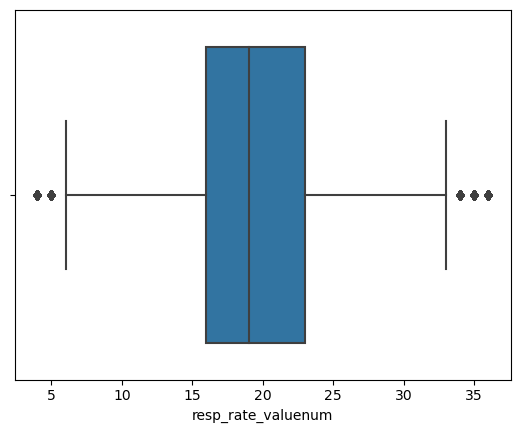

In [104]:
# dealing with outliers in resp_rate column

# creating boxplot
sns.boxplot(x='resp_rate_valuenum', data=resp_rate_chartevents, orient='h')

# show the plot
plt.show()

In [105]:
# removing outliters

resp_rate_chartevents['resp_rate_valuenum'] = remove_outliers(resp_rate_chartevents['resp_rate_valuenum'])

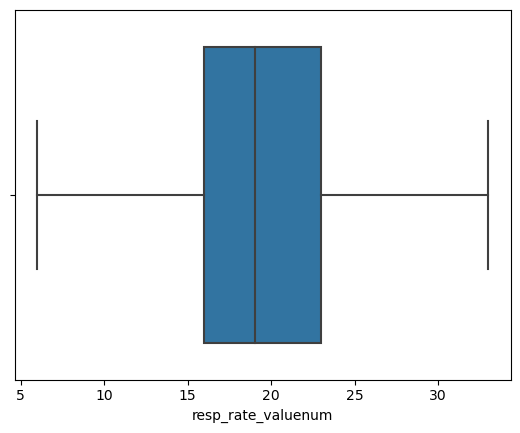

In [106]:
# dealing with outliers in resp_rate column

# creating boxplot
sns.boxplot(x='resp_rate_valuenum', data=resp_rate_chartevents, orient='h')

# show the plot
plt.show()

In [107]:
# check for Nan values 

na_percentage(resp_rate_chartevents)

(          Column Name  NA Count  NA %
 0          subject_id         0  0.00
 1             hadm_id         0  0.00
 2  resp_rate_valuenum     37605  1.39,
 [])

In [108]:

resp_rate_chartevents.dropna(inplace=True)

In [109]:
# computing mean, min and max for 'Respiratory Rate'

grouped_resp_rate_chartevents = compute_stats(resp_rate_chartevents, 'resp_rate')

In [110]:
# cleaning spO2_chartevents 

spO2_chartevents['spO2_valuenum'] = remove_outliers(spO2_chartevents['spO2_valuenum'])

# check for Nan values 

na_percentage(spO2_chartevents)

(     Column Name  NA Count  NA %
 0     subject_id         0   0.0
 1        hadm_id         0   0.0
 2  spO2_valuenum         0   0.0,
 [])

In [111]:
spO2_chartevents.dropna(inplace=True)

In [112]:
# computing mean, min and max for 'O2 saturation pulseoxymetry'

grouped_spO2_chartevents = compute_stats(spO2_chartevents, 'spO2')

grouped_spO2_chartevents.head()

,hadm_id,spO2_mean,spO2_min,spO2_max
0,100001,97.604167,96.0,100.0
1,100003,98.739130,96.0,100.0
2,100009,96.174603,91.0,100.0
3,100010,99.378378,93.0,100.0
4,100011,99.201365,90.0,100.0


In [113]:
# cleaning hr_chartevents 

hr_chartevents['hr_valuenum'] = remove_outliers(hr_chartevents['hr_valuenum'])

# check for Nan values 

na_percentage(hr_chartevents)

(   Column Name  NA Count  NA %
 0   subject_id         0   0.0
 1      hadm_id         0   0.0
 2  hr_valuenum         0   0.0,
 [])

In [114]:
hr_chartevents.dropna(inplace=True)

In [115]:
# computing mean, min and max for 'Heart Rate'

grouped_hr_chartevents = compute_stats(hr_chartevents, 'hr')

grouped_hr_chartevents.head()

,hadm_id,hr_mean,hr_min,hr_max
0,100001,111.313953,75.0,131.0
1,100003,81.218182,69.0,104.0
2,100009,68.968750,46.0,92.0
3,100010,80.135135,56.0,109.0
4,100011,95.191781,68.0,133.0


### 2.4.5 Merging chartevents table

In [121]:
merge_1 = pd.merge(grouped_hr_chartevents, grouped_spO2_chartevents, how='left', on='hadm_id')

In [122]:
merge_1.head()

,hadm_id,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max
0,100001,111.313953,75.0,131.0,97.604167,96.0,100.0
1,100003,81.218182,69.0,104.0,98.739130,96.0,100.0
2,100009,68.968750,46.0,92.0,96.174603,91.0,100.0
3,100010,80.135135,56.0,109.0,99.378378,93.0,100.0
4,100011,95.191781,68.0,133.0,99.201365,90.0,100.0


In [123]:
na_percentage(merge_1)

(  Column Name  NA Count  NA %
 0     hadm_id         0  0.00
 1     hr_mean         0  0.00
 2      hr_min         0  0.00
 3      hr_max         0  0.00
 4   spO2_mean        37  0.17
 5    spO2_min        37  0.17
 6    spO2_max        37  0.17,
 [])

In [124]:
merge_2 = pd.merge(merge_1, grouped_resp_rate_chartevents, how='left', on='hadm_id')

In [125]:
merge_2.head()

,hadm_id,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,100001,111.313953,75.0,131.0,97.604167,96.0,100.0,17.357143,14.0,22.0
1,100003,81.218182,69.0,104.0,98.739130,96.0,100.0,15.818182,11.0,23.0
2,100009,68.968750,46.0,92.0,96.174603,91.0,100.0,23.135593,8.0,32.0
3,100010,80.135135,56.0,109.0,99.378378,93.0,100.0,15.378378,7.0,23.0
4,100011,95.191781,68.0,133.0,99.201365,90.0,100.0,21.010526,6.0,33.0


In [126]:
na_percentage(merge_2)

(      Column Name  NA Count  NA %
 0         hadm_id         0  0.00
 1         hr_mean         0  0.00
 2          hr_min         0  0.00
 3          hr_max         0  0.00
 4       spO2_mean        37  0.17
 5        spO2_min        37  0.17
 6        spO2_max        37  0.17
 7  resp_rate_mean        12  0.05
 8   resp_rate_min        12  0.05
 9   resp_rate_max        12  0.05,
 [])

In [130]:
chartevents_cleaned = merge_2.dropna()

In [131]:
chartevents_cleaned.head()

,hadm_id,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,100001,111.313953,75.0,131.0,97.604167,96.0,100.0,17.357143,14.0,22.0
1,100003,81.218182,69.0,104.0,98.739130,96.0,100.0,15.818182,11.0,23.0
2,100009,68.968750,46.0,92.0,96.174603,91.0,100.0,23.135593,8.0,32.0
3,100010,80.135135,56.0,109.0,99.378378,93.0,100.0,15.378378,7.0,23.0
4,100011,95.191781,68.0,133.0,99.201365,90.0,100.0,21.010526,6.0,33.0


In [132]:
chartevents_cleaned.shape

(21877, 10)

In [133]:
chartevents_cleaned.to_csv('chartevents_cleaned.csv')

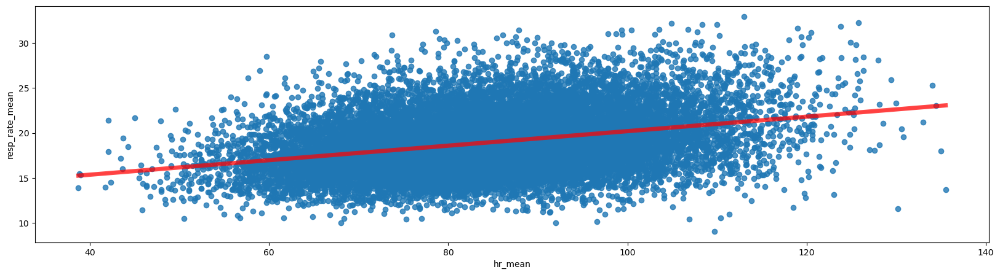

In [217]:
# scatter plot between 'hr_mean' and 'resp_rate_mean'

sns.regplot(x=merged_chartevents["hr_mean"], y=merged_chartevents["resp_rate_mean"],
            line_kws={"color":"r","alpha":0.7,"lw":5})
plt.show()

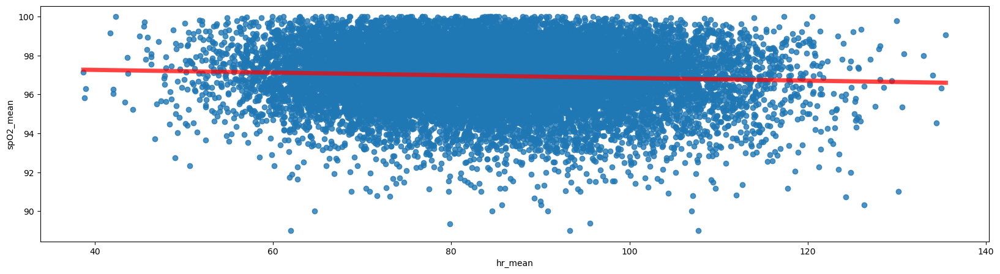

In [219]:
# scatter plot between 'hr_mean' and 'spO2_mean'
sns.regplot(x=merged_chartevents["hr_mean"], y=merged_chartevents["spO2_mean"],
            line_kws={"color":"r","alpha":0.7,"lw":5})
plt.show()

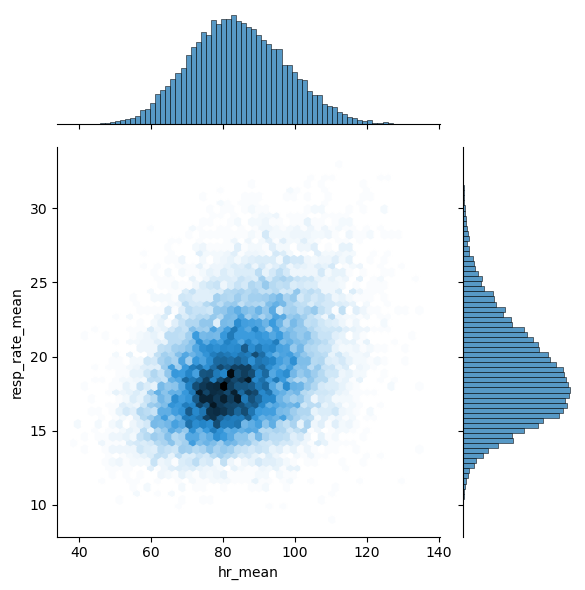

In [223]:
sns.jointplot(x=merged_chartevents["hr_mean"], y=merged_chartevents["resp_rate_mean"], kind='hex', ratio=3)

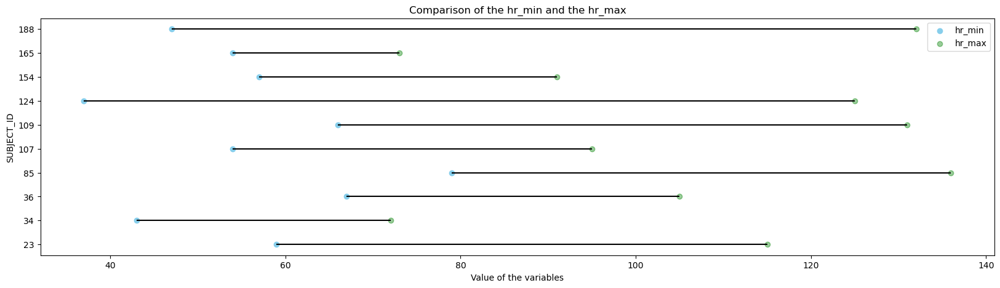

In [242]:
# plotting lollipop plot for visualizing the heart rate range
# Reorder it following the values of the first value:

ordered_df = merged_chartevents[:10].sort_values(by='SUBJECT_ID')
my_range=range(1,len(merged_chartevents[:10].index)+1)
 
# The horizontal plot is made using the hline function
plt.hlines(y=my_range, xmin=ordered_df['hr_min'], xmax=ordered_df['hr_max'], color='black', alpha=1)
plt.scatter(ordered_df['hr_min'], my_range, color='skyblue', alpha=1, label='hr_min')
plt.scatter(ordered_df['hr_max'], my_range, color='green', alpha=0.4 , label='hr_max')
plt.legend()
 
# Add title and axis names
plt.yticks(my_range, ordered_df['SUBJECT_ID'])
plt.title("Comparison of the hr_min and the hr_max", loc='center')
plt.xlabel('Value of the variables')
plt.ylabel('SUBJECT_ID')

# Show the graph
plt.show()

In [246]:
admissions[admissions["SUBJECT_ID"]==188]

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
464,245,188,160697,2157-01-11 16:56:00,2157-01-19 14:58:00,NaN,EMERGENCY,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Private,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,LIVER FAILURE,0,1
465,246,188,191517,2157-03-07 11:08:00,2157-03-10 13:50:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,ENGL,CATHOLIC,MARRIED,WHITE,2157-03-07 10:14:00,2157-03-07 11:25:00,SEPSIS,0,1
466,247,188,150463,2157-11-17 12:11:00,2157-11-20 13:05:00,NaN,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME,Private,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,POST BIOPSY BLOOD,0,1
467,248,188,192557,2160-11-25 21:55:00,2160-11-28 12:42:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,Private,ENGL,CATHOLIC,MARRIED,WHITE,2160-11-25 19:39:00,2160-11-25 23:20:00,HEPATIC ENCEPHALOPATHY,0,1
468,249,188,123860,2160-12-31 12:34:00,2161-01-08 19:50:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,Private,ENGL,CATHOLIC,MARRIED,WHITE,2160-12-31 11:52:00,2160-12-31 13:26:00,HEPATIC ENCEPHALOPATHY,0,1
469,250,188,164735,2161-07-01 19:44:00,2161-07-10 20:00:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,Private,ENGL,CATHOLIC,MARRIED,WHITE,2161-07-01 18:46:00,2161-07-01 20:45:00,GASTROINTESTINAL BLEED;HYPOTENSION,0,1
470,251,188,132401,2161-11-01 17:48:00,2162-01-17 05:50:00,2162-01-17 05:50:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,DEAD/EXPIRED,Private,ENGL,CATHOLIC,MARRIED,WHITE,2161-11-01 08:30:00,2161-11-01 19:12:00,BACK PAIN,1,1


In [248]:
admissions[admissions["SUBJECT_ID"]==124]

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
128,167,124,112906,2161-12-17 03:39:00,2161-12-24 15:35:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Medicare,NaN,CATHOLIC,MARRIED,WHITE,2161-12-16 18:57:00,2161-12-17 12:35:00,"CHEST PAIN,R/O MI",0,1
129,168,124,134369,2165-05-21 21:02:00,2165-06-06 16:00:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,REHAB/DISTINCT PART HOSP,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,CLAUDICATION,0,1
130,169,124,138376,2165-12-31 18:55:00,2166-02-01 06:55:00,2166-02-01 06:55:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,DEAD/EXPIRED,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,PNEUMONIA;CHRONIC OBST PULM DISEASE,1,1
210,166,124,172461,2160-06-24 21:25:00,2160-07-15 15:10:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Private,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CVA,0,1


When there is a higher range between the minimum and maximum heart rate, it implies that the patient's heart rate is fluctuating more and possibly experiencing more stress on the cardiovascular system. A high range can also indicate whether the patient has a high mortality rate.

**********************************************************************************************************************

## 2.5 cptevents

### 2.5.1 Data description

The CPTevents table in the MIMIC-III dataset is a relational table that contains information about Current Procedural Terminology (CPT) codes recorded during a patient's hospital stay. CPT codes are used to describe medical procedures and services provided by healthcare providers.

row_id: The unique identifier for each row in the table. This is an integer value.

subject_id: The unique identifier for each patient. This is an integer value that can be used to link the CPTevents table to other tables in the MIMIC-III dataset.

hadm_id: The unique identifier for the hospital admission during which the procedure was performed. This is an integer value that can be used to link the CPTevents table to other tables in the MIMIC-III dataset.

costcenter: A free-text label that describes the cost center responsible for the procedure. Examples include "ICU", "Operating Room", and "Recovery Room".

chartdate: The date on which the procedure was recorded in the patient's chart. This is a date value.

cpt_cd: The unique CPT code for the procedure. This is a free-text field.

cpt_number: The numerical part of the CPT code.

cpt_suffix: The suffix part of the CPT code.

ticket_id_seq: A unique identifier for the ticket associated with the procedure. This is an integer value.

### 2.5.2 Importing data

In [45]:
data_key = 'CPTEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

cptevents = pd.read_csv(data_location)

/tmp/ipykernel_9679/3125612505.py:5: DtypeWarning: Columns (4,5,7,11) have mixed types. Specify dtype option on import or set low_memory=False.
  cptevents = pd.read_csv(data_location)


In [46]:
cptevents.shape

(573146, 12)

### 2.5.3 Descriptive analysis

In [48]:
cptevents.head().T

,0,1,2,3,4
ROW_ID,317,318,319,320,321
SUBJECT_ID,11743,11743,11743,11743,6185
HADM_ID,129545,129545,129545,129545,183725
COSTCENTER,ICU,ICU,ICU,ICU,ICU
CHARTDATE,NaN,NaN,NaN,NaN,NaN
CPT_CD,99232,99232,99232,99232,99223
CPT_NUMBER,99232.0,99232.0,99232.0,99232.0,99223.0
CPT_SUFFIX,NaN,NaN,NaN,NaN,NaN
TICKET_ID_SEQ,6.0,7.0,8.0,9.0,1.0
SECTIONHEADER,Evaluation and management,Evaluation and management,Evaluation and management,Evaluation and management,Evaluation and management


**********************************************************************************************************************

## 2.6 d_cpt

### 2.6.1 Data description

The d_cpt table in the MIMIC-III dataset is a reference table that contains information about Current Procedural Terminology (CPT) codes used in medical procedures and services. CPT codes are used to describe medical procedures and services provided by healthcare providers.

row_id: The unique identifier for each row in the table. This is an integer value.

category: The broad category of the procedure or service described by the CPT code. This is a free-text field.

sectionrange: The range of sections to which the CPT code belongs. This is a free-text field.

sectionheader: The name of the section to which the CPT code belongs. This is a free-text field.

subsectionrange: The range of subsections to which the CPT code belongs. This is a free-text field.

subsectionheader: The name of the subsection to which the CPT code belongs. This is a free-text field.

codesuffix: The suffix used in the CPT code. This is a free-text field.

mincodeinsubsection: The minimum CPT code within the subsection. This is a free-text field.

maxcodeinsubsection: The maximum CPT code within the subsection. This is a free-text field.

### 2.6.2 Importing data

In [49]:
data_key = 'D_CPT.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

d_cpt = pd.read_csv(data_location)

### 2.6.3 Descriptive analysis

In [51]:
d_cpt.shape

(134, 9)

In [50]:
d_cpt.head()

,ROW_ID,CATEGORY,SECTIONRANGE,SECTIONHEADER,SUBSECTIONRANGE,SUBSECTIONHEADER,CODESUFFIX,MINCODEINSUBSECTION,MAXCODEINSUBSECTION
0,1,1,99201-99499,Evaluation and management,99201-99216,Office/other outpatient services,NaN,99201,99216
1,2,1,99201-99499,Evaluation and management,99217-99220,Hospital observation services,NaN,99217,99220
2,3,1,99201-99499,Evaluation and management,99221-99239,Hospital inpatient services,NaN,99221,99239
3,4,1,99201-99499,Evaluation and management,99241-99255,Consultations,NaN,99241,99255
4,5,1,99201-99499,Evaluation and management,99261-99263,Follow-up inpatient consultations (deleted codes),NaN,99261,99263


**********************************************************************************************************************

## 2.7 d_icd_diagnoses

### 2.7.1 Data description

The d_icd_diagnoses table in the MIMIC-III dataset is a reference table that contains information about International Classification of Diseases, 9th Revision (ICD-9) codes used to describe patient diagnoses. ICD-9 codes are used to classify and code diagnoses, symptoms, and procedures in medical records.

row_id: The unique identifier for each row in the table. This is an integer value.

icd9_code: The unique ICD-9 code for the diagnosis. This is a free-text field.

short_title: A short title for the diagnosis. This is a free-text field.

long_title: A longer description of the diagnosis. This is a free-text field.


### 2.7.2 Importing data

In [24]:
data_key = 'D_ICD_DIAGNOSES.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

d_icd_diagnoses = pd.read_csv(data_location)

### 2.7.3 Descriptive analysis

In [53]:
d_icd_diagnoses.shape

(14567, 4)

In [54]:
d_icd_diagnoses.head()

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,174,01166,TB pneumonia-oth test,"Tuberculous pneumonia [any form], tubercle bac..."
1,175,01170,TB pneumothorax-unspec,"Tuberculous pneumothorax, unspecified"
2,176,01171,TB pneumothorax-no exam,"Tuberculous pneumothorax, bacteriological or h..."
3,177,01172,TB pneumothorx-exam unkn,"Tuberculous pneumothorax, bacteriological or h..."
4,178,01173,TB pneumothorax-micro dx,"Tuberculous pneumothorax, tubercle bacilli fou..."


**********************************************************************************************************************

## 2.8 d_icd_procedures

### 2.8.1 Data description

The d_icd_procedures table in the MIMIC-III dataset is a reference table that contains information about International Classification of Diseases, 9th Revision (ICD-9) codes used to describe medical procedures. ICD-9 codes are used to classify and code diagnoses, symptoms, and procedures in medical records.

row_id: The unique identifier for each row in the table. This is an integer value.

icd9_code: The unique ICD-9 code for the procedure. This is a free-text field.

short_title: A short title for the procedure. This is a free-text field.

long_title: A longer description of the procedure. This is a free-text field.

### 2.8.2 Importing data

In [56]:
data_key = 'D_ICD_PROCEDURES.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

d_icd_procedures = pd.read_csv(data_location)

### 2.8.3 Descriptive analysis

In [57]:
d_icd_procedures.shape

(3882, 4)

In [58]:
d_icd_procedures.head()

,ROW_ID,ICD9_CODE,SHORT_TITLE,LONG_TITLE
0,264,851,Canthotomy,Canthotomy
1,265,852,Blepharorrhaphy,Blepharorrhaphy
2,266,859,Adjust lid position NEC,Other adjustment of lid position
3,267,861,Lid reconst w skin graft,Reconstruction of eyelid with skin flap or graft
4,268,862,Lid reconst w muc graft,Reconstruction of eyelid with mucous membrane ...


**********************************************************************************************************************

## 2.9 d_items

### 2.9.1 Data description

The "d_items" table in the MIMIC-III dataset contains information about all of the items that were recorded in the patient records. Each item has a unique identifier (ITEMID), a short name (LABEL), a more detailed description (ABBREVIATION), and a category (LINKSTO). The table also includes information about the units of measurement used for each item (UNITNAME, UNITID) and the range of values that are considered normal for each item (NORMAL_LOW, NORMAL_HIGH).


ITEMID: Unique identifier for the item

LABEL: Short name for the item

ABBREVIATION: More detailed description of the item

DBSOURCE: The source database for the item

LINKSTO: The category that the item belongs to (e.g. vital signs, laboratory tests)

CATEGORY: The category that the item belongs to (e.g. vital signs, laboratory tests)

UNITNAME: The name of the unit of measurement used for the item (e.g. beats per minute, milligrams per deciliter)

### 2.9.2 Importing data

In [30]:
data_key = 'D_ITEMS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

d_items = pd.read_csv(data_location)

### 2.9.3 Descriptive analysis

In [125]:
d_items.shape

(12487, 10)

In [126]:
d_items.head()

,ROW_ID,ITEMID,LABEL,ABBREVIATION,DBSOURCE,LINKSTO,CATEGORY,UNITNAME,PARAM_TYPE,CONCEPTID
0,457,497,Patient controlled analgesia (PCA) [Inject],NaN,carevue,chartevents,NaN,NaN,NaN,NaN
1,458,498,PCA Lockout (Min),NaN,carevue,chartevents,NaN,NaN,NaN,NaN
2,459,499,PCA Medication,NaN,carevue,chartevents,NaN,NaN,NaN,NaN
3,460,500,PCA Total Dose,NaN,carevue,chartevents,NaN,NaN,NaN,NaN
4,461,501,PCV Exh Vt (Obser),NaN,carevue,chartevents,NaN,NaN,NaN,NaN


In [137]:
d_items.dtypes

ROW_ID            int64
ITEMID            int64
LABEL            object
ABBREVIATION     object
DBSOURCE         object
LINKSTO          object
CATEGORY         object
UNITNAME         object
PARAM_TYPE       object
CONCEPTID       float64
dtype: object

In [128]:
d_items.LINKSTO.value_counts()

chartevents           7212
inputevents_cv        2938
outputevents          1161
microbiologyevents     436
inputevents_mv         422
datetimeevents         193
procedureevents_mv     125
Name: LINKSTO, dtype: int64

### 2.9.4 Cleaning table

In [127]:
na_percentage(d_items)

(    Column Name  NA Count    NA %
 0        ROW_ID         0    0.00
 1        ITEMID         0    0.00
 2         LABEL         4    0.03
 3  ABBREVIATION      9495   76.04
 4      DBSOURCE         0    0.00
 5       LINKSTO         0    0.00
 6      CATEGORY      6438   51.56
 7      UNITNAME     11253   90.12
 8    PARAM_TYPE      9495   76.04
 9     CONCEPTID     12487  100.00,
 ['ABBREVIATION', 'CATEGORY', 'UNITNAME', 'PARAM_TYPE', 'CONCEPTID'])

In [32]:
# removing unwanted columns

col_to_drop = ['ROW_ID', 'ABBREVIATION', 'DBSOURCE', 'LINKSTO',
       'CATEGORY', 'UNITNAME', 'PARAM_TYPE', 'CONCEPTID']

In [33]:
d_items.drop(columns=col_to_drop, inplace=True)

In [36]:
# dropping NaN values

d_items.dropna(inplace=True)

In [37]:
d_items.head()

,ITEMID,LABEL
0,497,Patient controlled analgesia (PCA) [Inject]
1,498,PCA Lockout (Min)
2,499,PCA Medication
3,500,PCA Total Dose
4,501,PCV Exh Vt (Obser)


**********************************************************************************************************************

## 2.10 d_labitems

### 2.10.1 Data description

The "d_labitems" table in the MIMIC-III v1.4 dataset contains information about all of the laboratory tests that were performed on the patients. Each test has a unique identifier (ITEMID), a short name (LABEL), a more detailed description (FLUID), and a category (CATEGORY).

ITEMID: Unique identifier for the laboratory test

LABEL: Short name for the test

FLUID: More detailed description of the fluid that was tested

CATEGORY: The category that the test belongs to (e.g. blood gas, chemistry)

LOINC_CODE: The LOINC code associated with the test


### 2.10.2 Importing data

In [103]:
data_key = 'D_LABITEMS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

d_labitems = pd.read_csv(data_location)

### 2.10.3 Descriptive analysis

In [104]:
d_labitems.shape

(753, 6)

In [105]:
d_labitems.head()

,ROW_ID,ITEMID,LABEL,FLUID,CATEGORY,LOINC_CODE
0,546,51346,Blasts,Cerebrospinal Fluid (CSF),Hematology,26447-3
1,547,51347,Eosinophils,Cerebrospinal Fluid (CSF),Hematology,26451-5
2,548,51348,"Hematocrit, CSF",Cerebrospinal Fluid (CSF),Hematology,30398-2
3,549,51349,Hypersegmented Neutrophils,Cerebrospinal Fluid (CSF),Hematology,26506-6
4,550,51350,Immunophenotyping,Cerebrospinal Fluid (CSF),Hematology,NaN


<AxesSubplot: >

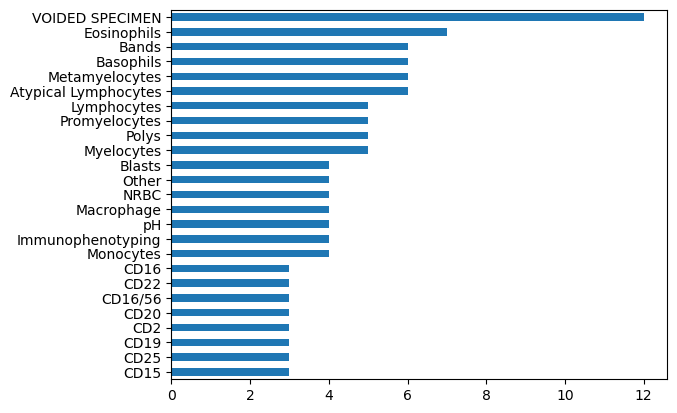

In [76]:
# Count of LABEL column

(d_labitems.LABEL.value_counts().head(25).sort_values()).plot.barh()

<AxesSubplot: >

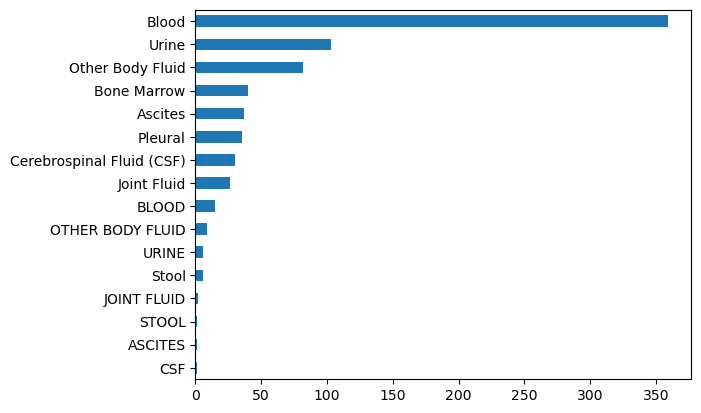

In [77]:
# Count of FLUID column

(d_labitems.FLUID.value_counts().head(25).sort_values()).plot.barh()

<AxesSubplot: >

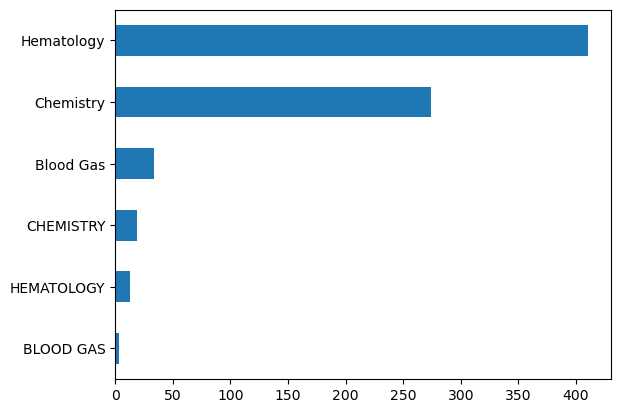

In [78]:
# Count of CATEGORY column

(d_labitems.CATEGORY.value_counts().head(25).sort_values()).plot.barh()

### 2.10.4 Cleaning table

In [106]:
# checking for NaN values

na_percentage(d_labitems)

(  Column Name  NA Count   NA %
 0      ROW_ID         0   0.00
 1      ITEMID         0   0.00
 2       LABEL         0   0.00
 3       FLUID         0   0.00
 4    CATEGORY         0   0.00
 5  LOINC_CODE       168  22.31,
 [])

In [107]:
# dropping unwanted columns 

col_to_drop = ['ROW_ID', 'LOINC_CODE', 'CATEGORY']

In [108]:
d_labitems.drop(columns=col_to_drop, inplace=True)

In [109]:
d_labitems.dtypes

ITEMID     int64
LABEL     object
FLUID     object
dtype: object

In [110]:
d_labitems.head()

,ITEMID,LABEL,FLUID
0,51346,Blasts,Cerebrospinal Fluid (CSF)
1,51347,Eosinophils,Cerebrospinal Fluid (CSF)
2,51348,"Hematocrit, CSF",Cerebrospinal Fluid (CSF)
3,51349,Hypersegmented Neutrophils,Cerebrospinal Fluid (CSF)
4,51350,Immunophenotyping,Cerebrospinal Fluid (CSF)


**********************************************************************************************************************

## 2.11 datatimeevents

### 2.11.1 Data description

The "datetimeevents" table in the MIMIC-III dataset contains information about all of the time-stamped events that occurred during a patient's stay in the hospital. Each event is associated with a unique identifier (ROW_ID), a unique identifier for the patient (SUBJECT_ID), a unique identifier for the hospital admission (HADM_ID), the type of event (ITEMID), the time the event occurred (CHARTTIME), and the value associated with the event (VALUE).


ROW_ID: Unique identifier for the event

SUBJECT_ID: Unique identifier for the patient

HADM_ID: Unique identifier for the hospital admission

ITEMID: Unique identifier for the type of event (e.g. heart rate, respiratory rate)

CHARTTIME: The time that the event occurred

VALUE: The value associated with the event (e.g. 72 bpm for heart rate)

### 2.11.2 Importing data

In [19]:
data_key = 'DATETIMEEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

datetimeevents = pd.read_csv(data_location)

/tmp/ipykernel_12346/1805211499.py:5: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  datetimeevents = pd.read_csv(data_location)


### 2.11.3 Descriptive analysis

In [20]:
datetimeevents.shape

(4485937, 14)

In [21]:
datetimeevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,ITEMID,CHARTTIME,STORETIME,CGID,VALUE,VALUEUOM,WARNING,ERROR,RESULTSTATUS,STOPPED
0,711,7657,121183.0,297945.0,3411,2172-03-14 11:00:00,2172-03-14 11:52:00,16446,NaN,Date,NaN,NaN,NaN,NotStopd
1,712,7657,121183.0,297945.0,3411,2172-03-14 13:00:00,2172-03-14 12:36:00,16446,NaN,Date,NaN,NaN,NaN,NotStopd
2,713,7657,121183.0,297945.0,3411,2172-03-14 15:00:00,2172-03-14 15:10:00,14957,NaN,Date,NaN,NaN,NaN,NotStopd
3,714,7657,121183.0,297945.0,3411,2172-03-14 17:00:00,2172-03-14 17:01:00,16446,NaN,Date,NaN,NaN,NaN,NotStopd
4,715,7657,121183.0,297945.0,3411,2172-03-14 19:00:00,2172-03-14 19:29:00,14815,NaN,Date,NaN,NaN,NaN,NotStopd


**********************************************************************************************************************

## 2.12 diagnoses_icd

### 2.12.1 Data description

The "diagnoses_icd" table in the MIMIC-III dataset contains information about the International Classification of Diseases, Ninth Revision, Clinical Modification (ICD-9-CM) codes assigned to patients during their hospital stays. Each diagnosis is associated with a unique identifier (ROW_ID), a unique identifier for the patient (SUBJECT_ID), a unique identifier for the hospital admission (HADM_ID), and the ICD-9-CM code (ICD9_CODE) assigned to the diagnosis.

ROW_ID: Unique identifier for the diagnosis

SUBJECT_ID: Unique identifier for the patient

HADM_ID: Unique identifier for the hospital admission

SEQ_NUM: A sequence number assigned to the diagnosis, indicating the order in which the diagnoses were recorded

ICD9_CODE: The ICD-9-CM code assigned to the diagnosis

### 2.12.2 Importing data

In [146]:
data_key = 'DIAGNOSES_ICD.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

diagnoses_icd = pd.read_csv(data_location)

### 2.12.3 Descriptive analysis

In [13]:
diagnoses_icd.shape

(651047, 5)

In [14]:
diagnoses_icd.head()

,ROW_ID,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
0,1297,109,172335,1.0,40301
1,1298,109,172335,2.0,486
2,1299,109,172335,3.0,58281
3,1300,109,172335,4.0,5855
4,1301,109,172335,5.0,4254


In [34]:
# total count of unique "ICD9_CODE"

diagnoses_icd.ICD9_CODE.value_counts().unique().sum()

489635

<AxesSubplot: >

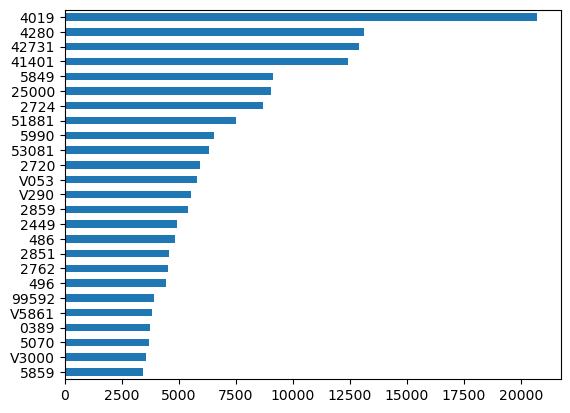

In [28]:
# Top 25 "ICD9_CODES" (diagnoses codes)

(diagnoses_icd.ICD9_CODE.value_counts().head(25).sort_values()).plot.barh()

In [194]:
# count of each "SEQ_NUM"

diagnoses_icd.SEQ_NUM.value_counts()

1.0     58929
2.0     58555
3.0     57498
4.0     54699
5.0     51421
6.0     47914
7.0     44202
8.0     40327
9.0     36360
10.0    27258
11.0    24546
12.0    21877
13.0    19333
14.0    16999
15.0    14764
16.0    12759
17.0    10894
18.0     9186
19.0     7725
20.0     6438
21.0     5332
22.0     4390
23.0     3643
24.0     3001
25.0     2491
26.0     2075
27.0     1702
28.0     1405
29.0     1133
30.0      930
31.0      736
32.0      598
33.0      480
34.0      377
35.0      316
36.0      251
37.0      186
38.0      150
39.0      120
Name: SEQ_NUM, dtype: int64

<AxesSubplot: >

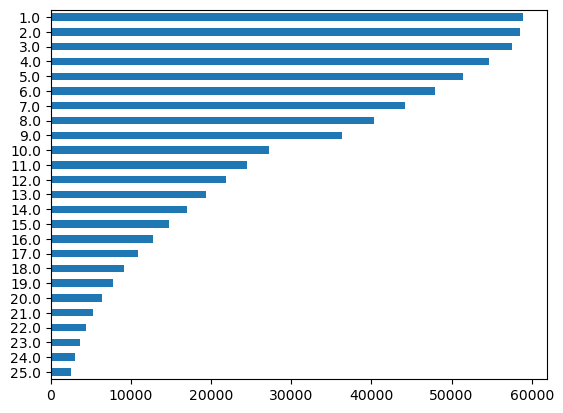

In [192]:
# Top 25 SEQ_NUM 

(diagnoses_icd.SEQ_NUM.value_counts().head(25).sort_values()).plot.barh()

### 2.12.4 Cleaning table

In [15]:
na_percentage(diagnoses_icd)

(  Column Name  NA Count  NA %
 0      ROW_ID         0  0.00
 1  SUBJECT_ID         0  0.00
 2     HADM_ID         0  0.00
 3     SEQ_NUM        47  0.01
 4   ICD9_CODE        47  0.01,
 [])

In [22]:
diagnoses_icd.shape

(651047, 5)

In [147]:
# dropping rows having NA values

diagnoses_icd.dropna(inplace=True)

In [148]:
# dropping unwanted columns

col_to_drop = ['ROW_ID']

diagnoses_icd.drop(columns = col_to_drop, axis=1, inplace=True)

In [150]:
diagnoses_icd.head()

,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
0,109,172335,1.0,40301
1,109,172335,2.0,486
2,109,172335,3.0,58281
3,109,172335,4.0,5855
4,109,172335,5.0,4254


**********************************************************************************************************************

## 2.13 drgcodes

### 2.13.1 Data description

The "drgcodes" table in the MIMIC-III dataset contains information about the Diagnosis Related Group (DRG) codes assigned to patients during their hospital stays. Each DRG code is associated with a unique identifier (ROW_ID), a unique identifier for the patient (SUBJECT_ID), a unique identifier for the hospital admission (HADM_ID), the version of the DRG classification system used (DRG_TYPE), the DRG code (DRG_CODE).

ROW_ID: Unique identifier for the DRG code

SUBJECT_ID: Unique identifier for the patient

HADM_ID: Unique identifier for the hospital admission

DRG_TYPE: The version of the DRG classification system used (e.g. Medicare Severity-Diagnosis Related Group)

DRG_CODE: The DRG code assigned to the hospital stay


### 2.13.2 Importing data

In [25]:
data_key = 'DRGCODES.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

drgcodes = pd.read_csv(data_location)

### 2.13.3 Descriptive analysis

In [26]:
drgcodes.shape

(125557, 8)

In [27]:
drgcodes.head()

,ROW_ID,SUBJECT_ID,HADM_ID,DRG_TYPE,DRG_CODE,DESCRIPTION,DRG_SEVERITY,DRG_MORTALITY
0,342,2491,144486,HCFA,28,"TRAUMATIC STUPOR & COMA, COMA <1 HR AGE >17 WI...",NaN,NaN
1,343,24958,162910,HCFA,110,MAJOR CARDIOVASCULAR PROCEDURES WITH COMPLICAT...,NaN,NaN
2,344,18325,153751,HCFA,390,NEONATE WITH OTHER SIGNIFICANT PROBLEMS,NaN,NaN
3,345,17887,182692,HCFA,14,SPECIFIC CEREBROVASCULAR DISORDERS EXCEPT TRAN...,NaN,NaN
4,346,11113,157980,HCFA,390,NEONATE WITH OTHER SIGNIFICANT PROBLEMS,NaN,NaN


**********************************************************************************************************************

## 2.14 icustays

### 2.14.1 Data description

The ICUSTAYS table in the MIMIC-III dataset contains information on each patient's ICU stay. Each row in the ICUSTAYS table represents a unique ICU admission, with a unique ICU stay ID (ICUSTAY_ID). 

ICUSTAY_ID: Unique identifier for each ICU stay.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

INTIME: Date and time the patient was admitted to the ICU.

OUTTIME: Date and time the patient was discharged from the ICU.

LOS: Length of stay in the ICU for the patient.

ICUType: Categorical variable indicating the type of ICU the patient was admitted to (e.g., medical, surgical, 
coronary care unit).

FIRST_CAREUNIT: Categorical variable indicating the first ICU where the patient was treated during the hospitalization.

LAST_CAREUNIT: Categorical variable indicating the last ICU where the patient was treated during the hospitalization.

FIRST_WARDID: Numeric identifier for the first ICU where the patient was treated during the hospitalization.

LAST_WARDID: Numeric identifier for the last ICU where the patient was treated during the hospitalization.

DBSOURCE: Indicates the source of the data (e.g., hospital electronic health record, billing data).

### 2.14.2 Importing data

In [152]:
data_key = 'ICUSTAYS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time icustays = pd.read_csv(data_location)

CPU times: user 151 ms, sys: 11.9 ms, total: 163 ms
Wall time: 276 ms


### 2.14.3 Descriptive analysis

In [57]:
icustays.shape

(61532, 12)

In [58]:
icustays.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS
0,365,268,110404,280836,carevue,MICU,MICU,52,52,2198-02-14 23:27:38,2198-02-18 05:26:11,3.2490
1,366,269,106296,206613,carevue,MICU,MICU,52,52,2170-11-05 11:05:29,2170-11-08 17:46:57,3.2788
2,367,270,188028,220345,carevue,CCU,CCU,57,57,2128-06-24 15:05:20,2128-06-27 12:32:29,2.8939
3,368,271,173727,249196,carevue,MICU,SICU,52,23,2120-08-07 23:12:42,2120-08-10 00:39:04,2.0600
4,369,272,164716,210407,carevue,CCU,CCU,57,57,2186-12-25 21:08:04,2186-12-27 12:01:13,1.6202


<AxesSubplot: >

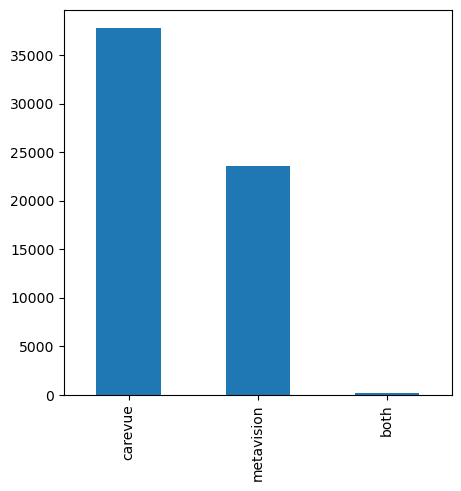

In [70]:
# count of rows based on DBSOURCE column
plt.figure(figsize = (5,5))

(icustays.DBSOURCE.value_counts().plot.bar())

<AxesSubplot: >

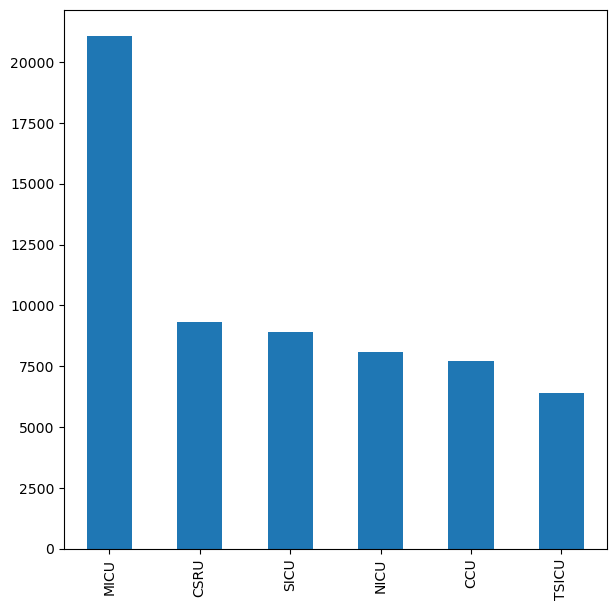

In [72]:
# based on FIRST_CAREUNIT column

plt.figure(figsize = (7,7))

(icustays.FIRST_CAREUNIT.value_counts().head(15)).plot.bar()

<AxesSubplot: >

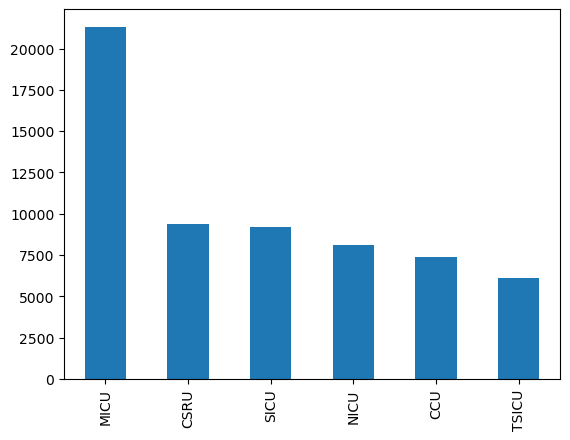

In [94]:
# based on LAST_CAREUNIT column

(icustays.LAST_CAREUNIT.value_counts().head(15)).plot.bar()

### 2.14.4 Cleaning table

In [153]:
# check for na

na_percentage(icustays)

(       Column Name  NA Count  NA %
 0           ROW_ID         0  0.00
 1       SUBJECT_ID         0  0.00
 2          HADM_ID         0  0.00
 3       ICUSTAY_ID         0  0.00
 4         DBSOURCE         0  0.00
 5   FIRST_CAREUNIT         0  0.00
 6    LAST_CAREUNIT         0  0.00
 7     FIRST_WARDID         0  0.00
 8      LAST_WARDID         0  0.00
 9           INTIME         0  0.00
 10         OUTTIME        10  0.02
 11             LOS        10  0.02,
 [])

In [154]:
# dropping rows with NA values

icustays = icustays.dropna()

In [155]:
icustays.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS
0,365,268,110404,280836,carevue,MICU,MICU,52,52,2198-02-14 23:27:38,2198-02-18 05:26:11,3.2490
1,366,269,106296,206613,carevue,MICU,MICU,52,52,2170-11-05 11:05:29,2170-11-08 17:46:57,3.2788
2,367,270,188028,220345,carevue,CCU,CCU,57,57,2128-06-24 15:05:20,2128-06-27 12:32:29,2.8939
3,368,271,173727,249196,carevue,MICU,SICU,52,23,2120-08-07 23:12:42,2120-08-10 00:39:04,2.0600
4,369,272,164716,210407,carevue,CCU,CCU,57,57,2186-12-25 21:08:04,2186-12-27 12:01:13,1.6202


In [156]:
# dropping "ROW_ID"
# dropping "INTIME" and "OUTTIME" because they are used to compute LOS

col_to_drop = ["ROW_ID", 'ICUSTAY_ID', "INTIME", "OUTTIME", 'DBSOURCE', "FIRST_CAREUNIT", "LAST_CAREUNIT", "FIRST_WARDID",
               'LAST_WARDID']


In [157]:
icustays = icustays.drop(columns=col_to_drop, axis=1)

In [158]:
icustays.head()

,SUBJECT_ID,HADM_ID,LOS
0,268,110404,3.2490
1,269,106296,3.2788
2,270,188028,2.8939
3,271,173727,2.0600
4,272,164716,1.6202


In [159]:
# renaming "LOS" to "LOS_icustays"

icustays = icustays.rename(columns={'LOS': 'LOS_icustays'})

In [160]:
icustays.head()

,SUBJECT_ID,HADM_ID,LOS_icustays
0,268,110404,3.2490
1,269,106296,3.2788
2,270,188028,2.8939
3,271,173727,2.0600
4,272,164716,1.6202


In [161]:
na_percentage(icustays)

(    Column Name  NA Count  NA %
 0    SUBJECT_ID         0   0.0
 1       HADM_ID         0   0.0
 2  LOS_icustays         0   0.0,
 [])

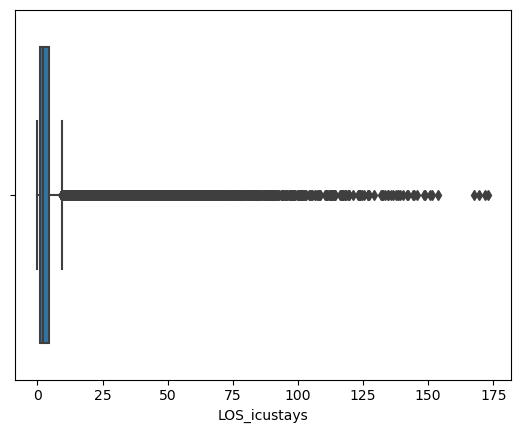

In [162]:
# dealing with outliers in ICU_LOS_mean column

# creating boxplot
sns.boxplot(x='LOS_icustays', data=icustays, orient='h')

# show the plot
plt.show()

In [163]:
icustays['LOS_icustays'] = remove_outliers(icustays['LOS_icustays'])

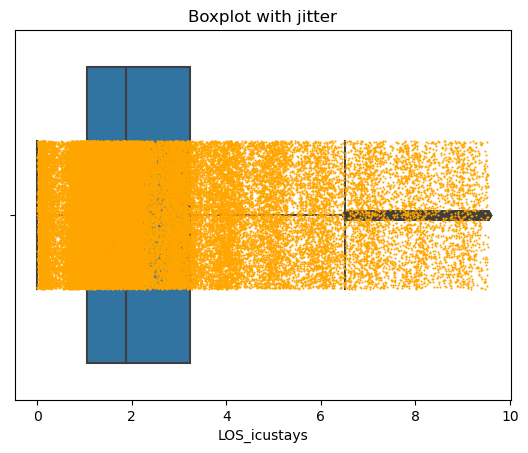

In [164]:
# boxplot
ax = sns.boxplot(x='LOS_icustays', data=icustays, orient='h')
# add stripplot
ax = sns.stripplot(x='LOS_icustays', data=icustays, color="orange", jitter=0.2, size=1.5, orient='h')

# add title
plt.title("Boxplot with jitter", loc="center")

# show the graph
plt.show()

In [165]:
icustays.shape

(61522, 3)

In [166]:
na_percentage(icustays)

(    Column Name  NA Count   NA %
 0    SUBJECT_ID         0   0.00
 1       HADM_ID         0   0.00
 2  LOS_icustays      7155  11.63,
 [])

In [167]:
icustays.dropna(inplace=True)

Text(0, 0.5, 'Density')

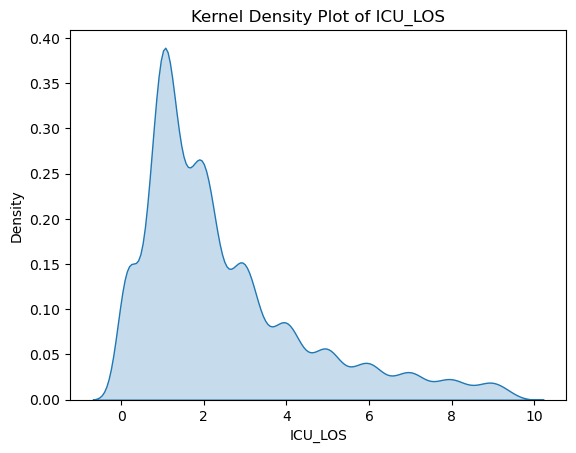

In [168]:
# Create kernel density plot "ICU_LOS_max"
sns.kdeplot(data=icustays['LOS_icustays'], fill=True)

# Set plot title and axis labels
plt.title('Kernel Density Plot of ICU_LOS')
plt.xlabel('ICU_LOS')
plt.ylabel('Density')

In [169]:
icustays.head()

,SUBJECT_ID,HADM_ID,LOS_icustays
0,268,110404,3.2490
1,269,106296,3.2788
2,270,188028,2.8939
3,271,173727,2.0600
4,272,164716,1.6202


In [170]:
na_percentage(icustays)

(    Column Name  NA Count  NA %
 0    SUBJECT_ID         0   0.0
 1       HADM_ID         0   0.0
 2  LOS_icustays         0   0.0,
 [])

In [171]:
%time icustays.to_parquet("icustays.parquet", compression=None)

CPU times: user 8.58 ms, sys: 9 µs, total: 8.59 ms
Wall time: 7.85 ms


**********************************************************************************************************************

## 2.15 inputevents_cv

### 2.15.1 Data description

The INPUTEVENTS table in the MIMIC-III dataset contains information on medications and other inputs administered to patients during their ICU stay.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

ICUSTAY_ID: Unique identifier for each ICU stay.

ITEMID: Numeric identifier for the medication or other input administered to the patient.

CHARTTIME: Date and time the medication or other input was administered to the patient.

AMOUNT: The amount of the medication or other input administered to the patient.

AMOUNTUOM: The unit of measure for the amount variable (e.g., milliliters, units).

RATE: The rate at which the medication or other input was administered to the patient (if applicable).

RATEUOM: The unit of measure for the rate variable (e.g., milliliters per hour).

STORETIME: Date and time the data point was entered into the electronic medical record.

CGID: Unique identifier for the caregiver who entered the data point into the electronic medical record.

ORDERID: Unique identifier for the order associated with the medication or other input.

LINKORDERID: Unique identifier for the parent order associated with the medication or other input.

STOPPED: Binary variable indicating whether the medication or other input was stopped (1 = stopped, 0 = not stopped).

NEWBOTTLE: Binary variable indicating whether a new medication or input bottle was started (1 = new bottle started, 0 = bottle not started).

ORIGINALAMOUNT: The original amount of the medication or other input ordered by the clinician.

ORIGINALAMOUNTUOM: The unit of measure for the original amount variable.

ORIGINALROUTE: The route of administration originally ordered by the clinician (e.g., oral, intravenous).

ORIGINALRATE: The original rate of administration ordered by the clinician (if applicable).

ORIGINALRATEUOM: The unit of measure for the original rate variable.

### 2.15.2 Importing data

In [32]:
data_key = 'INPUTEVENTS_CV.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

inputevents_cv = pd.read_csv(data_location)

/tmp/ipykernel_12346/69952737.py:5: DtypeWarning: Columns (7,9,17,20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  inputevents_cv = pd.read_csv(data_location)


### 2.15.3 Descriptive analysis

In [33]:
inputevents_cv.shape

(17527935, 22)

In [34]:
inputevents_cv.head().T

,0,1,2,3,4
ROW_ID,592,593,594,595,596
SUBJECT_ID,24457,24457,24457,24457,24457
HADM_ID,184834.0,184834.0,184834.0,184834.0,184834.0
ICUSTAY_ID,205776.0,205776.0,205776.0,205776.0,205776.0
CHARTTIME,2193-09-11 09:00:00,2193-09-11 12:00:00,2193-09-11 16:00:00,2193-09-11 19:00:00,2193-09-11 21:00:00
ITEMID,30056,30056,30056,30056,30056
AMOUNT,100.0,200.0,160.0,240.0,50.0
AMOUNTUOM,ml,ml,ml,ml,ml
RATE,NaN,NaN,NaN,NaN,NaN
RATEUOM,NaN,NaN,NaN,NaN,NaN


**********************************************************************************************************************

## 2.16 inputevents_mv

### 2.16.1 Data description

The INPUTEVENTS_MV table in the MIMIC-III dataset contains information on medications and other inputs administered to patients during their ICU stay, specifically for mechanically ventilated patients.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

ICUSTAY_ID: Unique identifier for each ICU stay.

STARTTIME: Date and time the medication or other input was started.

ENDTIME: Date and time the medication or other input was stopped.

ITEMID: Numeric identifier for the medication or other input administered to the patient.

AMOUNT: The amount of the medication or other input administered to the patient.

AMOUNTUOM: The unit of measure for the amount variable (e.g., milliliters, units).

RATE: The rate at which the medication or other input was administered to the patient (if applicable).

RATEUOM: The unit of measure for the rate variable (e.g., milliliters per hour).

STORETIME: Date and time the data point was entered into the electronic medical record.

CGID: Unique identifier for the caregiver who entered the data point into the electronic medical record.

ORDERID: Unique identifier for the order associated with the medication or other input.

LINKORDERID: Unique identifier for the parent order associated with the medication or other input.

STOPPED: Binary variable indicating whether the medication or other input was stopped (1 = stopped, 0 = not stopped).

NEWBOTTLE: Binary variable indicating whether a new medication or input bottle was started (1 = new bottle started, 0 = bottle not started).

ISERROR: Binary variable indicating whether there was an error in the administration of the medication or other input (1 = error, 0 = no error).

ERRORDESCRIPTION: Description of the error that occurred (if applicable).

RESULTSTATUS: Status of the medication or other input administration (e.g., complete, pending, refused).

STOPPEDBY: Unique identifier for the caregiver who stopped the medication or other input administration (if applicable).

COMMENTS_EDITEDBY: Unique identifier for the caregiver who edited the medication or other input administration comments (if applicable).

COMMENTS_CANCELEDBY: Unique identifier for the caregiver who canceled the medication or other input administration comments (if applicable).

COMMENTS_DATE: Date and time the medication or other input administration comments were entered.

COMMENTS: Comments associated with the medication or other input administration.

### 2.16.2 Importing data

In [35]:
data_key = 'INPUTEVENTS_MV.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time inputevents_mv = pd.read_csv(data_location)

CPU times: user 17 s, sys: 1.49 s, total: 18.5 s
Wall time: 28.1 s


### 2.16.3 Descriptive analysis

In [36]:
inputevents_mv.shape

(3618991, 31)

In [39]:
inputevents_mv.head().T

,0,1,2,3,4
ROW_ID,241,242,243,244,245
SUBJECT_ID,27063,27063,27063,27063,27063
HADM_ID,139787,139787,139787,139787,139787
ICUSTAY_ID,223259.0,223259.0,223259.0,223259.0,223259.0
STARTTIME,2133-02-05 06:29:00,2133-02-05 05:34:00,2133-02-05 05:34:00,2133-02-03 12:00:00,2133-02-03 12:00:00
ENDTIME,2133-02-05 08:45:00,2133-02-05 06:30:00,2133-02-05 06:30:00,2133-02-03 12:01:00,2133-02-03 12:01:00
ITEMID,225166,225944,225166,225893,220949
AMOUNT,6.774532,28.132997,2.8133,1.0,100.0
AMOUNTUOM,mEq,ml,mEq,dose,ml
RATE,NaN,30.142497,NaN,NaN,NaN


**********************************************************************************************************************

## 2.17 labevents

### 2.17.1 Data description

The LABEVENTS table in the MIMIC-III database contains information on laboratory test results for each patient during their ICU stay.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

ITEMID: Numeric identifier for the laboratory test performed.

CHARTTIME: Date and time the laboratory test was performed.

VALUE: Result of the laboratory test.

VALUENUM: Numeric value of the laboratory test result (if applicable).

VALUEUOM: Unit of measure for the laboratory test result.

FLAG: A flag indicating whether the result is abnormal or not.


### 2.17.2 Importing data

In [134]:
data_key = 'LABEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time labevents = pd.read_csv(data_location)

CPU times: user 26.2 s, sys: 3.79 s, total: 30 s
Wall time: 43.5 s


### 2.17.3 Descriptive analysis

In [94]:
labevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ITEMID,CHARTTIME,VALUE,VALUENUM,VALUEUOM,FLAG
0,281,3,NaN,50820,2101-10-12 16:07:00,7.39,7.39,units,NaN
1,282,3,NaN,50800,2101-10-12 18:17:00,ART,NaN,NaN,NaN
2,283,3,NaN,50802,2101-10-12 18:17:00,-1,-1.00,mEq/L,NaN
3,284,3,NaN,50804,2101-10-12 18:17:00,22,22.00,mEq/L,NaN
4,285,3,NaN,50808,2101-10-12 18:17:00,0.93,0.93,mmol/L,abnormal


In [95]:
labevents.shape

(27854055, 9)

In [96]:
na_percentage(labevents)

(  Column Name  NA Count   NA %
 0      ROW_ID         0   0.00
 1  SUBJECT_ID         0   0.00
 2     HADM_ID   5609021  20.14
 3      ITEMID         0   0.00
 4   CHARTTIME         0   0.00
 5       VALUE      1245   0.00
 6    VALUENUM   2921220  10.49
 7    VALUEUOM   3100249  11.13
 8        FLAG  18009889  64.66,
 ['FLAG'])

In [97]:
labevents.describe()

,ROW_ID,SUBJECT_ID,HADM_ID,ITEMID,VALUENUM
count,2.785406e+07,2.785406e+07,2.224503e+07,2.785406e+07,2.493284e+07
mean,1.395852e+07,3.146391e+04,1.499675e+05,5.106214e+04,7.853220e+01
std,8.057287e+06,2.714177e+04,2.886231e+04,2.092624e+02,5.512982e+03
min,1.000000e+00,2.000000e+00,1.000010e+05,5.080000e+04,-4.140000e+02
25%,6.980364e+06,1.120500e+04,1.251080e+05,5.088200e+04,4.400000e+00
50%,1.396099e+07,2.258500e+04,1.498490e+05,5.098300e+04,1.820000e+01
75%,2.093829e+07,4.790600e+04,1.750200e+05,5.125000e+04,6.000000e+01
max,2.790765e+07,9.999900e+04,1.999990e+05,5.155500e+04,1.427200e+07


<AxesSubplot: >

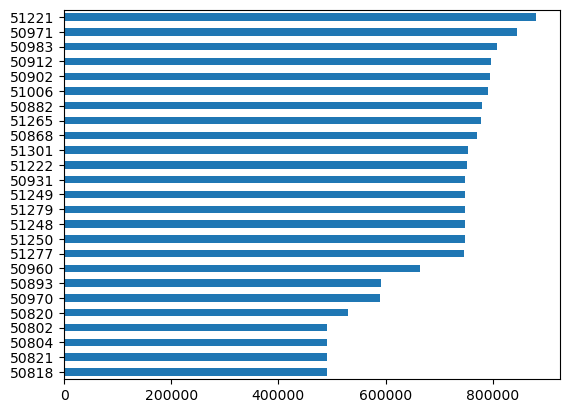

In [18]:
# Top 25 ITEMID

labevents.ITEMID.value_counts().head(25).sort_values().plot.barh()

<AxesSubplot: >

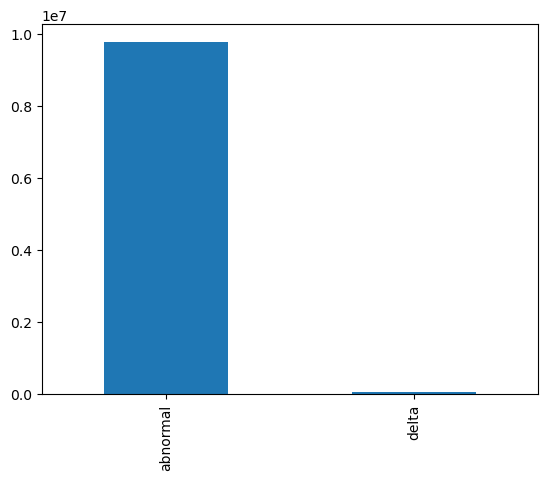

In [23]:
# Count of FLAG column

labevents.FLAG.value_counts().plot.bar()

<AxesSubplot: >

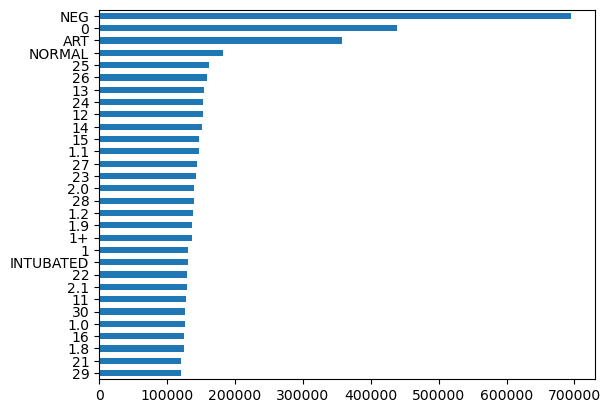

In [68]:
# Top 30 VALUE

labevents.VALUE.value_counts().head(30).sort_values().plot.barh()

### 2.17.3 Cleaning table

In [135]:
# dropping duplicates

labevents.drop_duplicates(inplace=True)

In [136]:
# check for NaN values

na_percentage(labevents)

(  Column Name  NA Count   NA %
 0      ROW_ID         0   0.00
 1  SUBJECT_ID         0   0.00
 2     HADM_ID   5609021  20.14
 3      ITEMID         0   0.00
 4   CHARTTIME         0   0.00
 5       VALUE      1245   0.00
 6    VALUENUM   2921220  10.49
 7    VALUEUOM   3100249  11.13
 8        FLAG  18009889  64.66,
 ['FLAG'])

In [137]:
labevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ITEMID,CHARTTIME,VALUE,VALUENUM,VALUEUOM,FLAG
0,281,3,NaN,50820,2101-10-12 16:07:00,7.39,7.39,units,NaN
1,282,3,NaN,50800,2101-10-12 18:17:00,ART,NaN,NaN,NaN
2,283,3,NaN,50802,2101-10-12 18:17:00,-1,-1.00,mEq/L,NaN
3,284,3,NaN,50804,2101-10-12 18:17:00,22,22.00,mEq/L,NaN
4,285,3,NaN,50808,2101-10-12 18:17:00,0.93,0.93,mmol/L,abnormal


In [138]:
d_labitems.head()

,ITEMID,LABEL,FLUID
0,51346,Blasts,Cerebrospinal Fluid (CSF)
1,51347,Eosinophils,Cerebrospinal Fluid (CSF)
2,51348,"Hematocrit, CSF",Cerebrospinal Fluid (CSF)
3,51349,Hypersegmented Neutrophils,Cerebrospinal Fluid (CSF)
4,51350,Immunophenotyping,Cerebrospinal Fluid (CSF)


In [139]:
# dropping unwanted columns

col_to_drop = ["ROW_ID", 'CHARTTIME', 'VALUENUM', "VALUEUOM", "FLAG"]

In [140]:
labevents.drop(columns=col_to_drop, inplace=True)

In [141]:
labevents.head()

,SUBJECT_ID,HADM_ID,ITEMID,VALUE
0,3,NaN,50820,7.39
1,3,NaN,50800,ART
2,3,NaN,50802,-1
3,3,NaN,50804,22
4,3,NaN,50808,0.93


In [142]:
# Merging the Labevents and D_Labitems tables on the ITEMID column

labevents_merged = pd.merge(labevents, d_labitems, on='ITEMID')

In [143]:
labevents.shape, labevents_merged.shape

((27854055, 4), (27854055, 6))

In [144]:
labevents_merged.head()

,SUBJECT_ID,HADM_ID,ITEMID,VALUE,LABEL,FLUID
0,3,NaN,50820,7.39,pH,Blood
1,3,NaN,50820,7.42,pH,Blood
2,3,NaN,50820,7.49,pH,Blood
3,3,145834.0,50820,7.40,pH,Blood
4,3,145834.0,50820,7.37,pH,Blood


In [145]:
labevents_merged['VALUE'] = labevents_merged['VALUE'].replace({'NEG': 0, 
                                                               'ART': 0,
                                                               'NORMAL': 0,
                                                               'INTUBATED': 0,
                                                               '1+': 1,
                                                               'HOLD': 0,
                                                               'NONE': 0,
                                                               'Clear': 1})


In [146]:
labevents_merged.head()

,SUBJECT_ID,HADM_ID,ITEMID,VALUE,LABEL,FLUID
0,3,NaN,50820,7.39,pH,Blood
1,3,NaN,50820,7.42,pH,Blood
2,3,NaN,50820,7.49,pH,Blood
3,3,145834.0,50820,7.40,pH,Blood
4,3,145834.0,50820,7.37,pH,Blood


In [147]:
# Replacing any non-numeric values in the VALUE column with NaN

labevents_merged['VALUE'] = pd.to_numeric(labevents_merged['VALUE'], errors='coerce')

In [148]:
na_percentage(labevents_merged)

(  Column Name  NA Count   NA %
 0  SUBJECT_ID         0   0.00
 1     HADM_ID   5609021  20.14
 2      ITEMID         0   0.00
 3       VALUE   1139823   4.09
 4       LABEL         0   0.00
 5       FLUID         0   0.00,
 [])

In [149]:
# Dropping rows with missing values in the VALUE column

labevents_merged.dropna(inplace=True)

In [150]:
na_percentage(labevents_merged)

(  Column Name  NA Count  NA %
 0  SUBJECT_ID         0   0.0
 1     HADM_ID         0   0.0
 2      ITEMID         0   0.0
 3       VALUE         0   0.0
 4       LABEL         0   0.0
 5       FLUID         0   0.0,
 [])

In [151]:
labevents_merged.head()

,SUBJECT_ID,HADM_ID,ITEMID,VALUE,LABEL,FLUID
3,3,145834.0,50820,7.40,pH,Blood
4,3,145834.0,50820,7.37,pH,Blood
5,3,145834.0,50820,7.37,pH,Blood
6,3,145834.0,50820,7.39,pH,Blood
7,3,145834.0,50820,7.39,pH,Blood


In [188]:
# Grouping the DataFrame by HADM_ID and ITEMID, and computing the minimum, maximum, and average of VALUENUM for each group

grouped = labevents_merged.groupby(['HADM_ID', 'ITEMID']).agg({'VALUE': ['min', 'max', 'mean'],'LABEL': 'first', 'FLUID': 'first'})

# Flatten the column names of the resulting DataFrame
grouped.columns = ['_'.join(col).rstrip('_') for col in grouped.columns.values]

# Reset the index of the DataFrame to make SUBJECT_ID and ITEMID columns into regular columns
grouped = grouped.reset_index()


In [189]:
grouped.head()

,HADM_ID,ITEMID,VALUE_min,VALUE_max,VALUE_mean,LABEL_first,FLUID_first
0,100001.0,50813,1.9,1.9,1.900000,Lactate,Blood
1,100001.0,50861,10.0,10.0,10.000000,Alanine Aminotransferase (ALT),Blood
2,100001.0,50863,105.0,105.0,105.000000,Alkaline Phosphatase,Blood
3,100001.0,50868,9.0,30.0,16.642857,Anion Gap,Blood
4,100001.0,50878,16.0,16.0,16.000000,Asparate Aminotransferase (AST),Blood


In [190]:
labevents_merged_stats = grouped.copy()

In [191]:
labevents_merged_stats.drop(columns=["ITEMID"], inplace=True)

In [192]:
labevents_merged_stats = labevents_merged_stats.rename(columns={'VALUE_min': 'Lab_VALUE_min',
                                                                'VALUE_max': "Lab_VALUE_max",
                                                                'VALUE_mean': "Lab_VALUE_mean",
                                                                'LABEL_first': "Lab_LABEL_first",
                                                                'FLUID_first': "Lab_FLUID_first"})

In [209]:
labevents_merged_stats.head(10)

,HADM_ID,Lab_VALUE_min,Lab_VALUE_max,Lab_VALUE_mean,Lab_LABEL_first,Lab_FLUID_first
0,100001.0,1.9,1.9,1.900000,Lactate,Blood
1,100001.0,10.0,10.0,10.000000,Alanine Aminotransferase (ALT),Blood
2,100001.0,105.0,105.0,105.000000,Alkaline Phosphatase,Blood
3,100001.0,9.0,30.0,16.642857,Anion Gap,Blood
4,100001.0,16.0,16.0,16.000000,Asparate Aminotransferase (AST),Blood
5,100001.0,11.0,26.0,19.714286,Bicarbonate,Blood
6,100001.0,0.5,0.5,0.500000,"Bilirubin, Total",Blood
7,100001.0,7.0,9.2,8.554545,"Calcium, Total",Blood
8,100001.0,101.0,114.0,107.214286,Chloride,Blood
9,100001.0,1.9,2.7,2.214286,Creatinine,Blood


In [194]:
labevents_merged_stats.shape

(3457937, 6)

<AxesSubplot: >

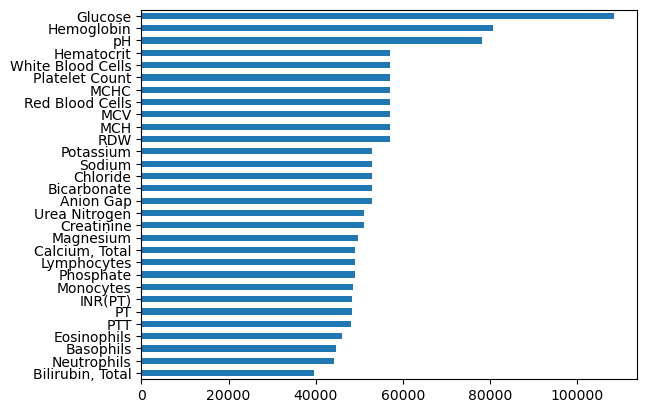

In [195]:
labevents_merged_stats.Lab_LABEL_first.value_counts().head(30).sort_values().plot.barh()

In [160]:
labevents_merged_stats.Lab_LABEL_first.nunique()

470

In [202]:
glucose_labevents_merged_stats = labevents_merged_stats[labevents_merged_stats['Lab_LABEL_first']=='Glucose']

In [203]:
glucose_labevents_merged_stats = glucose_labevents_merged_stats.pivot_table(index='HADM_ID', columns='Lab_LABEL_first', values=['Lab_VALUE_min', 'Lab_VALUE_max', 'Lab_VALUE_mean', 'Lab_FLUID_first'])


In [204]:
# flatten the multi-level column index
glucose_labevents_merged_stats.columns = [f'{col[1]}_{col[0]}' for col in glucose_labevents_merged_stats.columns]

In [205]:
glucose_labevents_merged_stats.head()

,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min
HADM_ID,,,
100001.0,652.5,407.714286,182.500000
100003.0,67.5,48.416667,28.000000
100006.0,84.0,52.500000,34.000000
100007.0,83.0,59.166667,38.500000
100009.0,477.0,443.877778,416.333333


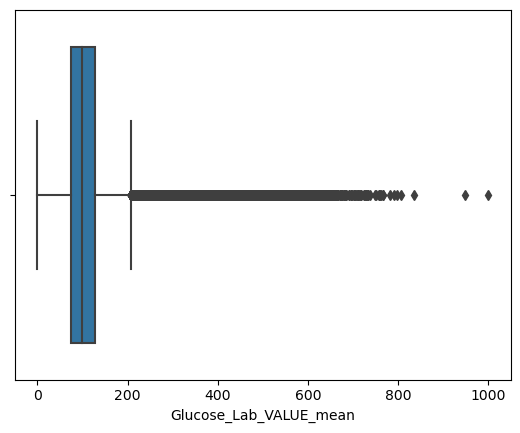

In [207]:
# dealing with outliers in DURATION_DAYS column

# creating boxplot
sns.boxplot(x='Glucose_Lab_VALUE_mean', data=glucose_labevents_merged_stats, orient='h')

# show the plot
plt.show()

In [210]:
glucose_labevents_merged_stats['Glucose_Lab_VALUE_mean'] = remove_outliers(glucose_labevents_merged_stats['Glucose_Lab_VALUE_mean'])

In [212]:
glucose_labevents_merged_stats['Glucose_Lab_VALUE_min'] = remove_outliers(glucose_labevents_merged_stats['Glucose_Lab_VALUE_min'])


In [214]:
glucose_labevents_merged_stats['Glucose_Lab_VALUE_max'] = remove_outliers(glucose_labevents_merged_stats['Glucose_Lab_VALUE_max'])

In [215]:
na_percentage(glucose_labevents_merged_stats)

(              Column Name  NA Count  NA %
 0   Glucose_Lab_VALUE_max      4037  7.95
 1  Glucose_Lab_VALUE_mean      3263  6.42
 2   Glucose_Lab_VALUE_min      2531  4.98,
 [])

In [217]:
glucose_labevents_merged_stats.dropna(inplace=True)

In [218]:
glucose_labevents_merged_stats.head()

,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min
HADM_ID,,,
100003.0,67.500000,48.416667,28.000000
100006.0,84.000000,52.500000,34.000000
100007.0,83.000000,59.166667,38.500000
100010.0,128.500000,111.625000,89.000000
100011.0,204.666667,117.069444,72.666667


In [219]:
na_percentage(glucose_labevents_merged_stats)

(              Column Name  NA Count  NA %
 0   Glucose_Lab_VALUE_max         0   0.0
 1  Glucose_Lab_VALUE_mean         0   0.0
 2   Glucose_Lab_VALUE_min         0   0.0,
 [])

In [227]:
hemoglobin_labevents_merged_stats = labevents_merged_stats[labevents_merged_stats['Lab_LABEL_first']=='Hemoglobin']
hemoglobin_labevents_merged_stats = hemoglobin_labevents_merged_stats.pivot_table(index='HADM_ID', columns='Lab_LABEL_first', values=['Lab_VALUE_min', 'Lab_VALUE_max', 'Lab_VALUE_mean', 'Lab_FLUID_first'])
# flatten the multi-level column index
hemoglobin_labevents_merged_stats.columns = [f'{col[1]}_{col[0]}' for col in hemoglobin_labevents_merged_stats.columns]
hemoglobin_labevents_merged_stats.head()

,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
HADM_ID,,,
100001.0,13.00,11.114286,10.00
100003.0,9.10,8.507143,7.45
100006.0,12.40,10.600000,9.50
100007.0,12.30,10.187500,8.60
100009.0,14.55,12.578571,11.35


In [228]:
hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_min'] = remove_outliers(hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_min'])
hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_mean'] = remove_outliers(hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_mean'])
hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_max'] = remove_outliers(hemoglobin_labevents_merged_stats['Hemoglobin_Lab_VALUE_max'])


In [229]:
na_percentage(hemoglobin_labevents_merged_stats)

(                 Column Name  NA Count  NA %
 0   Hemoglobin_Lab_VALUE_max      1611  2.83
 1  Hemoglobin_Lab_VALUE_mean      3279  5.75
 2   Hemoglobin_Lab_VALUE_min      3198  5.61,
 [])

In [231]:
hemoglobin_labevents_merged_stats.dropna(inplace=True)

In [233]:
hemoglobin_labevents_merged_stats.head()

,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
HADM_ID,,,
100001.0,13.00,11.114286,10.00
100003.0,9.10,8.507143,7.45
100006.0,12.40,10.600000,9.50
100007.0,12.30,10.187500,8.60
100009.0,14.55,12.578571,11.35


In [234]:
glucose_labevents_merged_stats.head()

,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min
HADM_ID,,,
100003.0,67.500000,48.416667,28.000000
100006.0,84.000000,52.500000,34.000000
100007.0,83.000000,59.166667,38.500000
100010.0,128.500000,111.625000,89.000000
100011.0,204.666667,117.069444,72.666667


In [ ]:
labevents_clean = glucose_labevents_merged_stats.merge(hemoglobin_labevents_merged_stats, on='SUBJECT_ID', how='left')

In [235]:
labevents_clean = glucose_labevents_merged_stats.join(hemoglobin_labevents_merged_stats)

In [237]:
labevents_clean.head()

,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
HADM_ID,,,,,,
100003.0,67.500000,48.416667,28.000000,9.10,8.507143,7.45
100006.0,84.000000,52.500000,34.000000,12.40,10.600000,9.50
100007.0,83.000000,59.166667,38.500000,12.30,10.187500,8.60
100010.0,128.500000,111.625000,89.000000,9.35,8.900000,8.10
100011.0,204.666667,117.069444,72.666667,14.20,11.679412,10.50


In [238]:
na_percentage(labevents_clean)

(                 Column Name  NA Count  NA %
 0      Glucose_Lab_VALUE_max         0  0.00
 1     Glucose_Lab_VALUE_mean         0  0.00
 2      Glucose_Lab_VALUE_min         0  0.00
 3   Hemoglobin_Lab_VALUE_max       373  0.81
 4  Hemoglobin_Lab_VALUE_mean       373  0.81
 5   Hemoglobin_Lab_VALUE_min       373  0.81,
 [])

In [239]:
labevents_clean.dropna(inplace=True)

In [240]:
labevents_clean.shape

(45417, 6)

In [241]:
labevents_clean.to_parquet('labevents_clean.parquet', compression=None)

**********************************************************************************************************************

## 2.18 microbiologyevents

### 2.18.1 Data description

The MICROBIOLOGYEVENTS table in the MIMIC-III database contains information on microbiology test results for each patient during their ICU stay.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

CHARTDATE: Date the microbiology test was performed.

CHARTTIME: Time the microbiology test was performed.

SPEC_ITEMID: Numeric identifier for the specific item tested (e.g., blood culture, urine culture).

SPEC_TYPE_DESC: Description of the type of specimen tested (e.g., blood, urine).

ORG_ITEMID: Numeric identifier for the specific organism identified (if applicable).

ORG_NAME: Name of the organism identified (if applicable).

ISOLATE_NUM: Numeric identifier for the specific isolate identified (if applicable).

AB_ITEMID: Numeric identifier for the specific antibiotic tested (if applicable).

AB_NAME: Name of the antibiotic tested (if applicable).

DILUTION_TEXT: Text description of the dilution factor used (if applicable).

DILUTION_COMPARISON: Comparison value used to interpret the dilution factor (if applicable).

DILUTION_VALUE: Numeric value of the dilution factor (if applicable).

INTERPRETATION: Interpretation of the microbiology test result (e.g., susceptible, resistant).

### 2.18.2 Importing data

In [21]:
data_key = 'MICROBIOLOGYEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time microbiologyevents = pd.read_csv(data_location)

CPU times: user 1.12 s, sys: 176 ms, total: 1.3 s
Wall time: 2 s


### 2.18.3 Descriptive analysis

In [95]:
microbiologyevents.shape

(631726, 16)

In [25]:
microbiologyevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,SPEC_ITEMID,SPEC_TYPE_DESC,ORG_ITEMID,ORG_NAME,ISOLATE_NUM,AB_ITEMID,AB_NAME,DILUTION_TEXT,DILUTION_COMPARISON,DILUTION_VALUE,INTERPRETATION
0,744,96,170324,2156-04-13 00:00:00,2156-04-13 14:18:00,70021.0,BRONCHOALVEOLAR LAVAGE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1,745,96,170324,2156-04-20 00:00:00,2156-04-20 13:10:00,70062.0,SPUTUM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,746,96,170324,2156-04-20 00:00:00,2156-04-20 16:00:00,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,747,96,170324,2156-04-20 00:00:00,NaN,70012.0,BLOOD CULTURE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,748,96,170324,2156-04-20 00:00:00,NaN,70079.0,URINE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
microbiologyevents.dtypes

ROW_ID                          int64
SUBJECT_ID                      int64
HADM_ID                         int64
CHARTDATE              datetime64[ns]
CHARTTIME                      object
SPEC_ITEMID                   float64
SPEC_TYPE_DESC                 object
ORG_ITEMID                    float64
ORG_NAME                       object
ISOLATE_NUM                   float64
AB_ITEMID                     float64
AB_NAME                        object
DILUTION_TEXT                  object
DILUTION_COMPARISON            object
DILUTION_VALUE                float64
INTERPRETATION                 object
dtype: object

In [122]:
microbiologyevents.ORG_NAME.value_counts().nunique()

139

<AxesSubplot: >

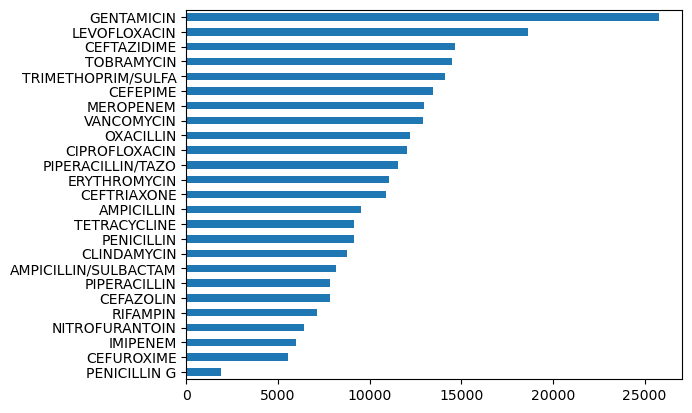

In [23]:
# Top 25 AB_NAME

microbiologyevents.AB_NAME.value_counts().head(25).sort_values().plot.barh()

<AxesSubplot: >

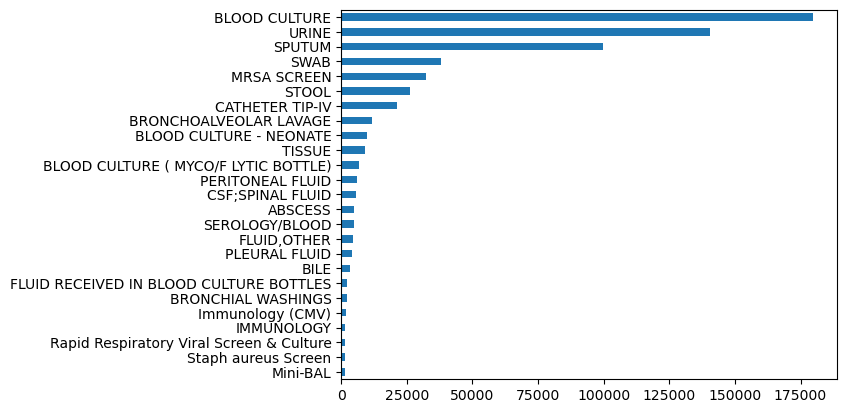

In [120]:
# Top 25 SPEC_TYPE_DESC

microbiologyevents.SPEC_TYPE_DESC.value_counts().head(25).sort_values().plot.barh()

<AxesSubplot: >

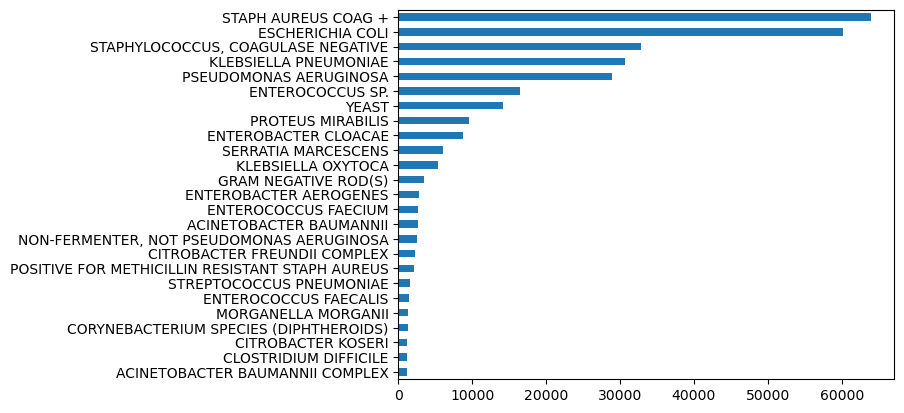

In [22]:
# Top 25 ORG_NAME

microbiologyevents.ORG_NAME.value_counts().head(25).sort_values().plot.barh()

### 2.18.4 Cleaning table

In [34]:
na_percentage(microbiologyevents)

(            Column Name  NA Count   NA %
 0                ROW_ID         0   0.00
 1            SUBJECT_ID         0   0.00
 2               HADM_ID         0   0.00
 3             CHARTDATE         0   0.00
 4             CHARTTIME     41772   6.61
 5           SPEC_ITEMID        79   0.01
 6        SPEC_TYPE_DESC         0   0.00
 7            ORG_ITEMID    304845  48.26
 8              ORG_NAME         0   0.00
 9           ISOLATE_NUM    303710  48.08
 10            AB_ITEMID    355892  56.34
 11              AB_NAME         0   0.00
 12        DILUTION_TEXT    364376  57.68
 13  DILUTION_COMPARISON    364548  57.71
 14       DILUTION_VALUE    364548  57.71
 15       INTERPRETATION         0   0.00,
 ['AB_ITEMID', 'DILUTION_TEXT', 'DILUTION_COMPARISON', 'DILUTION_VALUE'])

In [25]:
# Converting the CHARTDATE column to datetime object

microbiologyevents['CHARTDATE'] = pd.to_datetime(microbiologyevents['CHARTDATE'],
                                           format='%Y-%m-%d')

In [33]:
microbiologyevents['ORG_NAME'] = microbiologyevents['ORG_NAME'].fillna('NOT SPECIFIED')
microbiologyevents['AB_NAME'] = microbiologyevents['AB_NAME'].fillna('NOT SPECIFIED')
microbiologyevents['INTERPRETATION'] = microbiologyevents['INTERPRETATION'].fillna('NOT SPECIFIED')


In [41]:
na_percentage(microbiologyevents)

(      Column Name  NA Count  NA %
 0      SUBJECT_ID         0   0.0
 1         HADM_ID         0   0.0
 2       CHARTDATE         0   0.0
 3     SPEC_ITEMID         0   0.0
 4  SPEC_TYPE_DESC         0   0.0
 5        ORG_NAME         0   0.0
 6         AB_NAME         0   0.0
 7  INTERPRETATION         0   0.0,
 [])

In [35]:
# removing unwanted columns

col_to_drop = ['ROW_ID', "CHARTTIME", 'ORG_ITEMID',"ISOLATE_NUM",'AB_ITEMID', 'DILUTION_TEXT', "DILUTION_COMPARISON",
               'DILUTION_VALUE']

In [36]:
microbiologyevents.drop(columns=col_to_drop, inplace=True)

In [39]:
microbiologyevents.dropna(inplace=True)

In [42]:
microbiologyevents.head()

,SUBJECT_ID,HADM_ID,CHARTDATE,SPEC_ITEMID,SPEC_TYPE_DESC,ORG_NAME,AB_NAME,INTERPRETATION
0,96,170324,2156-04-13,70021.0,BRONCHOALVEOLAR LAVAGE,PSEUDOMONAS AERUGINOSA,NOT SPECIFIED,NOT SPECIFIED
1,96,170324,2156-04-20,70062.0,SPUTUM,NOT SPECIFIED,NOT SPECIFIED,NOT SPECIFIED
2,96,170324,2156-04-20,70012.0,BLOOD CULTURE,NOT SPECIFIED,NOT SPECIFIED,NOT SPECIFIED
3,96,170324,2156-04-20,70012.0,BLOOD CULTURE,NOT SPECIFIED,NOT SPECIFIED,NOT SPECIFIED
4,96,170324,2156-04-20,70079.0,URINE,NOT SPECIFIED,NOT SPECIFIED,NOT SPECIFIED


**********************************************************************************************************************

## 2.19 noteevents

### 2.19.1 Data description

The NOTEEVENTS table in the MIMIC-III database contains free-text clinical notes recorded by healthcare providers during a patient's ICU stay.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

CHARTDATE: Date the clinical note was recorded.

CHARTTIME: Time the clinical note was recorded.

STORETIME: Time the clinical note was stored in the database.

CATEGORY: Type of clinical note (e.g., radiology, nursing).

DESCRIPTION: Description of the clinical note.

CGID: Unique identifier for the healthcare provider who recorded the note.

ISERROR: Binary variable indicating whether the clinical note contained an error (1 = contains error, 0 = does not contain error).

TEXT: Free-text of the clinical note.

### 2.19.2 Importing data

In [26]:
data_key = 'NOTEEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time noteevents = pd.read_csv(data_location)

<timed exec>:1: DtypeWarning: Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.


CPU times: user 1min 2s, sys: 5.63 s, total: 1min 8s
Wall time: 2min 19s


### 2.19.3 Descriptive analysis

In [27]:
noteevents.shape

(2083180, 11)

In [28]:
noteevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,STORETIME,CATEGORY,DESCRIPTION,CGID,ISERROR,TEXT
0,174,22532,167853.0,2151-08-04,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2151-7-16**] Dischar...
1,175,13702,107527.0,2118-06-14,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2118-6-2**] Discharg...
2,176,13702,167118.0,2119-05-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2119-5-4**] D...
3,177,13702,196489.0,2124-08-18,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2124-7-21**] ...
4,178,26880,135453.0,2162-03-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2162-3-3**] D...


In [29]:
noteevents.TEXT[0]

'Admission Date:  [**2151-7-16**]       Discharge Date:  [**2151-8-4**]\n\n\nService:\nADDENDUM:\n\nRADIOLOGIC STUDIES:  Radiologic studies also included a chest\nCT, which confirmed cavitary lesions in the left lung apex\nconsistent with infectious process/tuberculosis.  This also\nmoderate-sized left pleural effusion.\n\nHEAD CT:  Head CT showed no intracranial hemorrhage or mass\neffect, but old infarction consistent with past medical\nhistory.\n\nABDOMINAL CT:  Abdominal CT showed lesions of\nT10 and sacrum most likely secondary to osteoporosis. These can\nbe followed by repeat imaging as an outpatient.\n\n\n\n                            [**First Name8 (NamePattern2) **] [**First Name4 (NamePattern1) 1775**] [**Last Name (NamePattern1) **], M.D.  [**MD Number(1) 1776**]\n\nDictated By:[**Hospital 1807**]\nMEDQUIST36\n\nD:  [**2151-8-5**]  12:11\nT:  [**2151-8-5**]  12:21\nJOB#:  [**Job Number 1808**]\n'

**********************************************************************************************************************

## 2.20 outputevents

### 2.20.1 Data description

The OUTPUTEVENTS table in the MIMIC-III database contains information on the output measurements for each patient during their ICU stay.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

ICUSTAY_ID: Unique identifier for each ICU stay.

CHARTTIME: Time the output measurement was recorded.

ITEMID: Numeric identifier for the type of output measurement (e.g., urine output, gastrointestinal output).

VALUE: Numeric value of the output measurement.

VALUEUOM: Unit of measurement for the output value (e.g., mL, L).

STORETIME: Time the output measurement was stored in the database.

CGID: Unique identifier for the healthcare provider who recorded the output measurement.

### 2.20.2 Importing data

In [30]:
data_key = 'OUTPUTEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time outputevents = pd.read_csv(data_location)

CPU times: user 8.32 s, sys: 1.12 s, total: 9.45 s
Wall time: 13.1 s


### 2.20.3 Descriptive analysis

In [31]:
outputevents.shape

(4349218, 13)

In [32]:
outputevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,CHARTTIME,ITEMID,VALUE,VALUEUOM,STORETIME,CGID,STOPPED,NEWBOTTLE,ISERROR
0,344,21219,177991.0,225765.0,2142-09-08 10:00:00,40055,200.0,ml,2142-09-08 12:08:00,17269,NaN,NaN,NaN
1,345,21219,177991.0,225765.0,2142-09-08 12:00:00,40055,200.0,ml,2142-09-08 12:08:00,17269,NaN,NaN,NaN
2,346,21219,177991.0,225765.0,2142-09-08 13:00:00,40055,120.0,ml,2142-09-08 13:39:00,17269,NaN,NaN,NaN
3,347,21219,177991.0,225765.0,2142-09-08 14:00:00,40055,100.0,ml,2142-09-08 16:17:00,17269,NaN,NaN,NaN
4,348,21219,177991.0,225765.0,2142-09-08 16:00:00,40055,200.0,ml,2142-09-08 16:17:00,17269,NaN,NaN,NaN


**********************************************************************************************************************

## 2.21 patients

### 2.21.1 Data description
    
SUBJECT_ID: a unique identifier for each patient in the dataset.
    
GENDER: the gender of the patient, as recorded in the electronic health record (EHR).
    
DOB: the date of birth of the patient, as recorded in the EHR.

DOD: the date of death of the patient, if known. Note that not all patients in the dataset have died, and some patients may have had their death date redacted for privacy reasons.

DOD_HOSP: the date of death of the patient during the current hospitalization, if known.

DOD_SSN: the date of death of the patient, as recorded in the Social Security Death Index (SSDI), if known.

EXPIRE_FLAG: a binary flag indicating whether the patient has died during the hospitalization or follow-up period (1 if yes, 0 if no).


### 2.21.2 Importing data

In [142]:
data_key = 'PATIENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time patients = pd.read_csv(data_location)

CPU times: user 144 ms, sys: 3.88 ms, total: 147 ms
Wall time: 301 ms


### 2.21.3 Descriptive analysis

In [105]:
patients.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13 00:00:00,NaN,NaN,NaN,0
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1
2,236,251,M,2090-03-15 00:00:00,NaN,NaN,NaN,0
3,237,252,M,2078-03-06 00:00:00,NaN,NaN,NaN,0
4,238,253,F,2089-11-26 00:00:00,NaN,NaN,NaN,0


In [38]:
patients.shape

(46520, 8)

In [108]:
# Number of patients based on Gender

patients_gender_df = create_value_counts_dataframe(patients, 'GENDER')
patients_gender_df

,Category,Count,Percentage
0,M,26121,56.150043
1,F,20399,43.849957


In [40]:
# Number of patients expired based on Gender

patients[patients["EXPIRE_FLAG"]==1].GENDER.value_counts()

M    8524
F    7235
Name: GENDER, dtype: int64

<AxesSubplot: xlabel='GENDER', ylabel='count'>

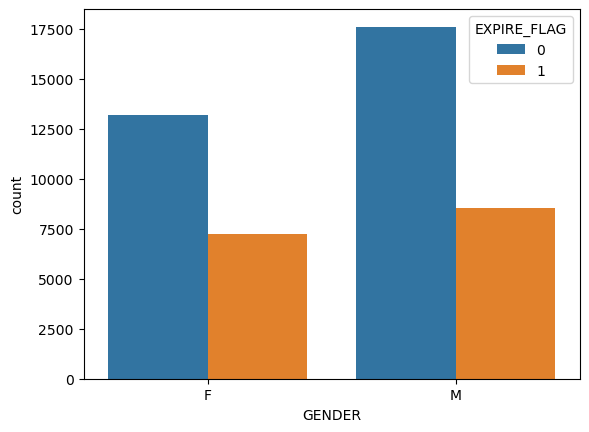

In [41]:
# Number of patients based on Gender

sns.countplot(data=patients, x="GENDER", hue="EXPIRE_FLAG")


### 2.21.4 Cleaning table

In [143]:
patients.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13 00:00:00,NaN,NaN,NaN,0
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1
2,236,251,M,2090-03-15 00:00:00,NaN,NaN,NaN,0
3,237,252,M,2078-03-06 00:00:00,NaN,NaN,NaN,0
4,238,253,F,2089-11-26 00:00:00,NaN,NaN,NaN,0


In [144]:
# check for na 

na_percentage(patients)

(   Column Name  NA Count   NA %
 0       ROW_ID         0   0.00
 1   SUBJECT_ID         0   0.00
 2       GENDER         0   0.00
 3          DOB         0   0.00
 4          DOD     30761  66.12
 5     DOD_HOSP     36546  78.56
 6      DOD_SSN     33142  71.24
 7  EXPIRE_FLAG         0   0.00,
 ['DOD', 'DOD_HOSP', 'DOD_SSN'])

In [145]:
# dropping columns with more than 50% NA values

In [146]:
col_to_drop = ['DOD','DOD_HOSP', 'DOD_SSN']

In [147]:
patients = patients.drop(columns=col_to_drop, axis=1)

In [148]:
patients.dtypes

ROW_ID          int64
SUBJECT_ID      int64
GENDER         object
DOB            object
EXPIRE_FLAG     int64
dtype: object

In [149]:
# convert the 'DOB' column to datetime format

patients['DOB'] = pd.to_datetime(patients['DOB'])

In [150]:
patients.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,EXPIRE_FLAG
0,234,249,F,2075-03-13,0
1,235,250,F,2164-12-27,1
2,236,251,M,2090-03-15,0
3,237,252,M,2078-03-06,0
4,238,253,F,2089-11-26,0


In [151]:
patients.shape

(46520, 5)

**********************************************************************************************************************

## 2.22 prescriptions

### 2.22.1 Data description

The PRESCRIPTIONS table in the MIMIC-III database contains information about medications that were prescribed to patients during their hospital stay.

ROW_ID: A unique identifier for each row in the table.

SUBJECT_ID: A unique identifier for each patient in the database.

HADM_ID: A unique identifier for each hospital admission.

ICUSTAY_ID: A unique identifier for each ICU stay.

STARTDATE: The date and time when the medication was prescribed.

ENDDATE: The date and time when the medication was discontinued, if applicable.

DRUG_TYPE: The type of drug that was prescribed (e.g., antibiotic, analgesic, sedative).

DRUG: The name of the drug that was prescribed.

DRUG_NAME_GENERIC: The generic name of the drug that was prescribed.

FORMULARY_DRUG_CD: A code that represents the drug in the hospital's formulary (a list of approved medications).

GSN: A code that represents the drug in the National Drug Code (NDC) directory.

NDC: The National Drug Code (NDC) number for the drug.

PROD_STRENGTH: The strength (dosage) of the drug.

DOSE_VAL_RX: The prescribed dose of the drug.

DOSE_UNIT_RX: The units of the prescribed dose.

FORM_VAL_DISP: The dispensed amount of the drug.

FORM_UNIT_DISP: The units of the dispensed amount.

ROUTE: The route of administration for the drug (e.g., oral, intravenous).

GSN_FLAG: A flag that indicates whether the drug is listed in the National Drug Code (NDC) directory.

### 2.22.2 Importing data

In [196]:
data_key = 'PRESCRIPTIONS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time prescriptions = pd.read_csv(data_location)

<timed exec>:1: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.


CPU times: user 10.4 s, sys: 1.49 s, total: 11.9 s
Wall time: 18.1 s


### 2.22.3 Descriptive analysis

In [112]:
prescriptions.shape

(4156450, 19)

In [44]:
prescriptions.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,STARTDATE,ENDDATE,DRUG_TYPE,DRUG,DRUG_NAME_POE,DRUG_NAME_GENERIC,FORMULARY_DRUG_CD,GSN,NDC,PROD_STRENGTH,DOSE_VAL_RX,DOSE_UNIT_RX,FORM_VAL_DISP,FORM_UNIT_DISP,ROUTE
0,2214776,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Tacrolimus,Tacrolimus,Tacrolimus,TACR1,021796,469061711.0,1mg Capsule,2,mg,2,CAP,PO
1,2214775,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Warfarin,Warfarin,Warfarin,WARF5,006562,56017275.0,5mg Tablet,5,mg,1,TAB,PO
2,2215524,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Heparin Sodium,NaN,NaN,HEPAPREMIX,006522,338055002.0,"25,000 unit Premix Bag","25,000",UNIT,1,BAG,IV
3,2216265,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,BASE,D5W,NaN,NaN,HEPBASE,NaN,0.0,HEPARIN BASE,250,ml,250,ml,IV
4,2214773,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Furosemide,Furosemide,Furosemide,FURO20,008208,54829725.0,20mg Tablet,20,mg,1,TAB,PO


In [60]:
prescriptions.DRUG.value_counts().nunique()

819

<AxesSubplot: >

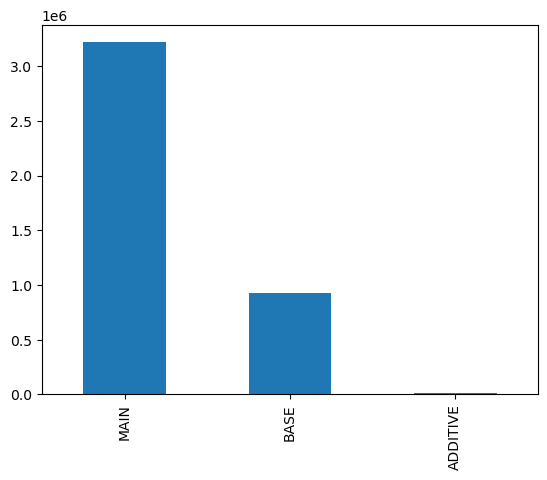

In [53]:
# Bar graph on DRUG_TYPE column 

prescriptions.DRUG_TYPE.value_counts().plot.bar()

<AxesSubplot: >

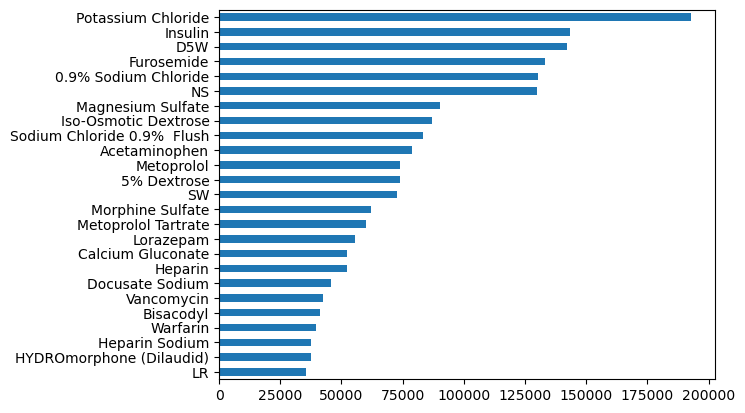

In [56]:
# Top 25 DRUG

prescriptions.DRUG.value_counts().head(25).sort_values().plot.barh()

<AxesSubplot: >

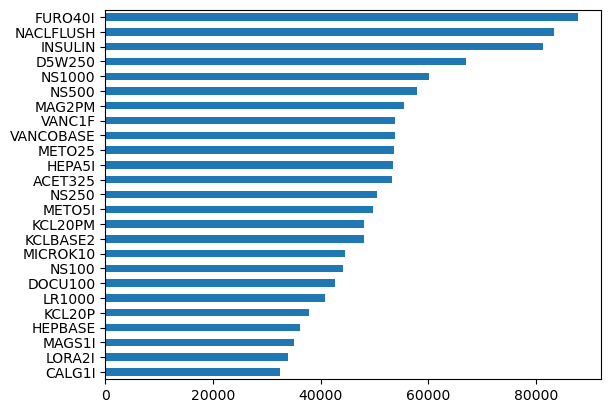

In [62]:
# Top 25 FORMULARY_DRUG_CD (Numeric code for medication)

prescriptions.FORMULARY_DRUG_CD.value_counts().head(25).sort_values().plot.barh()

In [137]:
# Unique count of the ROUTE of administration of the drug

prescriptions.ROUTE.value_counts().nunique()

64

<AxesSubplot: >

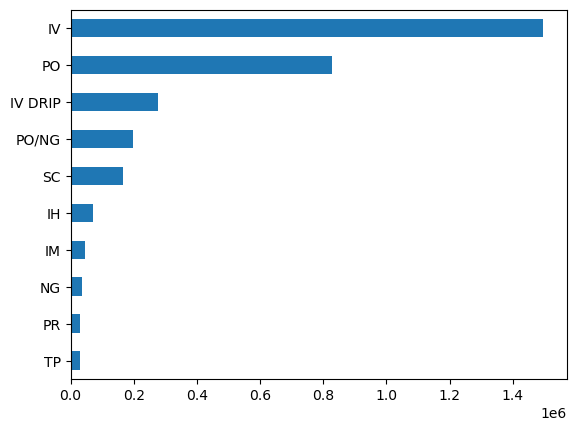

In [138]:
# Top 10 ROUTE

prescriptions.ROUTE.value_counts().head(10).sort_values().plot.barh()

<AxesSubplot: >

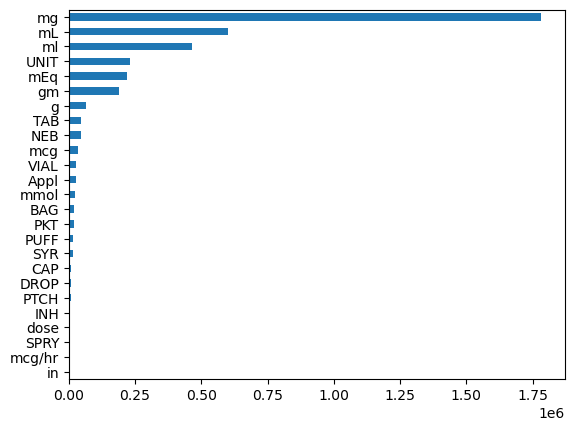

In [112]:
# Top 25 DOSE_UNIT_RX

prescriptions.DOSE_UNIT_RX.value_counts().head(25).sort_values().plot.barh()

<AxesSubplot: >

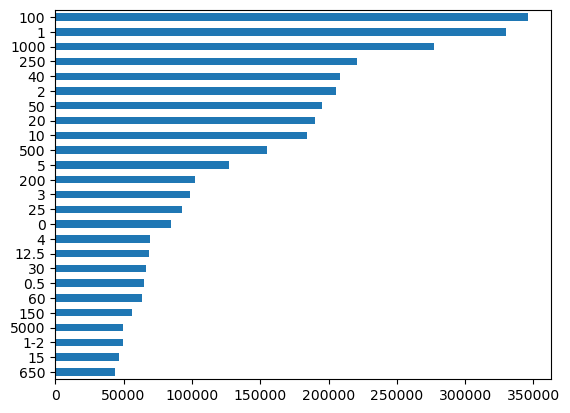

In [51]:
# Top 25 DOSE_UNIT_RX

prescriptions.DOSE_VAL_RX.value_counts().head(25).sort_values().plot.barh()

### 2.22.4 Cleaning table

In [197]:
# removing duplicates

prescriptions.drop_duplicates(inplace=True)

In [198]:
# check for NA values

na_percentage(prescriptions)

(          Column Name  NA Count   NA %
 0              ROW_ID         0   0.00
 1          SUBJECT_ID         0   0.00
 2             HADM_ID         0   0.00
 3          ICUSTAY_ID   1447708  34.83
 4           STARTDATE      3182   0.08
 5             ENDDATE      5421   0.13
 6           DRUG_TYPE         0   0.00
 7                DRUG         0   0.00
 8       DRUG_NAME_POE   1664234  40.04
 9   DRUG_NAME_GENERIC   1662989  40.01
 10  FORMULARY_DRUG_CD      1933   0.05
 11                GSN    507164  12.20
 12                NDC      4463   0.11
 13      PROD_STRENGTH      1362   0.03
 14        DOSE_VAL_RX      1350   0.03
 15       DOSE_UNIT_RX      1342   0.03
 16      FORM_VAL_DISP      1355   0.03
 17     FORM_UNIT_DISP      1409   0.03
 18              ROUTE      1156   0.03,
 [])

In [199]:
# dropping unwanted columns

col_to_drop = ["ROW_ID","ICUSTAY_ID","DRUG_TYPE", "DRUG_NAME_POE", 'DRUG_NAME_GENERIC', "FORMULARY_DRUG_CD",
               'GSN', "NDC","PROD_STRENGTH", 'DOSE_VAL_RX','DOSE_UNIT_RX', "FORM_VAL_DISP", "FORM_UNIT_DISP"]

In [200]:
prescriptions = prescriptions.drop(columns=col_to_drop, axis=1)

In [201]:
na_percentage(prescriptions)

(  Column Name  NA Count  NA %
 0  SUBJECT_ID         0  0.00
 1     HADM_ID         0  0.00
 2   STARTDATE      3182  0.08
 3     ENDDATE      5421  0.13
 4        DRUG         0  0.00
 5       ROUTE      1156  0.03,
 [])

In [202]:
# computing the duration of medication prescribed

# convert the 'STARTDATE' and 'ENDDATE' columns to datetime format

prescriptions['STARTDATE'] = pd.to_datetime(prescriptions['STARTDATE'])
prescriptions['ENDDATE'] = pd.to_datetime(prescriptions['ENDDATE'])

# compute the difference between 'ENDDATE' and 'STARTDATE' in days

prescriptions['DURATION_DAYS'] = (prescriptions['ENDDATE'] - prescriptions['STARTDATE']).dt.days

In [203]:
# dropping STARTDATE and ENDDATE columns

prescriptions = prescriptions.drop(columns=["STARTDATE", 'ENDDATE'], axis=1)

In [204]:
prescriptions.head()

,SUBJECT_ID,HADM_ID,DRUG,ROUTE,DURATION_DAYS
0,6,107064,Tacrolimus,PO,1.0
1,6,107064,Warfarin,PO,1.0
2,6,107064,Heparin Sodium,IV,1.0
3,6,107064,D5W,IV,1.0
4,6,107064,Furosemide,PO,1.0


In [205]:
prescriptions.dtypes

SUBJECT_ID         int64
HADM_ID            int64
DRUG              object
ROUTE             object
DURATION_DAYS    float64
dtype: object

In [206]:
na_percentage(prescriptions)

(     Column Name  NA Count  NA %
 0     SUBJECT_ID         0  0.00
 1        HADM_ID         0  0.00
 2           DRUG         0  0.00
 3          ROUTE      1156  0.03
 4  DURATION_DAYS      5618  0.14,
 [])

In [207]:
# dropping NA values

prescriptions.dropna(inplace=True)

In [208]:
# Unique count of the ROUTE of administration of the drug

prescriptions.DURATION_DAYS.value_counts().nunique()

122

<AxesSubplot: >

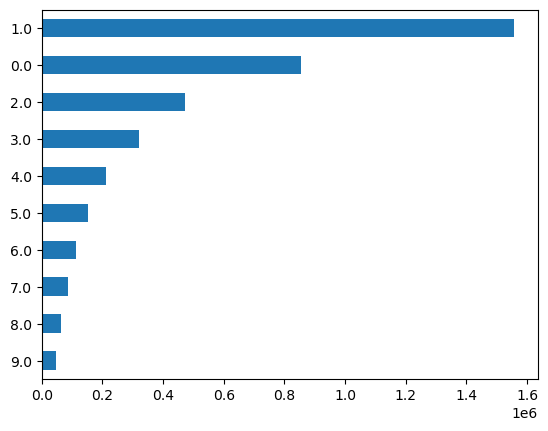

In [209]:
# Top 10 DURATION_DAYS 

prescriptions.DURATION_DAYS.value_counts().head(10).sort_values().plot.barh()

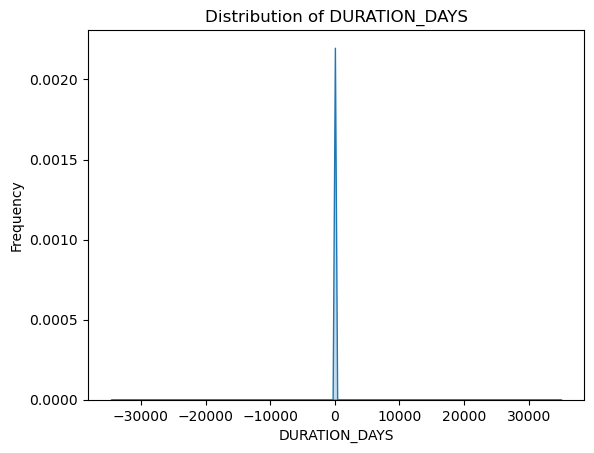

In [210]:
# Create kernel density plot of DURATION_DAYS column

sns.kdeplot(data=prescriptions['DURATION_DAYS'], fill=True)
plt.title('Distribution of DURATION_DAYS')
plt.xlabel('DURATION_DAYS')
plt.ylabel('Frequency')
plt.show()

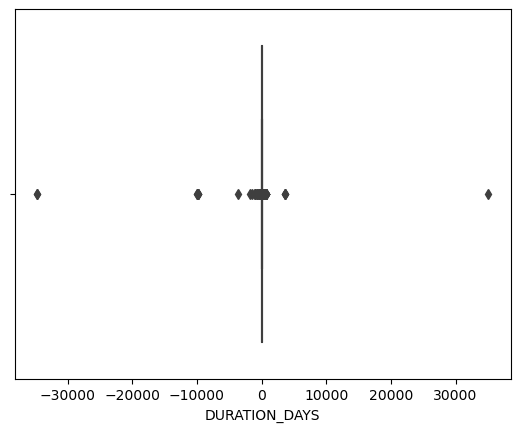

In [211]:
# dealing with outliers in DURATION_DAYS column

# creating boxplot
sns.boxplot(x='DURATION_DAYS', data=prescriptions, orient="h")

# show the plot
plt.show()

In [212]:
prescriptions["DURATION_DAYS"] = remove_outliers(prescriptions['DURATION_DAYS'])

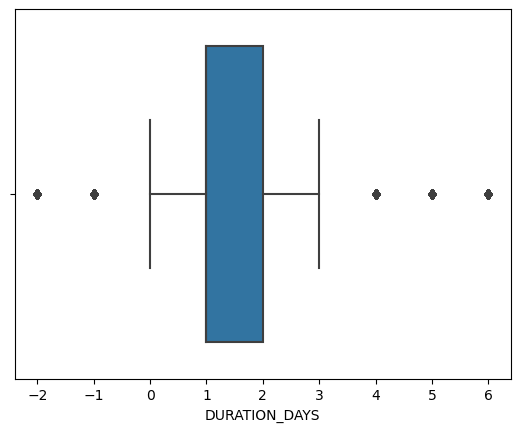

In [213]:
# dealing with outliers in DURATION_DAYS column

# creating boxplot
sns.boxplot(x='DURATION_DAYS', data=prescriptions, orient='h')

# show the plot
plt.show()

In [217]:
prescriptions = prescriptions.rename(columns={'DURATION_DAYS': 'PRESCRIPTION_DURATION_DAYS',
                                              'DRUG': "PRESCRIPTIONS_DRUG",
                                              'ROUTE': "PRESCRIPTIONS_ROUTE"})

In [218]:
prescriptions.head()

,SUBJECT_ID,HADM_ID,PRESCRIPTIONS_DRUG,PRESCRIPTIONS_ROUTE,PRESCRIPTION_DURATION_DAYS
0,6,107064,Tacrolimus,PO,1.0
1,6,107064,Warfarin,PO,1.0
2,6,107064,Heparin Sodium,IV,1.0
3,6,107064,D5W,IV,1.0
4,6,107064,Furosemide,PO,1.0


**********************************************************************************************************************

## 2.23 procedureevents_mv

### 2.23.1 Data description

The PROCEDUREEVENTS_MV table in the MIMIC-III database contains information on procedures performed on patients during their ICU stay. The table includes both invasive and non-invasive procedures, such as intubation, central line placement, and bronchoscopy.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

ICUSTAY_ID: Unique identifier for each ICU stay.

STARTTIME: Date and time the procedure was initiated.

ENDTIME: Date and time the procedure was completed.

ITEMID: Numeric identifier for the type of procedure performed.

VALUE: Numeric value associated with the procedure (e.g., length of procedure).

VALUEUOM: Unit of measurement for the procedure value (e.g., minutes).

LOCATION: Location of the procedure (e.g., operating room, ICU).

LOCATIONCATEGORY: Categorization of the location of the procedure (e.g., surgical, diagnostic).

STORETIME: Time the procedure information was stored in the database.

CGID: Unique identifier for the healthcare provider who recorded the procedure.

### 2.23.2 Importing data

In [45]:
data_key = 'PROCEDUREEVENTS_MV.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time procedureevents_mv = pd.read_csv(data_location)

CPU times: user 1.03 s, sys: 33.2 ms, total: 1.06 s
Wall time: 1.58 s


### 2.23.3 Descriptive analysis

In [46]:
procedureevents_mv.shape

(258066, 25)

In [48]:
procedureevents_mv.head().T

,0,1,2,3,4
ROW_ID,379,380,381,382,383
SUBJECT_ID,29070,29070,29070,29070,29070
HADM_ID,115071,115071,115071,115071,115071
ICUSTAY_ID,232563.0,232563.0,232563.0,232563.0,232563.0
STARTTIME,2145-03-12 23:04:00,2145-03-12 23:04:00,2145-03-12 23:05:00,2145-03-12 23:36:00,2145-03-13 01:27:00
ENDTIME,2145-03-12 23:05:00,2145-03-12 23:05:00,2145-03-18 20:01:00,2145-03-12 23:37:00,2145-03-16 16:00:00
ITEMID,225401,225454,225792,225402,224560
VALUE,1.0,1.0,8456.0,1.0,5193.0
VALUEUOM,None,None,hour,None,min
LOCATION,NaN,NaN,NaN,NaN,Right IJ


**********************************************************************************************************************

## 2.24 procedures_icd

### 2.24.1 Data description

The PROCEDURES_ICD table in the MIMIC-III database contains information on procedures performed on patients during their hospital stay. The table includes both invasive and non-invasive procedures, such as surgeries and diagnostic tests.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

SEQ_NUM: Numeric sequence number indicating the order of the procedures performed during the hospital stay.

ICD_CODE: International Classification of Diseases, Ninth Revision (ICD-9) code indicating the type of procedure perform
   

### 2.24.2 Importing data

In [237]:
data_key = 'PROCEDURES_ICD.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time procedures_icd = pd.read_csv(data_location)

CPU times: user 143 ms, sys: 7.77 ms, total: 151 ms
Wall time: 279 ms


### 2.24.3 Discriptive analysis

In [36]:
procedures_icd.shape

(240095, 5)

In [37]:
procedures_icd.head()

,ROW_ID,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
0,944,62641,154460,3,3404
1,945,2592,130856,1,9671
2,946,2592,130856,2,3893
3,947,55357,119355,1,9672
4,948,55357,119355,2,331


In [38]:
procedures_icd.describe()

,ROW_ID,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
count,240095.000000,240095.000000,240095.000000,240095.000000,240095.000000
mean,120048.000000,32851.481472,150082.948591,4.388434,5689.421350
std,69309.600778,27771.642798,28918.380367,3.772549,3307.832868
min,1.000000,2.000000,100003.000000,1.000000,10.000000
25%,60024.500000,11615.000000,125186.000000,2.000000,3614.000000
50%,120048.000000,23450.000000,149988.000000,3.000000,4319.000000
75%,180071.500000,51951.000000,175340.000000,6.000000,9390.000000
max,240095.000000,99999.000000,199999.000000,40.000000,9999.000000


In [43]:
# Total count of unique "ICD9_CODE"

procedures_icd.ICD9_CODE.value_counts().unique().sum()

211260

<AxesSubplot: >

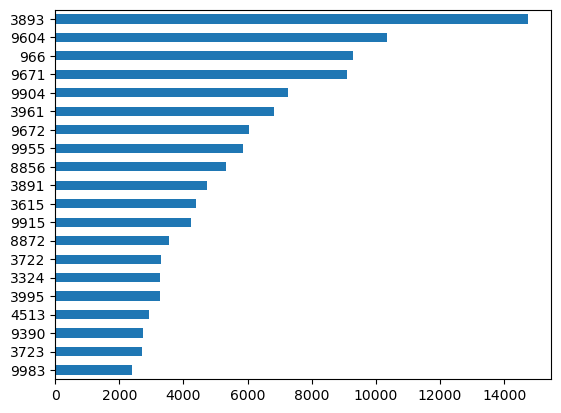

In [45]:
# Top 20 "ICD9_CODE" 

(procedures_icd.ICD9_CODE.value_counts().head(20).sort_values()).plot.barh()

### 2.24.4 Cleaning table

In [336]:
# check for NA values

na_percentage(procedures_icd)

(  Column Name  NA Count  NA %
 0      ROW_ID         0   0.0
 1  SUBJECT_ID         0   0.0
 2     HADM_ID         0   0.0
 3     SEQ_NUM         0   0.0
 4   ICD9_CODE         0   0.0,
 [])

In [238]:
# dropping unwanted columns 

col_to_drop = ['ROW_ID']

procedures_icd = procedures_icd.drop(columns=col_to_drop, axis=1)

In [338]:
# Total count of unique "ICD9_CODE"

procedures_icd.SEQ_NUM.value_counts()

1     52243
2     42119
3     33044
4     25796
5     20434
6     16008
7     12105
8      9214
9      6982
10     5096
11     3985
12     3114
13     2432
14     1866
15     1231
16      947
17      742
18      571
19      451
20      374
21      301
22      233
23      179
24      139
25      102
26       80
27       65
28       53
29       38
30       31
31       22
32       21
33       17
34       15
35       13
36       11
37        7
38        6
39        4
40        4
Name: SEQ_NUM, dtype: int64

<AxesSubplot: >

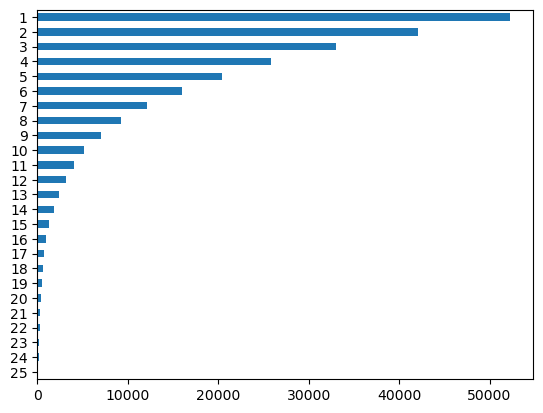

In [195]:
# Top 25 SEQ_NUM 

(procedures_icd.SEQ_NUM.value_counts().head(25).sort_values()).plot.barh()

In [239]:
procedures_icd.head()

,SUBJECT_ID,HADM_ID,SEQ_NUM,ICD9_CODE
0,62641,154460,3,3404
1,2592,130856,1,9671
2,2592,130856,2,3893
3,55357,119355,1,9672
4,55357,119355,2,331


**********************************************************************************************************************

## 2.25 services

### 2.25.1 Data description

The SERVICES table in the MIMIC-III database contains information on the different services that a patient receives during their hospital stay. A service in this context refers to a specific medical team responsible for the care of a patient, such as the cardiology service or the surgical service.

ROW_ID: Unique identifier for each row in the table.

SUBJECT_ID: Unique identifier for each patient in the dataset.

HADM_ID: Unique identifier for each hospital admission.

TRANSFERTIME: Date and time the patient was transferred to the service.

PREV_SERVICE: Service the patient was previously receiving.

CURR_SERVICE: Service the patient is currently receiving.

### 2.25.2 Importing data

In [53]:
data_key = 'SERVICES.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time services = pd.read_csv(data_location)

CPU times: user 129 ms, sys: 7.82 ms, total: 137 ms
Wall time: 282 ms


### 2.25.3 Descriptive analysis

In [54]:
services.shape

(73343, 6)

In [55]:
services.head()

,ROW_ID,SUBJECT_ID,HADM_ID,TRANSFERTIME,PREV_SERVICE,CURR_SERVICE
0,758,471,135879,2122-07-22 14:07:27,TSURG,MED
1,759,471,135879,2122-07-26 18:31:49,MED,TSURG
2,760,472,173064,2172-09-28 19:22:15,NaN,CMED
3,761,473,129194,2201-01-09 20:16:45,NaN,NB
4,762,474,194246,2181-03-23 08:24:41,NaN,NB


**********************************************************************************************************************

## 2.26 transfers

### 2.26.1 Data description

### 2.26.2 Importing data

In [56]:
data_key = 'TRANSFERS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time transfers = pd.read_csv(data_location)

CPU times: user 605 ms, sys: 34.9 ms, total: 640 ms
Wall time: 927 ms


### 2.26.3 Descriptive analysis 

In [57]:
transfers.shape

(261897, 13)

In [58]:
transfers.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,DBSOURCE,EVENTTYPE,PREV_CAREUNIT,CURR_CAREUNIT,PREV_WARDID,CURR_WARDID,INTIME,OUTTIME,LOS
0,657,111,192123,254245.0,carevue,transfer,CCU,MICU,7.0,23.0,2142-04-29 15:27:11,2142-05-04 20:38:33,125.19
1,658,111,192123,NaN,carevue,transfer,MICU,NaN,23.0,45.0,2142-05-04 20:38:33,2142-05-05 11:46:32,15.13
2,659,111,192123,NaN,carevue,discharge,NaN,NaN,45.0,NaN,2142-05-05 11:46:32,NaN,NaN
3,660,111,155897,249202.0,metavision,admit,NaN,MICU,NaN,52.0,2144-07-01 04:13:59,2144-07-01 05:19:39,1.09
4,661,111,155897,NaN,metavision,transfer,MICU,NaN,52.0,32.0,2144-07-01 05:19:39,2144-07-01 06:28:29,1.15


**********************************************************************************************************************

# 3. Dataset preparation

## 3.1 Merging  tables

In [175]:
patients.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,EXPIRE_FLAG
0,234,249,F,2075-03-13,0
1,235,250,F,2164-12-27,1
2,236,251,M,2090-03-15,0
3,237,252,M,2078-03-06,0
4,238,253,F,2089-11-26,0


In [176]:
admissions.head()

,SUBJECT_ID,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS
index,,,,,,,,,,,,,,
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43


In [177]:
# Merging patients and admissions tables

admissions_patients = admissions.merge(patients, on='SUBJECT_ID', how='left')

In [178]:
admissions_patients.shape, admissions.shape, patients.shape

((57380, 18), (57380, 14), (46520, 5))

In [179]:
admissions_patients.head()

,SUBJECT_ID,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0


In [180]:
na_percentage(admissions_patients)

(                     Column Name  NA Count  NA %
 0                     SUBJECT_ID         0   0.0
 1                        HADM_ID         0   0.0
 2                      ADMITTIME         0   0.0
 3                 ADMISSION_TYPE         0   0.0
 4             ADMISSION_LOCATION         0   0.0
 5             DISCHARGE_LOCATION         0   0.0
 6                      INSURANCE         0   0.0
 7                       RELIGION         0   0.0
 8                 MARITAL_STATUS         0   0.0
 9                      ETHNICITY         0   0.0
 10                     DIAGNOSIS         0   0.0
 11          HOSPITAL_EXPIRE_FLAG         0   0.0
 12      ADMISSIONS_DURATION_DAYS         0   0.0
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.0
 14                        ROW_ID         0   0.0
 15                        GENDER         0   0.0
 16                           DOB         0   0.0
 17                   EXPIRE_FLAG         0   0.0,
 [])

In [181]:
icustays.head()

,SUBJECT_ID,HADM_ID,LOS_icustays
index,,,
0,268,110404,3.2490
1,269,106296,3.2788
2,270,188028,2.8939
3,271,173727,2.0600
4,272,164716,1.6202


In [182]:
admissions_patients.shape, icustays.shape

((57380, 18), (54367, 3))

In [183]:
# Joining icustays table

adm_pat_icu = pd.merge(admissions_patients, icustays, on='HADM_ID', how='left')


In [184]:
adm_pat_icu.shape, admissions_patients.shape, icustays.shape

((60276, 20), (57380, 18), (54367, 3))

In [185]:
adm_pat_icu.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466


In [186]:
na_percentage(adm_pat_icu)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [187]:
adm_pat_icu['LOS_icustays'] = adm_pat_icu["LOS_icustays"].fillna(0)

In [188]:
adm_pat_icu.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466


In [189]:
na_percentage(adm_pat_icu)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [191]:
labevents_clean.head()

,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
HADM_ID,,,,,,
100003.0,67.500000,48.416667,28.000000,9.10,8.507143,7.45
100006.0,84.000000,52.500000,34.000000,12.40,10.600000,9.50
100007.0,83.000000,59.166667,38.500000,12.30,10.187500,8.60
100010.0,128.500000,111.625000,89.000000,9.35,8.900000,8.10
100011.0,204.666667,117.069444,72.666667,14.20,11.679412,10.50


In [194]:
labevents_clean.reset_index(inplace=True)

In [195]:
labevents_clean.head()

,HADM_ID,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
0,100003.0,67.500000,48.416667,28.000000,9.10,8.507143,7.45
1,100006.0,84.000000,52.500000,34.000000,12.40,10.600000,9.50
2,100007.0,83.000000,59.166667,38.500000,12.30,10.187500,8.60
3,100010.0,128.500000,111.625000,89.000000,9.35,8.900000,8.10
4,100011.0,204.666667,117.069444,72.666667,14.20,11.679412,10.50


In [196]:
labevents_clean.columns

Index(['HADM_ID', 'Glucose_Lab_VALUE_max', 'Glucose_Lab_VALUE_mean', 'Glucose_Lab_VALUE_min', 'Hemoglobin_Lab_VALUE_max', 'Hemoglobin_Lab_VALUE_mean', 'Hemoglobin_Lab_VALUE_min'], dtype='object')

In [199]:
labevents_clean.shape, adm_pat_icu.shape

((45417, 7), (60276, 20))

In [200]:
# Joining labevents table

adm_pat_icu_lab = pd.merge(adm_pat_icu, labevents_clean, on='HADM_ID', how='left')

In [201]:
adm_pat_icu_lab.shape, adm_pat_icu.shape

((60276, 26), (60276, 20))

In [202]:
na_percentage(adm_pat_icu_lab)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [203]:
adm_pat_icu.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466


In [204]:
adm_pat_icu_lab.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438,54.0,52.500000,51.0,12.20,12.200000,12.20
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641,137.5,120.516667,97.5,10.95,9.300000,7.90
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124,151.0,117.000000,100.0,14.60,14.516667,14.40
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466,NaN,NaN,NaN,NaN,NaN,NaN


In [205]:
chartevents.head()

,Unnamed: 0,hadm_id,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,0,100001,111.313953,75.0,131.0,97.604167,96.0,100.0,17.357143,14.0,22.0
1,1,100003,81.218182,69.0,104.0,98.739130,96.0,100.0,15.818182,11.0,23.0
2,2,100009,68.968750,46.0,92.0,96.174603,91.0,100.0,23.135593,8.0,32.0
3,3,100010,80.135135,56.0,109.0,99.378378,93.0,100.0,15.378378,7.0,23.0
4,4,100011,95.191781,68.0,133.0,99.201365,90.0,100.0,21.010526,6.0,33.0


In [207]:
chartevents.rename(columns = {'hadm_id':'HADM_ID'}, inplace = True)


In [208]:
chartevents.shape, adm_pat_icu_lab.shape

((21877, 11), (60276, 26))

In [209]:
chartevents.head()

,Unnamed: 0,HADM_ID,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,0,100001,111.313953,75.0,131.0,97.604167,96.0,100.0,17.357143,14.0,22.0
1,1,100003,81.218182,69.0,104.0,98.739130,96.0,100.0,15.818182,11.0,23.0
2,2,100009,68.968750,46.0,92.0,96.174603,91.0,100.0,23.135593,8.0,32.0
3,3,100010,80.135135,56.0,109.0,99.378378,93.0,100.0,15.378378,7.0,23.0
4,4,100011,95.191781,68.0,133.0,99.201365,90.0,100.0,21.010526,6.0,33.0


In [210]:
# Joining chartevents table

adm_pat_icu_lab_chart = pd.merge(adm_pat_icu_lab, chartevents, on='HADM_ID', how='left')

In [211]:
adm_pat_icu_lab_chart.shape, adm_pat_icu_lab.shape

((60276, 36), (60276, 26))

In [212]:
na_percentage(adm_pat_icu_lab_chart)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [213]:
adm_pat_icu_lab_chart.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,Unnamed: 0,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438,54.0,52.500000,51.0,12.20,12.200000,12.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641,137.5,120.516667,97.5,10.95,9.300000,7.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,5263.0,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124,151.0,117.000000,100.0,14.60,14.516667,14.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 3.1.2 Saving the merged dataset

In [214]:
# saving the merged dataframe as a csv file 

adm_pat_icu_lab_chart.to_csv('dataset_v2.csv')

### 3.1.3 Loading the merged dataset

In [19]:
# %time adm_pat_icu_lab_chart = pd.read_csv('dataset_v2.csv')

In [537]:
adm_pat_icu_lab_chart.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,Unnamed: 0,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
0,22,165315,2196-04-09 12:26:00,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,19,F,2131-05-07,0,22.0,1.1438,54.0,52.500000,51.0,12.20,12.200000,12.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,23,152223,2153-09-03 07:15:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,20,M,2082-07-17,0,23.0,1.2641,137.5,120.516667,97.5,10.95,9.300000,7.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,5263.0,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0
3,24,161859,2139-06-06 16:14:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,21,M,2100-05-31,0,24.0,0.5124,151.0,117.000000,100.0,14.60,14.516667,14.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,25,129635,2160-11-02 02:06:00,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,22,M,2101-11-21,0,25.0,3.5466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [538]:
adm_pat_icu_lab_chart.shape

(60276, 36)

In [539]:
# value counts of a given dataframe and column

a = create_value_counts_dataframe(adm_pat_icu_lab_chart, 'HOSPITAL_EXPIRE_FLAG')
a

,Category,Count,Percentage
0,0,53868,89.368903
1,1,6408,10.631097


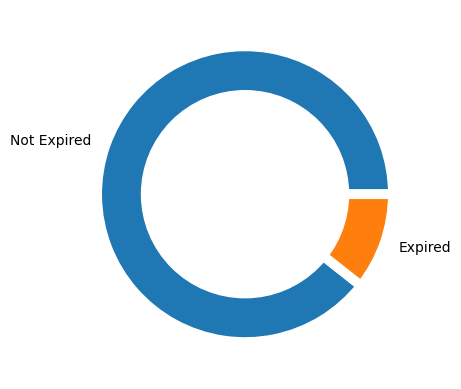

In [540]:
# Create a pieplot for 'HOSPITAL_EXPIRE_FLAG'

labels=['Not Expired', 'Expired']

plt.pie(a['Count'] ,labels=labels, wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' } )

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)

plt.show()

In [541]:
na_percentage(adm_pat_icu_lab_chart)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [466]:
data = adm_pat_icu_lab_chart.dropna()

In [467]:
# checkpoint
data = data.copy()

In [468]:
data.shape

(19255, 36)

In [469]:
data.head()

,SUBJECT_ID_x,HADM_ID,ADMITTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,DOB,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,Unnamed: 0,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max
2,23,124321,2157-10-18 19:34:00,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,2082-07-17,0,23.0,1.1862,154.000000,133.437500,118.000000,13.95,13.243750,12.15,5263.0,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0
13,34,144319,2191-02-23 05:23:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRADYCARDIA,0,2,3.03,30,M,1886-07-18,1,34.0,1.5824,77.333333,73.222222,69.333333,11.85,11.375000,10.70,9652.0,55.864865,43.0,72.0,96.806452,92.0,100.0,17.270270,9.0,26.0
17,36,165660,2134-05-10 11:30:00,ELECTIVE,PHYS REFERRAL/NORMAL DELI,LONG TERM CARE HOSPITAL,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.00,32,M,2061-08-17,0,36.0,4.3483,126.000000,111.636364,85.000000,14.50,12.222222,10.90,14312.0,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0
26,357,101651,2199-10-20 12:05:00,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Private,NOT SPECIFIED,MARRIED,WHITE,PNEUMONIA,0,3,3.85,336,M,2135-03-22,1,357.0,0.9252,101.000000,74.000000,36.000000,12.50,10.980000,9.90,357.0,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0
92,85,112077,2167-07-25 18:49:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,SNF,Medicare,CATHOLIC,MARRIED,WHITE,PNEUMONIA,0,4,4.15,77,M,2090-09-18,1,85.0,1.9909,132.000000,110.000000,94.000000,10.40,9.066667,8.30,2587.0,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0


In [470]:
# convert the 'ADMITTIME' column to datetime format
 
data['ADMITTIME'] = pd.to_datetime(data['ADMITTIME']).dt.year

# convert the 'DOB' column to datetime format
 
data['DOB'] = pd.to_datetime(data['DOB']).dt.year

# Create a new column "AGE" that is the time difference between "ADMITTIME" and "DOB"
 
data['AGE'] = (data['ADMITTIME'] - data['DOB'])

In [471]:
data['AGE'].min(), data['AGE'].max(), data['AGE'].mean(), data['AGE'].std() 

(15, 311, 76.5662944689691, 57.058975286092625)

In [472]:
col_to_drop = ['ADMITTIME', 'DOB']

In [473]:
data.drop(columns=col_to_drop, inplace=True)

In [474]:
data.head()

,SUBJECT_ID_x,HADM_ID,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,Unnamed: 0,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
2,23,124321,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,20,M,0,23.0,1.1862,154.000000,133.437500,118.000000,13.95,13.243750,12.15,5263.0,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75
13,34,144319,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRADYCARDIA,0,2,3.03,30,M,1,34.0,1.5824,77.333333,73.222222,69.333333,11.85,11.375000,10.70,9652.0,55.864865,43.0,72.0,96.806452,92.0,100.0,17.270270,9.0,26.0,305
17,36,165660,ELECTIVE,PHYS REFERRAL/NORMAL DELI,LONG TERM CARE HOSPITAL,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.00,32,M,0,36.0,4.3483,126.000000,111.636364,85.000000,14.50,12.222222,10.90,14312.0,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73
26,357,101651,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Private,NOT SPECIFIED,MARRIED,WHITE,PNEUMONIA,0,3,3.85,336,M,1,357.0,0.9252,101.000000,74.000000,36.000000,12.50,10.980000,9.90,357.0,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64
92,85,112077,EMERGENCY,CLINIC REFERRAL/PREMATURE,SNF,Medicare,CATHOLIC,MARRIED,WHITE,PNEUMONIA,0,4,4.15,77,M,1,85.0,1.9909,132.000000,110.000000,94.000000,10.40,9.066667,8.30,2587.0,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0,77


In [475]:
na_percentage(data)

(                     Column Name  NA Count  NA %
 0                   SUBJECT_ID_x         0   0.0
 1                        HADM_ID         0   0.0
 2                 ADMISSION_TYPE         0   0.0
 3             ADMISSION_LOCATION         0   0.0
 4             DISCHARGE_LOCATION         0   0.0
 5                      INSURANCE         0   0.0
 6                       RELIGION         0   0.0
 7                 MARITAL_STATUS         0   0.0
 8                      ETHNICITY         0   0.0
 9                      DIAGNOSIS         0   0.0
 10          HOSPITAL_EXPIRE_FLAG         0   0.0
 11      ADMISSIONS_DURATION_DAYS         0   0.0
 12  ADMISSIONS_ED_DURATION_HOURS         0   0.0
 13                        ROW_ID         0   0.0
 14                        GENDER         0   0.0
 15                   EXPIRE_FLAG         0   0.0
 16                  SUBJECT_ID_y         0   0.0
 17                  LOS_icustays         0   0.0
 18         Glucose_Lab_VALUE_max         0   0.0


In [476]:
data['AGE'] = remove_outliers(data['AGE'])

In [477]:
data.dropna(inplace=True)

In [478]:
data.shape

(18151, 35)

In [479]:
data.head(2)

,SUBJECT_ID_x,HADM_ID,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,ROW_ID,GENDER,EXPIRE_FLAG,SUBJECT_ID_y,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,Unnamed: 0,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
2,23,124321,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.0,20,M,0,23.0,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,5263.0,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
17,36,165660,ELECTIVE,PHYS REFERRAL/NORMAL DELI,LONG TERM CARE HOSPITAL,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.0,32,M,0,36.0,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,14312.0,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0


In [480]:
col_to_drop = ['Unnamed: 0', 'SUBJECT_ID_x','SUBJECT_ID_y','HADM_ID', 'ROW_ID', 'DISCHARGE_LOCATION', 'EXPIRE_FLAG']

In [481]:
data.drop(columns=col_to_drop, inplace=True)

In [482]:
data.head(2)

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
2,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.0,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
17,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.0,M,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0


In [483]:
%time data.drop_duplicates(inplace=True)

CPU times: user 25.1 ms, sys: 4.03 ms, total: 29.2 ms
Wall time: 28.3 ms


In [484]:
data.shape

(18151, 28)

In [485]:
create_value_counts_dataframe(data, 'HOSPITAL_EXPIRE_FLAG')

,Category,Count,Percentage
0,0,16550,91.179549
1,1,1601,8.820451


In [486]:
na_percentage(data)

(                     Column Name  NA Count  NA %
 0                 ADMISSION_TYPE         0   0.0
 1             ADMISSION_LOCATION         0   0.0
 2                      INSURANCE         0   0.0
 3                       RELIGION         0   0.0
 4                 MARITAL_STATUS         0   0.0
 5                      ETHNICITY         0   0.0
 6                      DIAGNOSIS         0   0.0
 7           HOSPITAL_EXPIRE_FLAG         0   0.0
 8       ADMISSIONS_DURATION_DAYS         0   0.0
 9   ADMISSIONS_ED_DURATION_HOURS         0   0.0
 10                        GENDER         0   0.0
 11                  LOS_icustays         0   0.0
 12         Glucose_Lab_VALUE_max         0   0.0
 13        Glucose_Lab_VALUE_mean         0   0.0
 14         Glucose_Lab_VALUE_min         0   0.0
 15      Hemoglobin_Lab_VALUE_max         0   0.0
 16     Hemoglobin_Lab_VALUE_mean         0   0.0
 17      Hemoglobin_Lab_VALUE_min         0   0.0
 18                       hr_mean         0   0.0


In [487]:
data["ADMISSIONS_DURATION_DAYS"] = data['ADMISSIONS_DURATION_DAYS'].replace(-1,0)
data["ADMISSIONS_ED_DURATION_HOURS"] = data['ADMISSIONS_ED_DURATION_HOURS'].replace(-1,0)

In [488]:
# saving the cleaned dataset

%time data.to_parquet("Cleaned_Dataset.parquet", compression=None)

CPU times: user 57.8 ms, sys: 0 ns, total: 57.8 ms
Wall time: 63.1 ms


In [489]:
data.head()

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
2,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
17,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.00,M,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0
26,EMERGENCY,EMERGENCY ROOM ADMIT,Private,NOT SPECIFIED,MARRIED,WHITE,PNEUMONIA,0,3,3.85,M,0.9252,101.0,74.000000,36.0,12.50,10.980000,9.90,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64.0
92,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,MARRIED,WHITE,PNEUMONIA,0,4,4.15,M,1.9909,132.0,110.000000,94.0,10.40,9.066667,8.30,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0,77.0
118,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,SEPARATED,HISPANIC OR LATINO,HYPERKALEMIA;CONGESTIVE HEART FAILURE,0,4,3.28,M,1.0806,155.0,133.937500,122.5,12.80,11.985714,11.30,67.666667,54.0,84.0,95.444444,91.0,100.0,18.962963,14.0,26.0,69.0


In [490]:
data.shape

(18151, 28)

### 3.1.4 Encoding categorical columns

In [491]:
%time data = pd.read_parquet("Cleaned_Dataset.parquet", engine="fastparquet")

CPU times: user 13.6 ms, sys: 0 ns, total: 13.6 ms
Wall time: 12.9 ms


In [492]:
cat_col = list(data.select_dtypes(['object']).columns)

In [493]:
cat_col

['ADMISSION_TYPE',
 'ADMISSION_LOCATION',
 'INSURANCE',
 'RELIGION',
 'MARITAL_STATUS',
 'ETHNICITY',
 'DIAGNOSIS',
 'GENDER']

In [494]:
def lowercase_categorical_values(df, cat_cols):
    """
    Convert all categorical values in the specified columns to lowercase.
    
    Args:
    df (pandas.DataFrame): The input DataFrame.
    cat_cols (list): A list of column names containing categorical values.
    
    Returns:
    pandas.DataFrame: The modified DataFrame with lowercase categorical values.
    """
    for col in cat_cols:
        df[col] = df[col].str.lower()
    return df


In [495]:
# converting all categorical column values to lowercase (there is a drop of 23 columns after this)

data = lowercase_categorical_values(data, cat_cols=cat_col)

In [496]:
data.head(3)

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,emergency,transfer from hosp/extram,medicare,catholic,married,white,brain mass,0,6,0.00,m,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
17,elective,phys referral/normal deli,medicare,not specified,married,white,ventral hernia/sda,0,10,0.00,m,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0
26,emergency,emergency room admit,private,not specified,married,white,pneumonia,0,3,3.85,m,0.9252,101.0,74.000000,36.0,12.50,10.980000,9.90,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64.0


In [497]:
%time encoded_data = pd.get_dummies(data, columns = cat_col)

CPU times: user 197 ms, sys: 44.1 ms, total: 242 ms
Wall time: 241 ms


In [498]:
encoded_data.shape

(18151, 5725)

In [499]:
num_col = list(data.select_dtypes(['int64', 'float64']).columns)

In [500]:
num_col

['HOSPITAL_EXPIRE_FLAG',
 'ADMISSIONS_DURATION_DAYS',
 'ADMISSIONS_ED_DURATION_HOURS',
 'LOS_icustays',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'Glucose_Lab_VALUE_min',
 'Hemoglobin_Lab_VALUE_max',
 'Hemoglobin_Lab_VALUE_mean',
 'Hemoglobin_Lab_VALUE_min',
 'hr_mean',
 'hr_min',
 'hr_max',
 'spO2_mean',
 'spO2_min',
 'spO2_max',
 'resp_rate_mean',
 'resp_rate_min',
 'resp_rate_max',
 'AGE']

In [501]:
encoded_data.columns

Index(['HOSPITAL_EXPIRE_FLAG', 'ADMISSIONS_DURATION_DAYS', 'ADMISSIONS_ED_DURATION_HOURS', 'LOS_icustays', 'Glucose_Lab_VALUE_max', 'Glucose_Lab_VALUE_mean', 'Glucose_Lab_VALUE_min', 'Hemoglobin_Lab_VALUE_max', 'Hemoglobin_Lab_VALUE_mean', 'Hemoglobin_Lab_VALUE_min',
       ...
       'DIAGNOSIS_worsening shortness of breat;congestive heart failure\right and left heart catheterization', 'DIAGNOSIS_wound dehiscence', 'DIAGNOSIS_wound drainage', 'DIAGNOSIS_wound infection', 'DIAGNOSIS_wound infection;hypotension', 'DIAGNOSIS_wound to rle', 'DIAGNOSIS_zenker's diverticulum/sda', 'DIAGNOSIS_zoster vs. meningitis', 'GENDER_f', 'GENDER_m'], dtype='object', length=5725)

In [502]:
encoded_data.head()

,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE,ADMISSION_TYPE_elective,ADMISSION_TYPE_emergency,ADMISSION_TYPE_urgent,ADMISSION_LOCATION_clinic referral/premature,ADMISSION_LOCATION_emergency room admit,ADMISSION_LOCATION_phys referral/normal deli,ADMISSION_LOCATION_transfer from hosp/extram,ADMISSION_LOCATION_transfer from other healt,ADMISSION_LOCATION_transfer from skilled nur,ADMISSION_LOCATION_trsf within this facility,INSURANCE_government,INSURANCE_medicaid,INSURANCE_medicare,INSURANCE_private,INSURANCE_self pay,RELIGION_7th day adventist,RELIGION_buddhist,RELIGION_catholic,RELIGION_christian scientist,RELIGION_episcopalian,RELIGION_greek orthodox,RELIGION_hebrew,RELIGION_hindu,RELIGION_jehovah's witness,RELIGION_jewish,RELIGION_muslim,RELIGION_not specified,RELIGION_other,RELIGION_protestant quaker,RELIGION_religion_not_specified,RELIGION_romanian east. orth,RELIGION_unitarian-universalist,MARITAL_STATUS_divorced,MARITAL_STATUS_maritial_status_not_specified,MARITAL_STATUS_married,MARITAL_STATUS_separated,MARITAL_STATUS_single,MARITAL_STATUS_widowed,ETHNICITY_american indian/alaska native,ETHNICITY_american indian/alaska native federally recognized tribe,ETHNICITY_asian,ETHNICITY_asian - asian indian,ETHNICITY_asian - cambodian,ETHNICITY_asian - chinese,ETHNICITY_asian - filipino,ETHNICITY_asian - japanese,ETHNICITY_asian - korean,ETHNICITY_asian - other,ETHNICITY_asian - thai,ETHNICITY_asian - vietnamese,ETHNICITY_black/african,ETHNICITY_black/african american,ETHNICITY_black/cape verdean,ETHNICITY_black/haitian,ETHNICITY_caribbean island,ETHNICITY_ethnicity_not_specified,ETHNICITY_hispanic or latino,ETHNICITY_hispanic/latino - central american (other),ETHNICITY_hispanic/latino - colombian,ETHNICITY_hispanic/latino - cuban,ETHNICITY_hispanic/latino - dominican,ETHNICITY_hispanic/latino - guatemalan,ETHNICITY_hispanic/latino - honduran,ETHNICITY_hispanic/latino - mexican,ETHNICITY_hispanic/latino - puerto rican,ETHNICITY_hispanic/latino - salvadoran,ETHNICITY_middle eastern,ETHNICITY_multi race ethnicity,ETHNICITY_native hawaiian or other pacific islander,ETHNICITY_other,ETHNICITY_portuguese,ETHNICITY_south american,ETHNICITY_white,ETHNICITY_white - brazilian,ETHNICITY_white - eastern european,ETHNICITY_white - other european,ETHNICITY_white - russian,DIAGNOSIS_ mitral stenosis\mitral valve replacement /sda,DIAGNOSIS_ ? serotonin syndrome,DIAGNOSIS_ stemi,DIAGNOSIS_ thoracic aneurysm\replacement of ascending aortic / hemi arch under deep hypothermic circulatory arrest /sda,DIAGNOSIS_(aml) acute myelogenous leukemia,DIAGNOSIS_(aml) acute myelogenous leukemia;hypotension,DIAGNOSIS_+ troponin,DIAGNOSIS_.\ventricular tachycardia ablation **remote west**,DIAGNOSIS_22wks lupus,"DIAGNOSIS_26wks,pih,preeclampsia",DIAGNOSIS_28 weeks pregnant;respiratory failure,DIAGNOSIS_3 vessel coronary artery disease,DIAGNOSIS_3 vessel disease,DIAGNOSIS_3 vessel disease requiring coronary artery bypass graft,DIAGNOSIS_3 vessell coronary artery disease,DIAGNOSIS_3-vessel coronary artery disease,DIAGNOSIS_34 weeks placenta creda and abd pain,DIAGNOSIS_34 weeks;pregnancy induced hypertension,DIAGNOSIS_37 weeks;atrial fibrillation;telemetry;tachycardia,DIAGNOSIS_39wks labor,DIAGNOSIS_3rd degree heart block sarcoid,"DIAGNOSIS_3rd, 4th, 5th finger partial ampuation right hand",DIAGNOSIS_90% left main coronary artery disease,DIAGNOSIS_? abscess,DIAGNOSIS_? aortic filling defect,DIAGNOSIS_? babesiosis,DIAGNOSIS_? bile leak;hypoxia,DIAGNOSIS_? brain tumor,DIAGNOSIS_? cholangitis,DIAGNOSIS_? endocarditis,DIAGNOSIS_? esophageal fb; poss mediastinitis,DIAGNOSIS_? gallstones; pancreatitis,DIAGNOSIS_? guillian barre,DIAGNOSIS_? infected aorta graft,DIAGNOSIS_? ingestion,DIAGNOSIS_

In [503]:
encoded_data.shape

(18151, 5725)

# 4. Model Building - Mortality Prediction

In [504]:
columns_to_drop = ['HOSPITAL_EXPIRE_FLAG']

In [505]:
# Split the dataset into features (X) and target (y)
X = encoded_data.drop(columns_to_drop, axis=1) # drop the target column
y = encoded_data['HOSPITAL_EXPIRE_FLAG']

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,
                                                   stratify=encoded_data['HOSPITAL_EXPIRE_FLAG'])


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

Training set shape: X=(13613, 5724), y=(13613,)
Testing set shape: X=(4538, 5724), y=(4538,)


## 4.1 Random Forest


In [506]:
# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)



In [507]:
%time rf.fit(X_train, y_train)

CPU times: user 1.67 s, sys: 201 ms, total: 1.87 s
Wall time: 1.87 s


RandomForestClassifier(n_estimators=10, random_state=10)

In [508]:
# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 92.55%


### 4.1.1 Feature importance

In [510]:
# Get feature importances
importances = rf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X_train.columns[i] for i in indices]

In [511]:
names[:20]

['ADMISSIONS_DURATION_DAYS',
 'resp_rate_mean',
 'hr_max',
 'hr_min',
 'LOS_icustays',
 'Glucose_Lab_VALUE_min',
 'hr_mean',
 'spO2_mean',
 'AGE',
 'Hemoglobin_Lab_VALUE_mean',
 'resp_rate_min',
 'Hemoglobin_Lab_VALUE_max',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'spO2_min',
 'Hemoglobin_Lab_VALUE_min',
 'resp_rate_max',
 'ADMISSIONS_ED_DURATION_HOURS',
 'GENDER_m',
 'ADMISSION_LOCATION_clinic referral/premature']

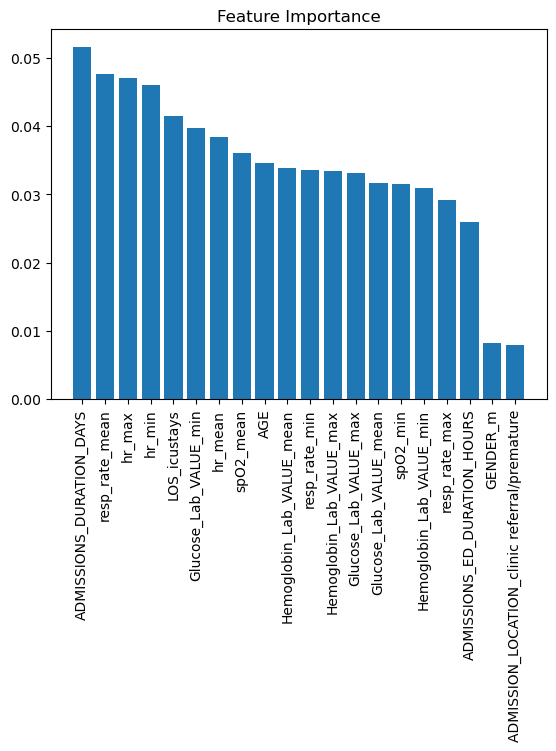

In [512]:
# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(0,20), importances[indices[:20]])

# Add feature names as x-axis labels
plt.xticks(range(0,20), names[:20], rotation=90)

# Show plot
plt.show()

In [377]:
# Creating a dataframe that contains a feature name and its importance score
features = list(zip(names, importances[indices]))

# Create a pandas DataFrame from the list of tuples
feature_importance_df = pd.DataFrame(features, columns=['Feature', 'Importance'])


In [378]:
# Print the DataFrame
feature_importance_df.head(100)

,Feature,Importance
0,ADMISSIONS_DURATION_DAYS,0.051580
1,resp_rate_mean,0.047665
2,hr_max,0.047111
3,hr_min,0.046078
4,LOS_icustays,0.041402
5,Glucose_Lab_VALUE_min,0.039768
6,hr_mean,0.038373
7,spO2_mean,0.035982
8,AGE,0.034568
9,Hemoglobin_Lab_VALUE_mean,0.033872


In [379]:
# Print the DataFrame
feature_importance_df.tail(100)

,Feature,Importance
5624,DIAGNOSIS_mitral stenosis\mitral valve replace...,0.0
5625,DIAGNOSIS_mitral stenosis\mitral valve vs repl...,0.0
5626,DIAGNOSIS_mitral stenosis\mitral valvuloplasty,0.0
5627,DIAGNOSIS_mitral stenosis\mvr; ? coronary arte...,0.0
5628,DIAGNOSIS_mitral stenosis\redo mitral valve re...,0.0
5629,DIAGNOSIS_mitral stenosis\repair vs replacemen...,0.0
5630,DIAGNOSIS_mitral stenosis\minimally invasive v...,0.0
5631,DIAGNOSIS_mitral valse insufficiency\mitral va...,0.0
5632,DIAGNOSIS_mitral value replacement,0.0
5633,DIAGNOSIS_mitral valve deficiency\mitral valve...,0.0


### 4.1.2 Feature selection

In [380]:
# selecting features with high importance (greater than 0.005)
selected_features = names[:30]

### 4.1.3 Random Forest with selected features

In [381]:
# Split the dataset into features (X) and target (y)
X = encoded_data[selected_features]
y = encoded_data['HOSPITAL_EXPIRE_FLAG']

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,
                                                   stratify=encoded_data['HOSPITAL_EXPIRE_FLAG'])


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

Training set shape: X=(13613, 30), y=(13613,)
Testing set shape: X=(4538, 30), y=(4538,)


In [382]:
# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)

In [383]:
# fitting the model

%time rf.fit(X_train, y_train)

CPU times: user 326 ms, sys: 3.87 ms, total: 330 ms
Wall time: 329 ms


RandomForestClassifier(n_estimators=10, random_state=10)

In [384]:
# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 92.97%


In [385]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[4123   15]
 [ 304   96]]


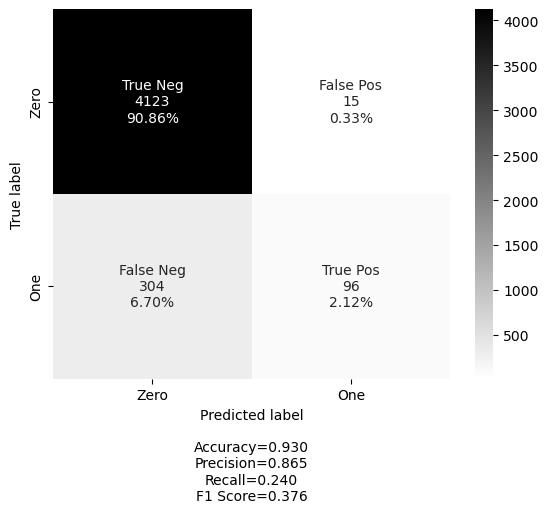

In [388]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

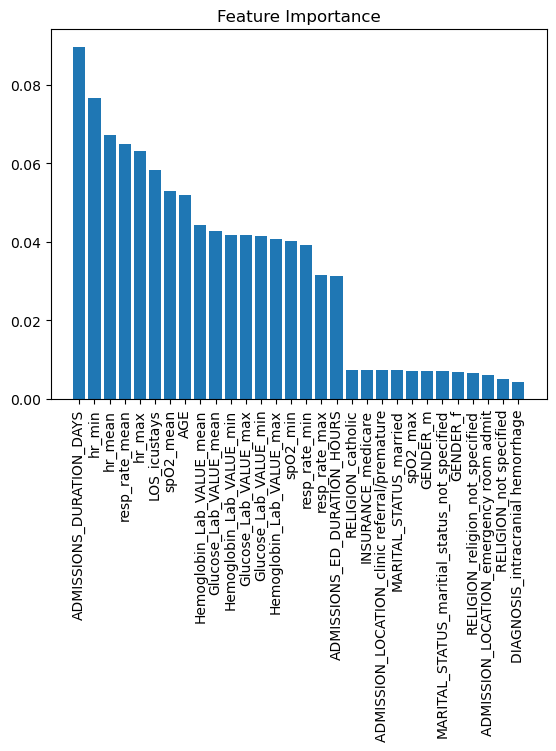

In [389]:
# Get feature importances
importances = rf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X_train.columns[i] for i in indices]

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(0,30), importances[indices[:30]])

# Add feature names as x-axis labels
plt.xticks(range(0,30), names[:30], rotation=90)

# Show plot
plt.show()

In [390]:
# selecting features with high importance (greater than 0.008)
selected_features = names[:12]

Training set shape: X=(13613, 12), y=(13613,)
Testing set shape: X=(4538, 12), y=(4538,)
CPU times: user 353 ms, sys: 0 ns, total: 353 ms
Wall time: 353 ms
Accuracy: 92.97%


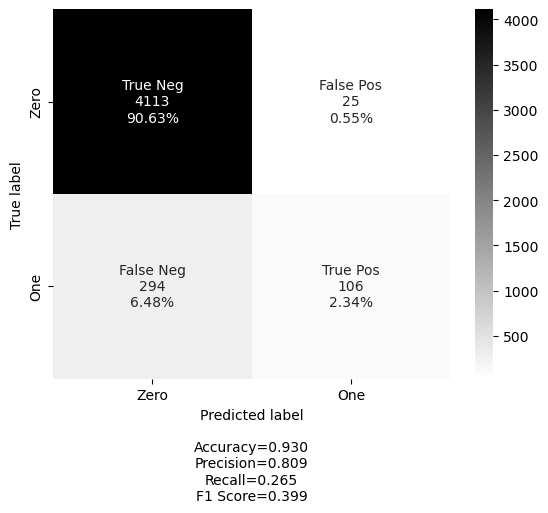

In [391]:
# Split the dataset into features (X) and target (y)
X = encoded_data[selected_features]
y = encoded_data['HOSPITAL_EXPIRE_FLAG']

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,
                                                   stratify=encoded_data['HOSPITAL_EXPIRE_FLAG'])


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)

# fitting the model

%time rf.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

### 4.1.4 Dropping admission duration days and LOS_icustays features

In [392]:
X = encoded_data[selected_features]

In [393]:
X = X.drop(columns=['ADMISSIONS_DURATION_DAYS', 'LOS_icustays'], axis=1)

In [394]:
X.columns

Index(['hr_min', 'hr_mean', 'resp_rate_mean', 'hr_max', 'spO2_mean', 'AGE', 'Hemoglobin_Lab_VALUE_mean', 'Glucose_Lab_VALUE_mean', 'Hemoglobin_Lab_VALUE_min', 'Glucose_Lab_VALUE_max'], dtype='object')

Training set shape: X=(13613, 10), y=(13613,)
Testing set shape: X=(4538, 10), y=(4538,)
CPU times: user 345 ms, sys: 0 ns, total: 345 ms
Wall time: 344 ms
Accuracy: 92.75%


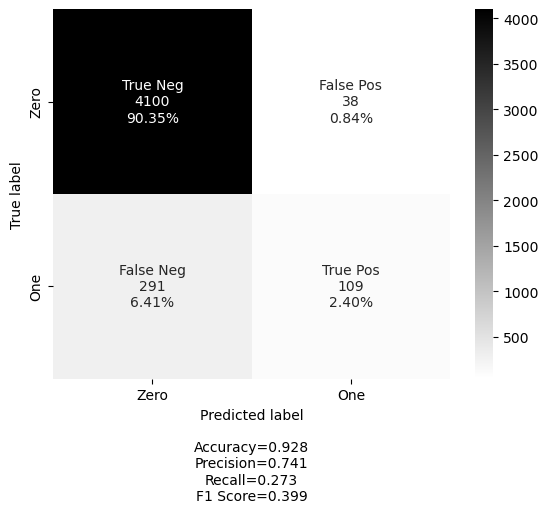

In [395]:

# Split the dataset into features (X) and target (y)
#X = encoded_data[selected_features]
y = encoded_data['HOSPITAL_EXPIRE_FLAG']

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,
                                                   stratify=encoded_data['HOSPITAL_EXPIRE_FLAG'])


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)

# fitting the model

%time rf.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

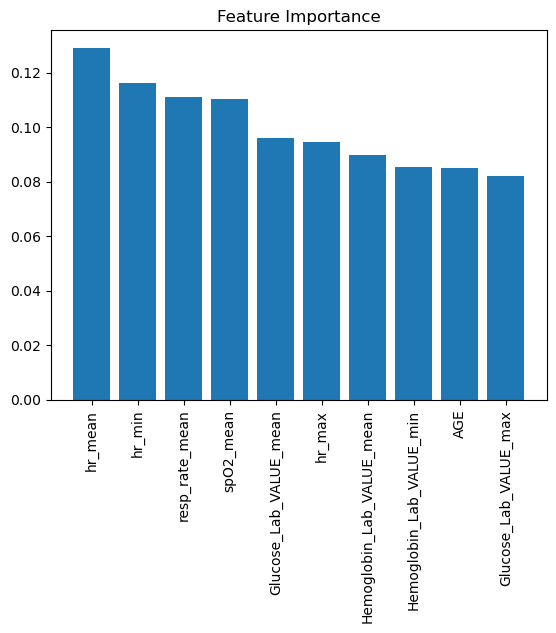

In [396]:
# Get feature importances
importances = rf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X_train.columns[i] for i in indices]

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(X_train.shape[1]), importances[indices])

# Add feature names as x-axis labels
plt.xticks(range(X_train.shape[1]), names, rotation=90)

# Show plot
plt.show()

# 5. Mortality prediction with Various Classification Methods


In [397]:
data.head()

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,emergency,transfer from hosp/extram,medicare,catholic,married,white,brain mass,0,6,0.00,m,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
17,elective,phys referral/normal deli,medicare,not specified,married,white,ventral hernia/sda,0,10,0.00,m,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0
26,emergency,emergency room admit,private,not specified,married,white,pneumonia,0,3,3.85,m,0.9252,101.0,74.000000,36.0,12.50,10.980000,9.90,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64.0
92,emergency,clinic referral/premature,medicare,catholic,married,white,pneumonia,0,4,4.15,m,1.9909,132.0,110.000000,94.0,10.40,9.066667,8.30,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0,77.0
118,emergency,clinic referral/premature,medicare,catholic,separated,hispanic or latino,hyperkalemia;congestive heart failure,0,4,3.28,m,1.0806,155.0,133.937500,122.5,12.80,11.985714,11.30,67.666667,54.0,84.0,95.444444,91.0,100.0,18.962963,14.0,26.0,69.0


In [398]:
data.shape

(18151, 28)

In [399]:
selected_features = ['ADMISSIONS_DURATION_DAYS',
 'resp_rate_mean',
 'hr_max',
 'hr_min',
 'LOS_icustays',
 'Glucose_Lab_VALUE_min',
 'hr_mean',
 'spO2_mean',
 'AGE',
 'Hemoglobin_Lab_VALUE_mean',
 'resp_rate_min',
 'Hemoglobin_Lab_VALUE_max',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'spO2_min',
 'Hemoglobin_Lab_VALUE_min',
 'resp_rate_max']

In [400]:
X = data[selected_features]
y = data['HOSPITAL_EXPIRE_FLAG']

In [401]:
X.shape, y.shape

((18151, 10), (18151,))

In [402]:
random_seed = 9

In [403]:
# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=random_seed,
                                                   stratify=data['HOSPITAL_EXPIRE_FLAG'])

In [404]:
# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

Training set shape: X=(13613, 10), y=(13613,)
Testing set shape: X=(4538, 10), y=(4538,)


In [405]:
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }


In [406]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 21.9 s, sys: 407 ms, total: 22.3 s
Wall time: 9.67 s


In [407]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
gradient_boosting,0.936,0.923,0.330,0.253,0.841,0.366,0.378
random_forest,0.974,0.911,0.918,0.407,0.838,0.446,0.400
logistic,0.919,0.918,0.130,0.130,0.776,0.219,0.277
naive_bayes,0.884,0.879,0.325,0.305,0.769,0.308,0.241
mlp,0.916,0.914,0.097,0.090,0.765,0.156,0.204
knn,0.926,0.917,0.219,0.165,0.739,0.260,0.290
decision_tree,0.932,0.914,0.274,0.170,0.736,0.259,0.271
ridge,0.733,0.721,0.701,0.695,nan,0.305,0.256


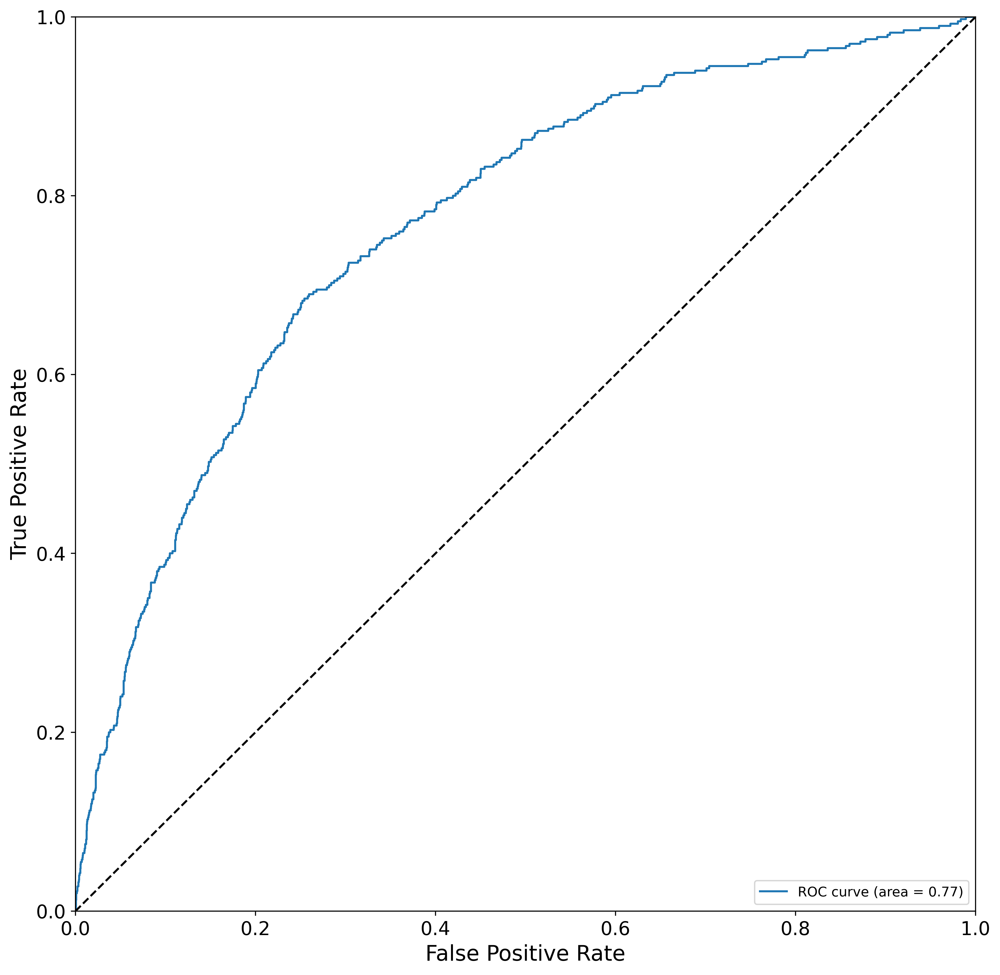

In [408]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['naive_bayes']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['naive_bayes']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

## 5.1 Interpreting Classification Models

### 5.1.1 Logistic Regresion

In [409]:
coefs_log = class_models['logistic']['fitted'].coef_
intercept_log = class_models['logistic']['fitted'].intercept_
print('coefficients:\t%s' % coefs_log)
print('intercept:\t%s' % intercept_log)

coefficients:	[[ 0.07018915  0.16300166  0.02932339  0.07423373  0.04018704 -0.05991051
   0.01129115 -0.06877366 -0.05069808 -0.17477931]]
intercept:	[-0.00214345]


In [410]:
stdv = np.std(X_train, 0)
abs(coefs_log.reshape(10,) * stdv).sort_values(ascending=False)

hr_mean                         0.953462
hr_min                          0.790970
resp_rate_mean                  0.521263
AGE                             0.478535
spO2_min                        0.415705
resp_rate_max                   0.212943
resp_rate_min                   0.210742
hr_max                          0.205180
ADMISSIONS_ED_DURATION_HOURS    0.136804
spO2_mean                       0.116581
dtype: float64

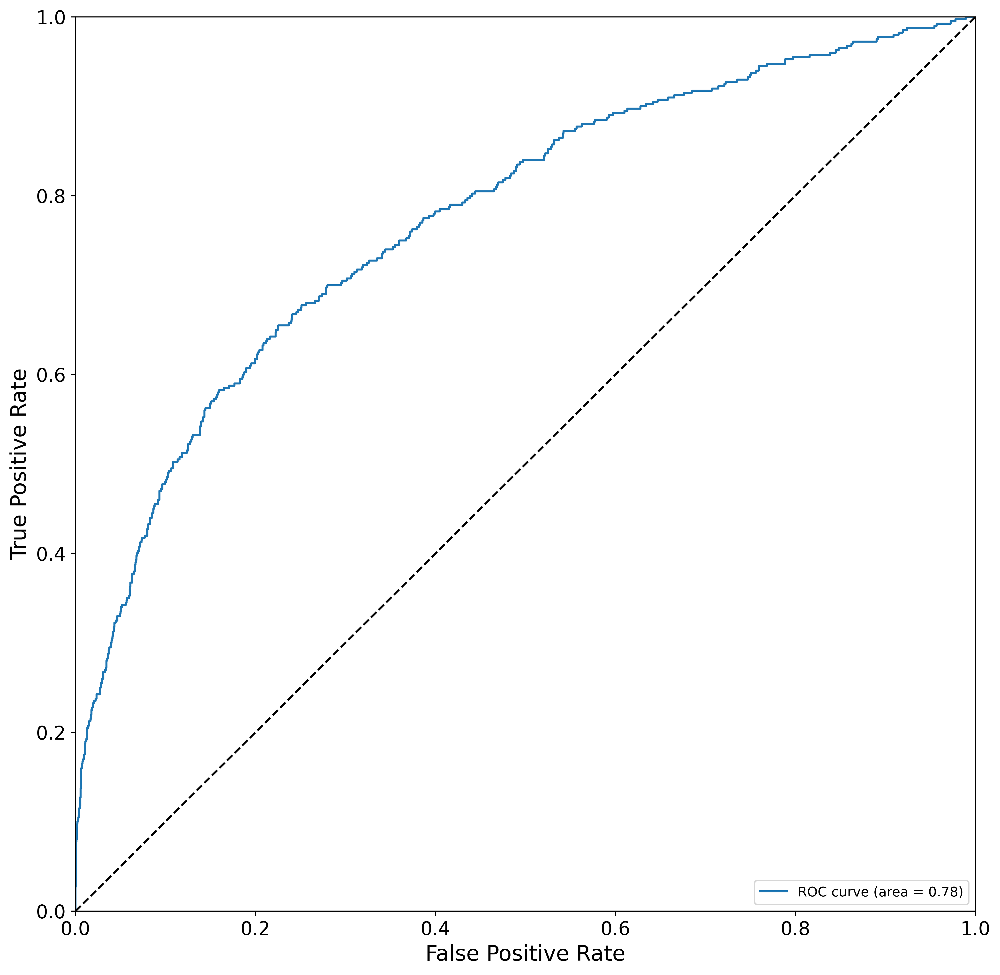

In [411]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['logistic']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['logistic']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 5.1.2 Decision Tree

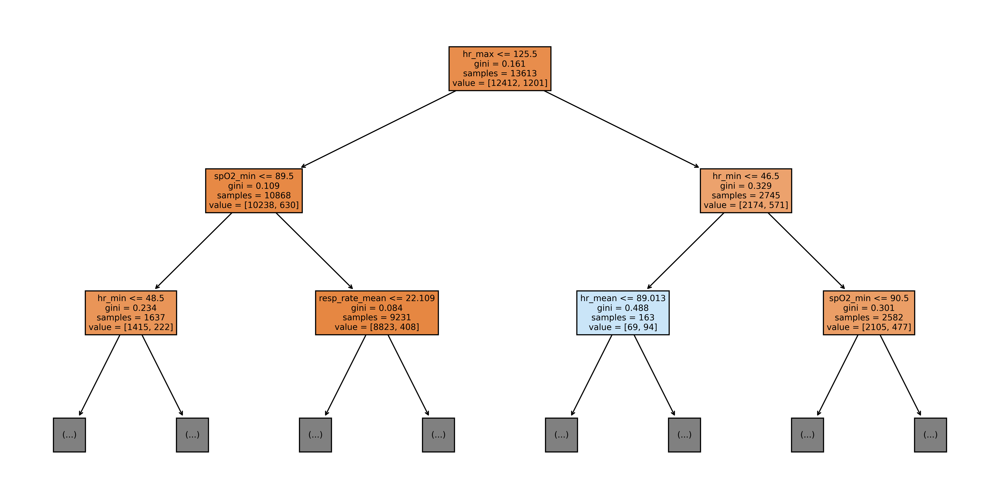

In [412]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (16,8), dpi=600)
tree.plot_tree(class_models['decision_tree']['fitted'],\
               feature_names=X_train.columns.values.tolist(), filled = True, max_depth=2)
fig.show()

In [413]:
text_tree = tree.export_text(class_models['decision_tree']['fitted'],\
               feature_names=X_train.columns.values.tolist())
print(text_tree)

|--- hr_max <= 125.50
|   |--- spO2_min <= 89.50
|   |   |--- hr_min <= 48.50
|   |   |   |--- hr_mean <= 81.70
|   |   |   |   |--- spO2_mean <= 97.59
|   |   |   |   |   |--- hr_max <= 65.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- hr_max >  65.50
|   |   |   |   |   |   |--- ADMISSIONS_ED_DURATION_HOURS <= 8.29
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- ADMISSIONS_ED_DURATION_HOURS >  8.29
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- spO2_mean >  97.59
|   |   |   |   |   |--- hr_mean <= 73.58
|   |   |   |   |   |   |--- resp_rate_mean <= 17.82
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- resp_rate_mean >  17.82
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- hr_mean >  73.58
|   |   |   |   |   |   |--- AGE <= 76.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- AGE >  76.50
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |--- hr_mean >  81

In [414]:
dt_imp_df = pd.DataFrame({'feature':X_train.columns.values.tolist(),\
                        'importance': class_models['decision_tree']['fitted'].feature_importances_}).\
            sort_values(by='importance', ascending=False)
dt_imp_df

,feature,importance
5,hr_min,0.182130
6,hr_max,0.181097
0,hr_mean,0.174154
3,spO2_mean,0.127126
9,spO2_min,0.100932
2,AGE,0.098018
1,resp_rate_mean,0.083317
7,resp_rate_min,0.028479
4,ADMISSIONS_ED_DURATION_HOURS,0.020263
8,resp_rate_max,0.004485


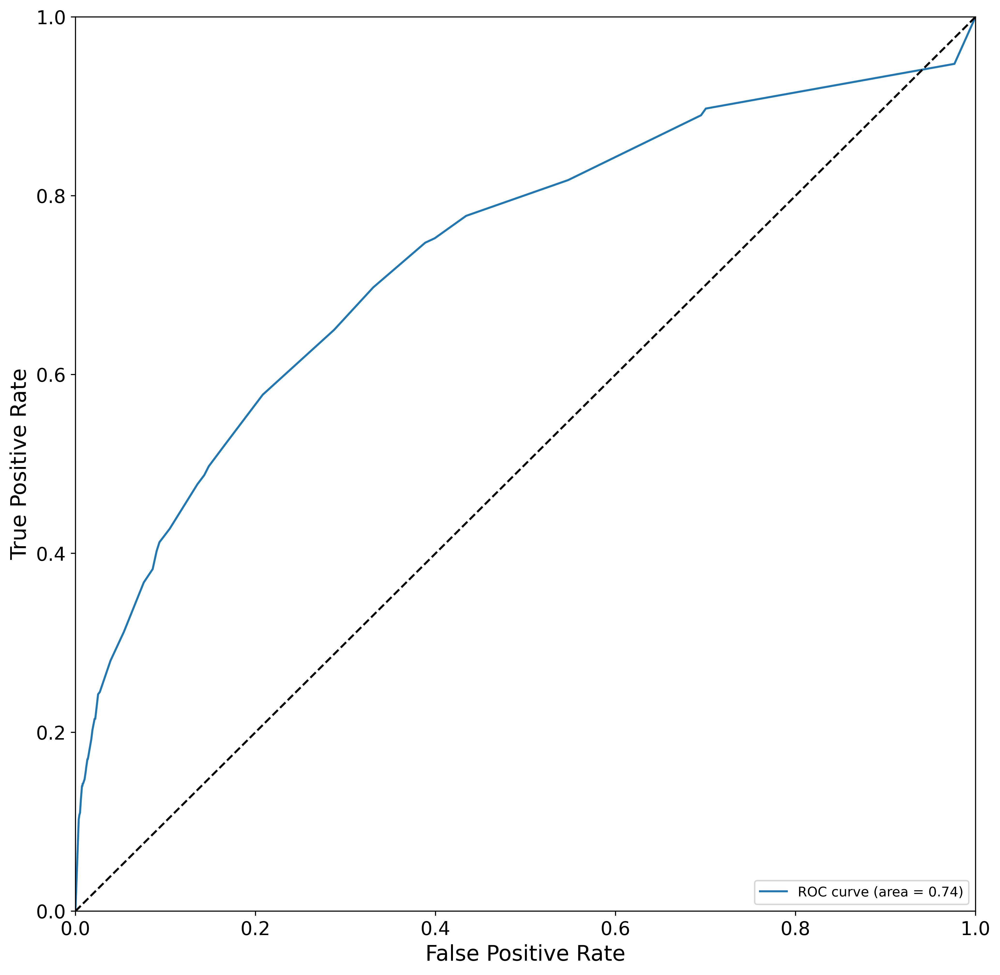

In [415]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['decision_tree']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['decision_tree']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 5.1.3 Random Forest

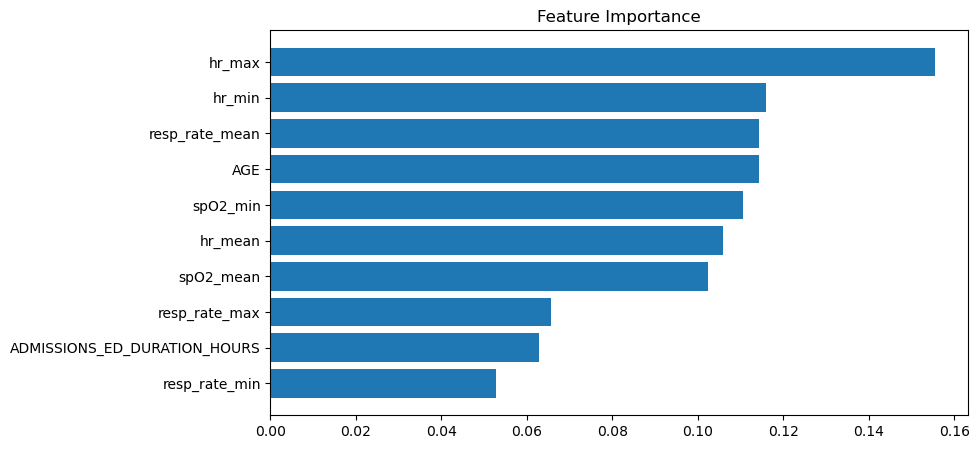

In [416]:
# Get feature importances
importances = class_models['random_forest']['fitted'].feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X_train.columns[i] for i in indices]

# Create plot
plt.figure(figsize=(9,5))

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.barh(range(X_train.shape[1]), importances[indices][::-1])

# Add feature names as x-axis labels
plt.yticks(range(X_train.shape[1]), names[::-1])

# Show plot
plt.show()

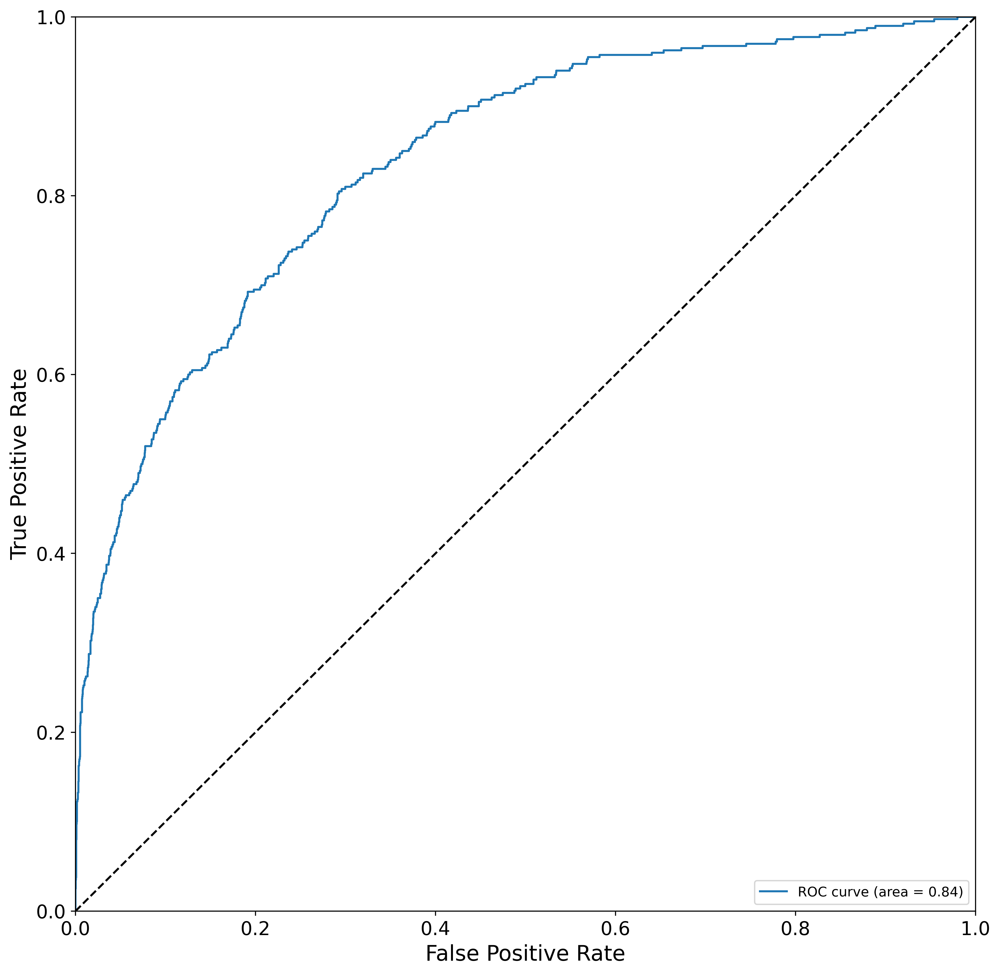

In [417]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['random_forest']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['random_forest']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 5.1.4 Gradient Boosting

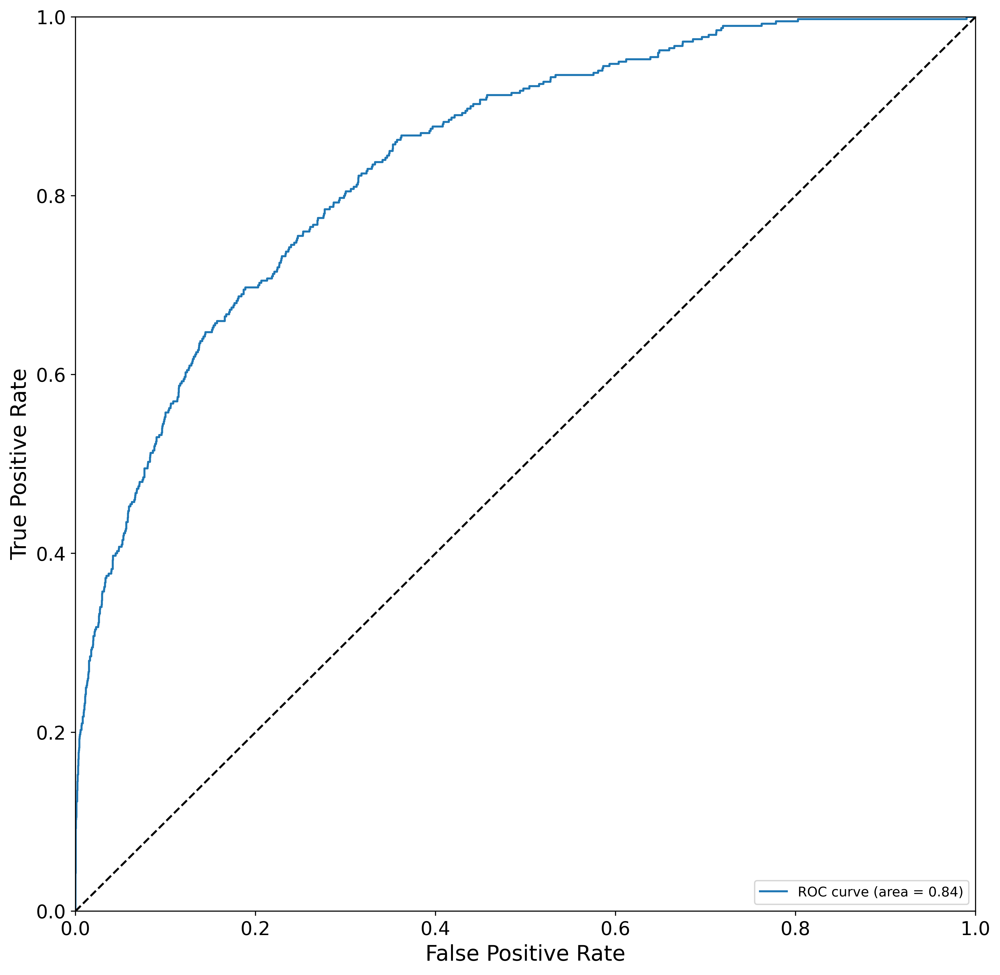

In [418]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['gradient_boosting']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['gradient_boosting']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 5.1.5 KNN

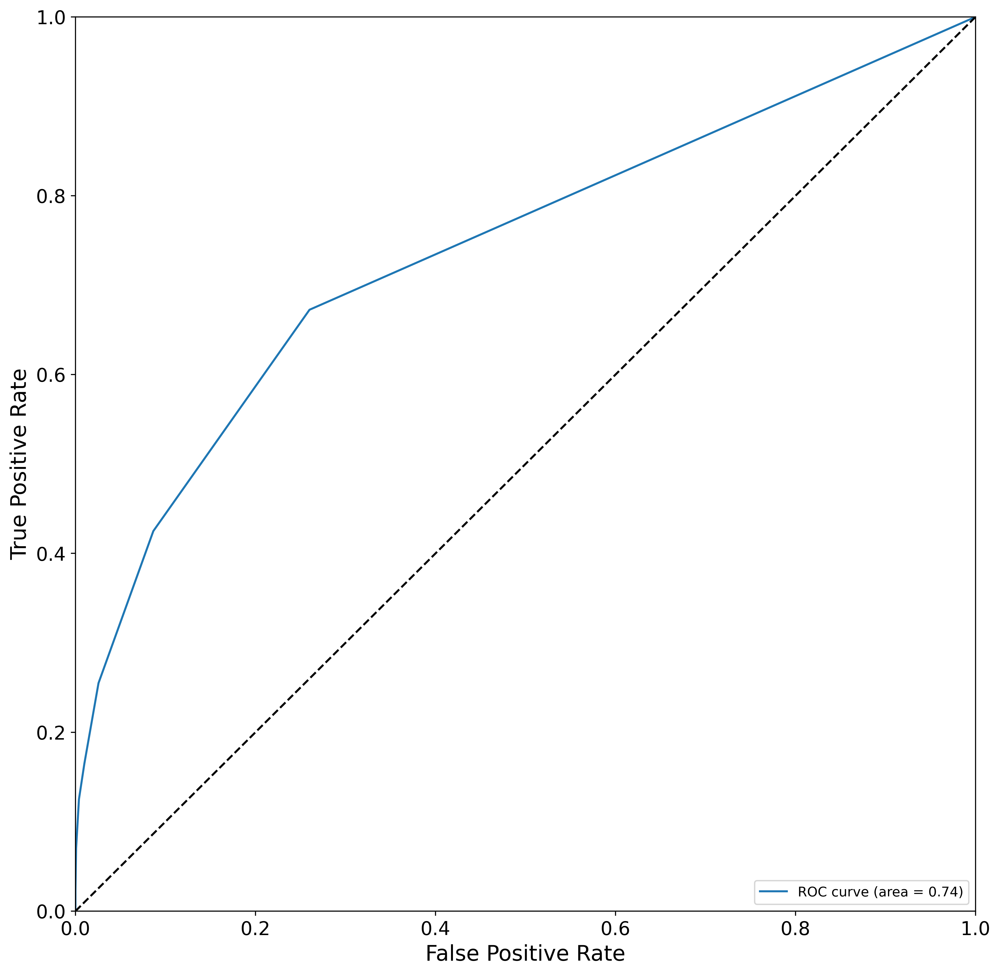

In [419]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['knn']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['knn']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 5.1.6 Computing SHAP Values using KernelExplainer

In [420]:
import shap

In [421]:
print(class_models.keys())

dict_keys(['logistic', 'ridge', 'decision_tree', 'knn', 'naive_bayes', 'gradient_boosting', 'random_forest', 'mlp'])


In [422]:
model = class_models['random_forest']['fitted']

In [423]:
explainer = shap.TreeExplainer(model)

In [424]:
X_test.head()

,hr_mean,resp_rate_mean,AGE,spO2_mean,ADMISSIONS_ED_DURATION_HOURS,hr_min,hr_max,resp_rate_min,resp_rate_max,spO2_min
index,,,,,,,,,,
38658,83.684211,21.684211,46.0,96.736842,2.23,77.0,93.0,11.0,31.0,92.0
58196,100.989011,15.595506,27.0,98.622222,6.02,82.0,124.0,7.0,30.0,90.0
40464,92.425926,19.320755,33.0,98.168224,5.57,57.0,129.0,7.0,33.0,92.0
43521,82.975610,18.625000,51.0,99.685714,0.00,69.0,92.0,11.0,28.0,96.0
19983,74.928571,19.211111,85.0,97.741379,5.43,69.0,93.0,12.0,26.0,90.0


In [425]:
test = X_test.reset_index(drop=True)

In [427]:
test.head(2)

,hr_mean,resp_rate_mean,AGE,spO2_mean,ADMISSIONS_ED_DURATION_HOURS,hr_min,hr_max,resp_rate_min,resp_rate_max,spO2_min
0,83.684211,21.684211,46.0,96.736842,2.23,77.0,93.0,11.0,31.0,92.0
1,100.989011,15.595506,27.0,98.622222,6.02,82.0,124.0,7.0,30.0,90.0


In [428]:
# Calculating Shap values
choosen_instance = test.loc[[1]]
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

## 6. Model building - Regression(Admission Duration Prediction)

In [429]:
encoded_data.head()

,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE,ADMISSION_TYPE_elective,ADMISSION_TYPE_emergency,ADMISSION_TYPE_urgent,ADMISSION_LOCATION_clinic referral/premature,ADMISSION_LOCATION_emergency room admit,ADMISSION_LOCATION_phys referral/normal deli,ADMISSION_LOCATION_transfer from hosp/extram,ADMISSION_LOCATION_transfer from other healt,ADMISSION_LOCATION_transfer from skilled nur,ADMISSION_LOCATION_trsf within this facility,INSURANCE_government,INSURANCE_medicaid,INSURANCE_medicare,INSURANCE_private,INSURANCE_self pay,RELIGION_7th day adventist,RELIGION_buddhist,RELIGION_catholic,RELIGION_christian scientist,RELIGION_episcopalian,RELIGION_greek orthodox,RELIGION_hebrew,RELIGION_hindu,RELIGION_jehovah's witness,RELIGION_jewish,RELIGION_muslim,RELIGION_not specified,RELIGION_other,RELIGION_protestant quaker,RELIGION_religion_not_specified,RELIGION_romanian east. orth,RELIGION_unitarian-universalist,MARITAL_STATUS_divorced,MARITAL_STATUS_maritial_status_not_specified,MARITAL_STATUS_married,MARITAL_STATUS_separated,MARITAL_STATUS_single,MARITAL_STATUS_widowed,ETHNICITY_american indian/alaska native,ETHNICITY_american indian/alaska native federally recognized tribe,ETHNICITY_asian,ETHNICITY_asian - asian indian,ETHNICITY_asian - cambodian,ETHNICITY_asian - chinese,ETHNICITY_asian - filipino,ETHNICITY_asian - japanese,ETHNICITY_asian - korean,ETHNICITY_asian - other,ETHNICITY_asian - thai,ETHNICITY_asian - vietnamese,ETHNICITY_black/african,ETHNICITY_black/african american,ETHNICITY_black/cape verdean,ETHNICITY_black/haitian,ETHNICITY_caribbean island,ETHNICITY_ethnicity_not_specified,ETHNICITY_hispanic or latino,ETHNICITY_hispanic/latino - central american (other),ETHNICITY_hispanic/latino - colombian,ETHNICITY_hispanic/latino - cuban,ETHNICITY_hispanic/latino - dominican,ETHNICITY_hispanic/latino - guatemalan,ETHNICITY_hispanic/latino - honduran,ETHNICITY_hispanic/latino - mexican,ETHNICITY_hispanic/latino - puerto rican,ETHNICITY_hispanic/latino - salvadoran,ETHNICITY_middle eastern,ETHNICITY_multi race ethnicity,ETHNICITY_native hawaiian or other pacific islander,ETHNICITY_other,ETHNICITY_portuguese,ETHNICITY_south american,ETHNICITY_white,ETHNICITY_white - brazilian,ETHNICITY_white - eastern european,ETHNICITY_white - other european,ETHNICITY_white - russian,DIAGNOSIS_ mitral stenosis\mitral valve replacement /sda,DIAGNOSIS_ ? serotonin syndrome,DIAGNOSIS_ stemi,DIAGNOSIS_ thoracic aneurysm\replacement of ascending aortic / hemi arch under deep hypothermic circulatory arrest /sda,DIAGNOSIS_(aml) acute myelogenous leukemia,DIAGNOSIS_(aml) acute myelogenous leukemia;hypotension,DIAGNOSIS_+ troponin,DIAGNOSIS_.\ventricular tachycardia ablation **remote west**,DIAGNOSIS_22wks lupus,"DIAGNOSIS_26wks,pih,preeclampsia",DIAGNOSIS_28 weeks pregnant;respiratory failure,DIAGNOSIS_3 vessel coronary artery disease,DIAGNOSIS_3 vessel disease,DIAGNOSIS_3 vessel disease requiring coronary artery bypass graft,DIAGNOSIS_3 vessell coronary artery disease,DIAGNOSIS_3-vessel coronary artery disease,DIAGNOSIS_34 weeks placenta creda and abd pain,DIAGNOSIS_34 weeks;pregnancy induced hypertension,DIAGNOSIS_37 weeks;atrial fibrillation;telemetry;tachycardia,DIAGNOSIS_39wks labor,DIAGNOSIS_3rd degree heart block sarcoid,"DIAGNOSIS_3rd, 4th, 5th finger partial ampuation right hand",DIAGNOSIS_90% left main coronary artery disease,DIAGNOSIS_? abscess,DIAGNOSIS_? aortic filling defect,DIAGNOSIS_? babesiosis,DIAGNOSIS_? bile leak;hypoxia,DIAGNOSIS_? brain tumor,DIAGNOSIS_? cholangitis,DIAGNOSIS_? endocarditis,DIAGNOSIS_? esophageal fb; poss mediastinitis,DIAGNOSIS_? gallstones; pancreatitis,DIAGNOSIS_? guillian barre,DIAGNOSIS_? infected aorta graft,DIAGNOSIS_? ingestion,DIAGNOSIS_

In [430]:
selected_features = ['ADMISSIONS_DURATION_DAYS',
 'resp_rate_mean',
 'hr_max',
 'hr_min',
 'LOS_icustays',
 'Glucose_Lab_VALUE_min',
 'hr_mean',
 'spO2_mean',
 'AGE',
 'Hemoglobin_Lab_VALUE_mean',
 'resp_rate_min',
 'Hemoglobin_Lab_VALUE_max',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'spO2_min',
 'Hemoglobin_Lab_VALUE_min',
 'resp_rate_max']

In [431]:
X = encoded_data[selected_features]
y = encoded_data['ADMISSIONS_DURATION_DAYS']

In [434]:

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

Training set shape: X=(13613, 10), y=(13613,)
Testing set shape: X=(4538, 10), y=(4538,)


In [435]:
random_state= 9

In [436]:
reg_models = {
        #Generalized Linear Models (GLMs)
        'linear':{'model': linear_model.LinearRegression()}, 
        'linear_poly':{'model': make_pipeline(PolynomialFeatures(degree=2),
                              linear_model.LinearRegression(fit_intercept=False)) },
        'linear_interact':{'model': make_pipeline(PolynomialFeatures(interaction_only=True),
                              linear_model.LinearRegression(fit_intercept=False)) },
        'ridge':{'model': linear_model.RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1]) }, 
        #Trees  
        'decision_tree':{'model': tree.DecisionTreeRegressor(max_depth=7, random_state=random_state)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsRegressor(n_neighbors=7)}, 
        #Ensemble Methods
        'random_forest':{'model':ensemble.RandomForestRegressor(max_depth=7, random_state=random_state, n_jobs=8)}, 
        #Neural Networks
        #'mlp':{'model':neural_network.MLPRegressor(hidden_layer_sizes=(21,), max_iter=500, 
         #                                          early_stopping=True, random_state=rand)}
    }

In [437]:
import math

In [438]:
%%time
for model_name in reg_models.keys():
    if model_name != 'rulefit':
        fitted_model = reg_models[model_name]['model'].fit(X_train, y_train)
    else:
        fitted_model = reg_models[model_name]['model'].fit(X_train.values, y_train.values, X_test.columns)
    y_train_pred = fitted_model.predict(X_train.values)
    y_test_pred = fitted_model.predict(X_test.values)
    reg_models[model_name]['fitted'] = fitted_model
    reg_models[model_name]['preds'] = y_test_pred
    reg_models[model_name]['RMSE_train'] = math.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
    reg_models[model_name]['RMSE_test'] = math.sqrt(metrics.mean_squared_error(y_test, y_test_pred))
    reg_models[model_name]['R2_test'] = metrics.r2_score(y_test, y_test_pred)

CPU times: user 10.7 s, sys: 332 ms, total: 11 s
Wall time: 1.53 s


In [439]:
reg_metrics = pd.DataFrame.from_dict(reg_models, 'index')[['RMSE_train', 'RMSE_test', 'R2_test']]
reg_metrics.sort_values(by='RMSE_test').style.\
    background_gradient(cmap='viridis', low=1, high=0.3, subset=['RMSE_train', 'RMSE_test']).\
    background_gradient(cmap='plasma', low=0.3, high=1, subset=['R2_test'])

,RMSE_train,RMSE_test,R2_test
random_forest,7.109638,8.066634,0.349400
knn,7.743119,9.029955,0.184732
linear_poly,8.478552,9.038517,0.183186
linear_interact,8.520629,9.089487,0.173947
ridge,8.871048,9.283501,0.138307
linear,8.871048,9.283512,0.138305
decision_tree,7.583215,9.309698,0.133437


# 7. Model Building with Imputation 

In [549]:
data = adm_pat_icu_lab_chart.copy()

In [550]:
na_percentage(data)

(                     Column Name  NA Count   NA %
 0                   SUBJECT_ID_x         0   0.00
 1                        HADM_ID         0   0.00
 2                      ADMITTIME         0   0.00
 3                 ADMISSION_TYPE         0   0.00
 4             ADMISSION_LOCATION         0   0.00
 5             DISCHARGE_LOCATION         0   0.00
 6                      INSURANCE         0   0.00
 7                       RELIGION         0   0.00
 8                 MARITAL_STATUS         0   0.00
 9                      ETHNICITY         0   0.00
 10                     DIAGNOSIS         0   0.00
 11          HOSPITAL_EXPIRE_FLAG         0   0.00
 12      ADMISSIONS_DURATION_DAYS         0   0.00
 13  ADMISSIONS_ED_DURATION_HOURS         0   0.00
 14                        ROW_ID         0   0.00
 15                        GENDER         0   0.00
 16                           DOB         0   0.00
 17                   EXPIRE_FLAG         0   0.00
 18                  SUBJECT_ID

In [551]:
# convert the 'ADMITTIME' column to datetime format
 
data['ADMITTIME'] = pd.to_datetime(data['ADMITTIME']).dt.year

# convert the 'DOB' column to datetime format
 
data['DOB'] = pd.to_datetime(data['DOB']).dt.year

# Create a new column "AGE" that is the time difference between "ADMITTIME" and "DOB"
 
data['AGE'] = (data['ADMITTIME'] - data['DOB'])

data['AGE'] = remove_outliers(data['AGE'])

In [552]:
data["ADMISSIONS_DURATION_DAYS"] = data['ADMISSIONS_DURATION_DAYS'].replace(-1,0)
data["ADMISSIONS_ED_DURATION_HOURS"] = data['ADMISSIONS_ED_DURATION_HOURS'].replace(-1,0)

In [553]:
col_to_drop = ['Unnamed: 0', 'SUBJECT_ID_x','SUBJECT_ID_y','HADM_ID', 'ROW_ID', 'ADMITTIME', 'DOB',
               'DISCHARGE_LOCATION', 'EXPIRE_FLAG']

In [554]:
data.drop(columns=col_to_drop, inplace=True)

In [555]:
data.head()

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
0,EMERGENCY,EMERGENCY ROOM ADMIT,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,F,1.1438,54.0,52.500000,51.0,12.20,12.200000,12.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.0
1,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,M,1.2641,137.5,120.516667,97.5,10.95,9.300000,7.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.0
2,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
3,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,M,0.5124,151.0,117.000000,100.0,14.60,14.516667,14.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.0
4,EMERGENCY,EMERGENCY ROOM ADMIT,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,M,3.5466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0


In [556]:
selected_features = names[:17]

In [557]:
selected_features

['ADMISSIONS_DURATION_DAYS',
 'resp_rate_mean',
 'hr_max',
 'hr_min',
 'LOS_icustays',
 'Glucose_Lab_VALUE_min',
 'hr_mean',
 'spO2_mean',
 'AGE',
 'Hemoglobin_Lab_VALUE_mean',
 'resp_rate_min',
 'Hemoglobin_Lab_VALUE_max',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'spO2_min',
 'Hemoglobin_Lab_VALUE_min',
 'resp_rate_max']

In [558]:
data[selected_features].head()

,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max
0,1,NaN,NaN,NaN,1.1438,51.0,NaN,NaN,65.0,12.200000,NaN,12.20,54.0,52.500000,NaN,12.20,NaN
1,5,NaN,NaN,NaN,1.2641,97.5,NaN,NaN,71.0,9.300000,NaN,10.95,137.5,120.516667,NaN,7.90,NaN
2,6,17.114286,115.0,59.0,1.1862,118.0,76.694444,98.114286,75.0,13.243750,11.0,13.95,154.0,133.437500,95.0,12.15,23.0
3,2,NaN,NaN,NaN,0.5124,100.0,NaN,NaN,39.0,14.516667,NaN,14.60,151.0,117.000000,NaN,14.40,NaN
4,3,NaN,NaN,NaN,3.5466,NaN,NaN,NaN,59.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [559]:
data[selected_features].dtypes

ADMISSIONS_DURATION_DAYS       int64
resp_rate_mean               float64
hr_max                       float64
hr_min                       float64
LOS_icustays                 float64
Glucose_Lab_VALUE_min        float64
hr_mean                      float64
spO2_mean                    float64
AGE                          float64
Hemoglobin_Lab_VALUE_mean    float64
resp_rate_min                float64
Hemoglobin_Lab_VALUE_max     float64
Glucose_Lab_VALUE_max        float64
Glucose_Lab_VALUE_mean       float64
spO2_min                     float64
Hemoglobin_Lab_VALUE_min     float64
resp_rate_max                float64
dtype: object

## 7.1 Simple Imputer

In [517]:
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer
from sklearn.kernel_approximation import Nystroem
from sklearn.pipeline import make_pipeline

In [521]:
imputer = SimpleImputer(strategy='mean')
imputed = imputer.fit_transform(data[selected_features])
imputed_data = pd.DataFrame(imputed, columns=data[selected_features].columns)

imputed_data.head()

,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max
0,6.0,17.114286,115.0,59.0,1.1862,118.0,76.694444,98.114286,75.0,13.243750,11.0,13.95,154.0,133.437500,95.0,12.15,23.0
1,10.0,18.798077,105.0,67.0,4.3483,85.0,85.586538,93.711340,73.0,12.222222,10.0,14.50,126.0,111.636364,90.0,10.90,28.0
2,3.0,23.045455,105.0,76.0,0.9252,36.0,92.590909,96.250000,64.0,10.980000,14.0,12.50,101.0,74.000000,90.0,9.90,30.0
3,4.0,26.684211,136.0,79.0,1.9909,94.0,106.276596,97.170213,77.0,9.066667,20.0,10.40,132.0,110.000000,90.0,8.30,33.0
4,4.0,18.962963,84.0,54.0,1.0806,122.5,67.666667,95.444444,69.0,11.985714,14.0,12.80,155.0,133.937500,91.0,11.30,26.0


In [522]:
na_percentage(imputed_data)

(                  Column Name  NA Count  NA %
 0    ADMISSIONS_DURATION_DAYS         0   0.0
 1              resp_rate_mean         0   0.0
 2                      hr_max         0   0.0
 3                      hr_min         0   0.0
 4                LOS_icustays         0   0.0
 5       Glucose_Lab_VALUE_min         0   0.0
 6                     hr_mean         0   0.0
 7                   spO2_mean         0   0.0
 8                         AGE         0   0.0
 9   Hemoglobin_Lab_VALUE_mean         0   0.0
 10              resp_rate_min         0   0.0
 11   Hemoglobin_Lab_VALUE_max         0   0.0
 12      Glucose_Lab_VALUE_max         0   0.0
 13     Glucose_Lab_VALUE_mean         0   0.0
 14                   spO2_min         0   0.0
 15   Hemoglobin_Lab_VALUE_min         0   0.0
 16              resp_rate_max         0   0.0,
 [])

Training set shape: X=(13613, 17), y=(13613,)
Testing set shape: X=(4538, 17), y=(4538,)
CPU times: user 394 ms, sys: 0 ns, total: 394 ms
Wall time: 394 ms
Accuracy: 92.90%


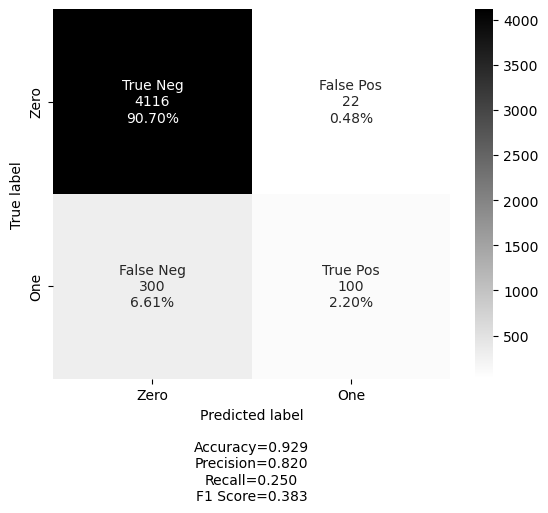

In [524]:
# Split the dataset into features (X) and target (y)
X = imputed_data[selected_features]
y = data['HOSPITAL_EXPIRE_FLAG']

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,
                                                   stratify=encoded_data['HOSPITAL_EXPIRE_FLAG'])


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)

# fitting the model

%time rf.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

## 7.2 KNN Imputer

In [560]:
data.head()

,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
0,EMERGENCY,EMERGENCY ROOM ADMIT,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,BENZODIAZEPINE OVERDOSE,0,1,3.30,F,1.1438,54.0,52.500000,51.0,12.20,12.200000,12.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.0
1,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,CATHOLIC,MARRIED,WHITE,CORONARY ARTERY BY PASS GRAFT,0,5,0.00,M,1.2641,137.5,120.516667,97.5,10.95,9.300000,7.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.0
2,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
3,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Private,PROTESTANT QUAKER,SINGLE,WHITE,INTERIOR MYOCARDIAL INFARCTION,0,2,0.00,M,0.5124,151.0,117.000000,100.0,14.60,14.516667,14.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.0
4,EMERGENCY,EMERGENCY ROOM ADMIT,Private,RELIGION_NOT_SPECIFIED,MARRIED,WHITE,ACUTE CORONARY SYNDROME,0,3,3.43,M,3.5466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0


In [561]:
X = data[selected_features].reset_index(drop=True)
y = data['HOSPITAL_EXPIRE_FLAG'].reset_index(drop=True)

In [562]:
na_percentage(X)

(                  Column Name  NA Count   NA %
 0    ADMISSIONS_DURATION_DAYS         0   0.00
 1              resp_rate_mean     37102  61.55
 2                      hr_max     37102  61.55
 3                      hr_min     37102  61.55
 4                LOS_icustays         0   0.00
 5       Glucose_Lab_VALUE_min     13292  22.05
 6                     hr_mean     37102  61.55
 7                   spO2_mean     37102  61.55
 8                         AGE      2682   4.45
 9   Hemoglobin_Lab_VALUE_mean     13292  22.05
 10              resp_rate_min     37102  61.55
 11   Hemoglobin_Lab_VALUE_max     13292  22.05
 12      Glucose_Lab_VALUE_max     13292  22.05
 13     Glucose_Lab_VALUE_mean     13292  22.05
 14                   spO2_min     37102  61.55
 15   Hemoglobin_Lab_VALUE_min     13292  22.05
 16              resp_rate_max     37102  61.55,
 ['resp_rate_mean',
  'hr_max',
  'hr_min',
  'hr_mean',
  'spO2_mean',
  'resp_rate_min',
  'spO2_min',
  'resp_rate_max'])

In [566]:
from sklearn.impute import KNNImputer

In [571]:
%%time
imputer = KNNImputer(n_neighbors=2, weights="uniform")
imputed_X = imputer.fit_transform(X)

CPU times: user 8min 34s, sys: 1min 28s, total: 10min 2s
Wall time: 5min


In [581]:
X.head(2)

,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max
0,1,NaN,NaN,NaN,1.1438,51.0,NaN,NaN,65.0,12.2,NaN,12.20,54.0,52.500000,NaN,12.2,NaN
1,5,NaN,NaN,NaN,1.2641,97.5,NaN,NaN,71.0,9.3,NaN,10.95,137.5,120.516667,NaN,7.9,NaN


In [582]:
imputed_X[0]

array([ 1.        , 15.00888889, 85.5       , 59.5       ,  1.1438    ,
       51.        , 76.24      , 95.22916667, 65.        , 12.2       ,
       11.5       , 12.2       , 54.        , 52.5       , 91.        ,
       12.2       , 21.        ])

In [584]:
imputed_X.shape

(60276, 17)

In [585]:
X.shape

(60276, 17)

In [586]:
y.shape

(60276,)

Training set shape: X=(45207, 17), y=(45207,)
Testing set shape: X=(15069, 17), y=(15069,)
CPU times: user 1.37 s, sys: 0 ns, total: 1.37 s
Wall time: 1.37 s
Accuracy: 90.38%


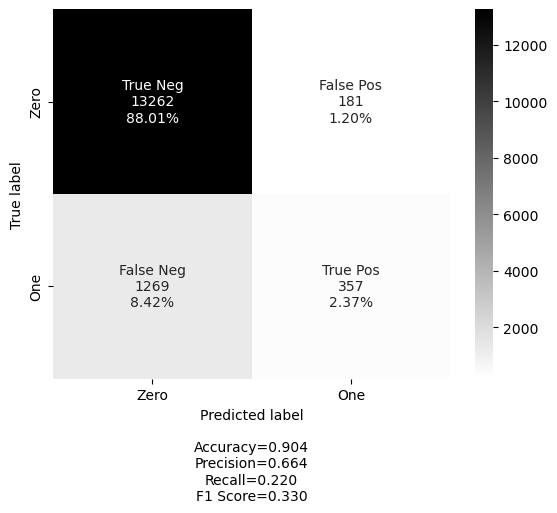

In [587]:

# Stratified split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(imputed_X, y, test_size=0.25, random_state=42)


# Print the shapes of the training and testing sets
print("Training set shape: X={}, y={}".format(X_train.shape, y_train.shape))
print("Testing set shape: X={}, y={}".format(X_test.shape, y_test.shape))

# Training the Random Forest Classification model on the training set

rf = RandomForestClassifier(n_estimators = 10, random_state = 10)

# fitting the model

%time rf.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = rf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

# 8. Unstructured Data 

In [8]:
structured_data = pd.read_csv('Cleaned_Dataset_v2.csv')

structured_data.head()

,Unnamed: 0,HADM_ID,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
0,2,124321,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
1,17,165660,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.00,M,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0
2,26,101651,EMERGENCY,EMERGENCY ROOM ADMIT,Private,NOT SPECIFIED,MARRIED,WHITE,PNEUMONIA,0,3,3.85,M,0.9252,101.0,74.000000,36.0,12.50,10.980000,9.90,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64.0
3,92,112077,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,MARRIED,WHITE,PNEUMONIA,0,4,4.15,M,1.9909,132.0,110.000000,94.0,10.40,9.066667,8.30,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0,77.0
4,118,182383,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,SEPARATED,HISPANIC OR LATINO,HYPERKALEMIA;CONGESTIVE HEART FAILURE,0,4,3.28,M,1.0806,155.0,133.937500,122.5,12.80,11.985714,11.30,67.666667,54.0,84.0,95.444444,91.0,100.0,18.962963,14.0,26.0,69.0


In [10]:
structured_data.shape

(18151, 30)

In [11]:
data_key = 'NOTEEVENTS.csv.gz'

data_location = 's3://{}/{}'.format(bucket, data_key)

%time noteevents = pd.read_csv(data_location)

CPU times: user 54.2 s, sys: 6.14 s, total: 1min
Wall time: 2min 19s


In [12]:
noteevents.shape

(2083180, 11)

In [13]:
noteevents.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,STORETIME,CATEGORY,DESCRIPTION,CGID,ISERROR,TEXT
0,174,22532,167853.0,2151-08-04,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2151-7-16**] Dischar...
1,175,13702,107527.0,2118-06-14,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2118-6-2**] Discharg...
2,176,13702,167118.0,2119-05-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2119-5-4**] D...
3,177,13702,196489.0,2124-08-18,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2124-7-21**] ...
4,178,26880,135453.0,2162-03-25,NaN,NaN,Discharge summary,Report,NaN,NaN,Admission Date: [**2162-3-3**] D...


In [14]:
data = structured_data[['HADM_ID', 'HOSPITAL_EXPIRE_FLAG']]
data.head()

,HADM_ID,HOSPITAL_EXPIRE_FLAG
0,124321,0
1,165660,0
2,101651,0
3,112077,0
4,182383,0


In [15]:
notes = noteevents[["TEXT","SUBJECT_ID","HADM_ID"]]
notes.head()

,TEXT,SUBJECT_ID,HADM_ID
0,Admission Date: [**2151-7-16**] Dischar...,22532,167853.0
1,Admission Date: [**2118-6-2**] Discharg...,13702,107527.0
2,Admission Date: [**2119-5-4**] D...,13702,167118.0
3,Admission Date: [**2124-7-21**] ...,13702,196489.0
4,Admission Date: [**2162-3-3**] D...,26880,135453.0


## 8.1 Filtering unstructured data based on hadm_id in structured data

In [16]:
# filtering only hadm_id's that are available in admissions table

hadm_id = list(data['HADM_ID'])
notes = notes[notes['HADM_ID'].isin(hadm_id)]
notes.head(10)

,TEXT,SUBJECT_ID,HADM_ID
5,Admission Date: [**2172-3-5**] D...,53181,170490.0
7,Admission Date: [**2150-2-25**] ...,42130,114236.0
8,Admission Date: [**2118-8-10**] ...,56174,163469.0
17,Admission Date: [**2194-7-18**] ...,79900,120644.0
18,Admission Date: [**2195-4-14**] ...,79900,128319.0
22,Admission Date: [**2190-2-11**] ...,99091,185274.0
23,Admission Date: [**2105-4-16**] ...,70108,186093.0
37,Admission Date: [**2174-2-12**] ...,96774,129414.0
38,Admission Date: [**2145-11-30**] ...,62745,133623.0
41,Admission Date: [**2198-7-17**] ...,98046,139402.0


In [17]:
notes.shape

(420659, 3)

In [18]:
#check for multiple texts for single hadm_id
notes.HADM_ID.value_counts().head(10)

117448.0    1233
175448.0    1084
133570.0     822
122354.0     733
192825.0     720
135028.0     716
141976.0     645
164768.0     609
174752.0     559
190949.0     462
Name: HADM_ID, dtype: int64

In [19]:
notes[notes['HADM_ID']==190949].head()

,TEXT,SUBJECT_ID,HADM_ID
31940,Admission Date: [**2156-10-23**] ...,63496,190949.0
88909,PATIENT/TEST INFORMATION:\nIndication: Cerebro...,63496,190949.0
232957,Sinus rhythm with borderline sinus tachycardia...,63496,190949.0
232958,Sinus rhythm. Diffuse non-specific ST-T wave ...,63496,190949.0
232959,Artifact is present. Sinus rhythm. The Q-T i...,63496,190949.0


## 8.2 Grouping based on HADM_ID

In [20]:
grouped_df = notes.groupby('HADM_ID')['TEXT'].agg(lambda x: ' '.join(x)).reset_index()
grouped_df.head()

,HADM_ID,TEXT
0,100003.0,Admission Date: [**2150-4-17**] ...
1,100010.0,Admission Date: [**2109-12-10**] ...
2,100012.0,Admission Date: [**2177-3-12**] ...
3,100016.0,Admission Date: [**2188-5-24**] ...
4,100018.0,Admission Date: [**2176-8-29**] ...


In [21]:
grouped_df.shape

(16971, 2)

In [23]:
data1 = data[data['HOSPITAL_EXPIRE_FLAG']==1]
expired_hadm_id = list(data1['HADM_ID'])

grouped_df['HOSPITAL_EXPIRE_FLAG'] = grouped_df['HADM_ID'].isin(expired_hadm_id).astype(int)

In [24]:
grouped_df.head(30)

,HADM_ID,TEXT,HOSPITAL_EXPIRE_FLAG
0,100003.0,Admission Date: [**2150-4-17**] ...,0
1,100010.0,Admission Date: [**2109-12-10**] ...,0
2,100012.0,Admission Date: [**2177-3-12**] ...,0
3,100016.0,Admission Date: [**2188-5-24**] ...,0
4,100018.0,Admission Date: [**2176-8-29**] ...,0
5,100020.0,Admission Date: [**2142-11-30**] ...,0
6,100024.0,Admission Date: [**2170-9-19**] ...,0
7,100028.0,Admission Date: [**2142-12-23**] ...,0
8,100034.0,Admission Date: [**2164-4-23**] ...,0
9,100037.0,Admission Date: [**2183-3-23**] ...,0


## 8.3 Saving grouped unstructured data to csv

In [25]:
grouped_df.to_csv('Unstructured_data_grouped.csv')

In [ ]:
grouped_df = pd.read_csv('Unstructured_data_grouped.csv')

## 8.4 Preprocessing Unstructured data

In [26]:
stop_words = stopwords.words('english')

stop_words = stopwords.words('english') + [
    'mg', 'reason', 'final_report', 'admitting_diagnosis', 'given', 'noted', 'comments', 'continue',
    'reason_examination', 'also', 'per', 'name_stitle', 'last_name', 'numeric_identifier', 'name_ni', 'dr_first', 'dr_last',
    'first_name', 'name_namepattern', 'admission_date', 'discharge', 'date', 'outpatient', 'namepattern_last', 'job_number',
    'admission','name','known_lastname','known_firstname','admission Date','discharge Date','addendum','confirmed','which',
    'namepattern','namepattern1','showed','most','likely','secondary','history','followed','these','service','studies',
]

In [27]:
def clean_text(text):
    # Remove new line characters
    text = re.sub(r'\n', ' ', text)
    
    # Remove dates and times
    text = re.sub(r'\[\*\*.*?\*\*\]', '', text)
    
    
    # Remove unwanted words
    unwanted_words = ['Chief Complaint:', 'Major Surgical or Invasive Procedure:', 'History of Present Illness:',
                      'Past Medical History:', 'Social History:', 'Family History:', 'Physical Exam:',
                      'Pertinent Results:',
                      'Brief Hospital Course:', 'Admission Date:', 'Discharge Date:', 
                      'Date of Birth:', 'Sex:', 'Service:', 'Abd',
                      'Allergies:', 'Attending:', 'PMH/PSH:', 'Ext:', 'NT:', 'ND:', 'CT site:', 'C/D/I:', 'c/c/e:']
    for word in unwanted_words:
        text = re.sub(word, '', text)
    
    # Remove extra spaces
    text = re.sub(r' +', ' ', text)
    
    return text.strip()

In [28]:
def strip_newline(series):
    return [review.replace('\n', '') for review in series]


def sent_to_words(sentences):
    for sentence in sentences:
        yield simple_preprocess(str(sentence), deacc=True)


def remove_stopwords(texts, stop_words):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]


def bigrams(words, bi_min=15, tri_min=10):
    bigram = gensim.models.Phrases(words, min_count=bi_min)
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    return bigram_mod


def get_corpus(df, stop_words):
    """
    Get Bigram Model, Corpus, id2word mapping
    """
    df['TEXT'] = strip_newline(df.TEXT)
    words = list(sent_to_words(df.TEXT))
    print("New line stripped")
    words = remove_stopwords(words, stop_words) # pass stop_words as a parameter
    print('Stopwords Removed')
    bigram = bigrams(words)
    bigram = [bigram[review] for review in words]
    print('Bigrams Completed')
    id2word = gensim.corpora.Dictionary(bigram)
    id2word.filter_extremes(no_below=10, no_above=0.35)
    id2word.compactify()
    corpus = [id2word.doc2bow(text) for text in bigram]
    print('Corpus Completed')
    
    processed_df = pd.DataFrame({"HADM_ID": df["HADM_ID"], 'processed_text': bigram,
                                 'HOSPITAL_EXPIRE_FLAG': df['HOSPITAL_EXPIRE_FLAG']})
    
    return corpus, id2word, processed_df

In [29]:
unstructured_data = grouped_df.copy()
unstructured_data.head()

,HADM_ID,TEXT,HOSPITAL_EXPIRE_FLAG
0,100003.0,Admission Date: [**2150-4-17**] ...,0
1,100010.0,Admission Date: [**2109-12-10**] ...,0
2,100012.0,Admission Date: [**2177-3-12**] ...,0
3,100016.0,Admission Date: [**2188-5-24**] ...,0
4,100018.0,Admission Date: [**2176-8-29**] ...,0


In [30]:
# Cleaning all the texts

%time unstructured_data['TEXT'] = unstructured_data['TEXT'].apply(clean_text)

CPU times: user 1min 8s, sys: 830 ms, total: 1min 9s
Wall time: 1min 9s


In [31]:
df = unstructured_data.copy()

In [32]:
%%time 

# generating corpus and processed dataframe

corpus, id2word, processed_df = get_corpus(df, stop_words)

New line stripped
Stopwords Removed
Bigrams Completed
Corpus Completed
CPU times: user 16min 9s, sys: 8.01 s, total: 16min 17s
Wall time: 16min 17s


In [33]:
processed_df.head()

,HADM_ID,processed_text,HOSPITAL_EXPIRE_FLAG
0,100003.0,"[medicine, patient, recorded_known, allergies_...",0
1,100010.0,"[urology, penicillins, gross_hematuria, pound_...",0
2,100012.0,"[cardiothoracic_shellfish, exertional_angina, ...",0
3,100016.0,"[medicine, ampicillin, thorazine, respiratory,...",0
4,100018.0,"[medicine_penicillins, keflex, upper_extremity...",0


## 8.5 Word2Vec

In [34]:
tokenized_text = processed_df['processed_text']

In [35]:
from gensim.models import Word2Vec

%time model = Word2Vec(tokenized_text, vector_size=100, window=5, min_count=5, workers=8)

CPU times: user 11min 45s, sys: 2.19 s, total: 11min 48s
Wall time: 1min 53s


In [36]:
def embeddings(processed_df, model):
    embeddings = []
    for tokens in tokenized_text:
        token_embeddings = []
        for token in tokens:
            if token in model.wv.key_to_index:
                token_embeddings.append(model.wv[token])
        if len(token_embeddings) > 0:
            embeddings.append(np.mean(token_embeddings, axis=0))
        else:
            embeddings.append(np.zeros(model.vector_size))
    
    # Add new columns to processed_df for each embedding feature
    for i in range(model.vector_size):
        col_name = 'embedding_{}'.format(i+1)
        processed_df[col_name] = [embedding[i] for embedding in embeddings]
    
    return processed_df

In [37]:
%time embeddings_df = embeddings(processed_df, model)

CPU times: user 2min 12s, sys: 46.3 ms, total: 2min 12s
Wall time: 2min 12s


In [38]:
embeddings_df.head(20)

,HADM_ID,processed_text,HOSPITAL_EXPIRE_FLAG,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100
0,100003.0,"[medicine, patient, recorded_known, allergies_...",0,-0.449535,-0.214965,0.340791,-0.282814,-0.301238,-0.017811,0.141907,0.660942,0.702251,-0.031225,-0.261309,0.104584,-0.211891,0.051183,-0.356462,-0.182661,-0.124017,0.543945,-0.271150,-0.153129,0.044900,-0.247964,0.805472,0.331339,-0.375521,0.556855,-0.025527,0.723760,-0.416245,0.172189,0.177598,0.402311,-0.504308,-0.031847,-0.019013,-0.938135,0.161725,-0.693478,-0.146987,0.055571,-0.580697,0.529243,0.401604,-0.747263,-0.434112,0.108047,0.214158,-0.163861,0.240023,-0.248900,-0.016455,0.373079,0.262377,0.144832,-0.152806,-0.489300,0.126550,-0.703916,0.422654,0.120453,0.164024,-0.409037,-0.104368,-0.239338,-0.239439,-0.924967,-0.131043,0.191402,-0.015179,0.092081,0.532159,0.597626,0.633870,-0.272042,0.548357,0.385889,0.229613,0.086489,-0.056308,-0.236793,-0.905650,0.123679,0.022972,0.853098,-0.562740,-0.468448,0.122408,-0.477204,-0.571756,0.141066,0.136789,-0.043895,-0.065252,-0.324107,0.294433,0.344982,0.271265,-0.382433,-0.177981,0.051511
1,100010.0,"[urology, penicillins, gross_hematuria, pound_...",0,-0.612006,-0.121414,-0.093115,-0.138146,-0.232053,0.249207,-0.001945,-0.085576,0.576389,-0.680866,-0.196635,0.197814,0.266207,0.256381,0.047389,-0.107916,-0.480725,-0.268346,-0.846248,-0.052235,-0.550833,-0.631467,0.499723,0.143142,-0.203651,0.766726,0.273604,0.294477,-0.013164,-0.433227,0.329196,0.406364,-0.754737,0.338006,-0.646849,-0.753850,-0.247096,-0.403151,0.008577,-0.352983,0.143257,0.461861,0.105815,-0.494180,0.666153,-0.025253,0.707393,0.788122,-0.947600,-0.370697,-0.142957,0.379551,0.579252,-0.315194,-0.185648,0.306208,0.393664,-0.011239,0.227068,0.775765,0.158679,0.231319,0.271970,0.180439,0.748520,-0.105628,0.812753,0.037913,0.333894,0.117616,0.526648,0.245238,-0.025038,0.717172,0.372344,0.114915,0.325047,-0.046600,-0.639612,0.913498,-0.469444,0.886130,-0.196693,0.367695,-0.106179,-0.463415,1.503673,0.946555,-0.923652,-0.556679,0.661385,0.026033,-0.757250,-0.252607,0.259151,0.171132,0.514288,-0.584083,-0.006363,0.561534
2,100012.0,"[cardiothoracic_shellfish, exertional_angina, ...",0,-0.326785,0.034090,-0.522780,0.121285,-0.870555,-0.264440,-0.264838,0.125038,0.048514,-0.385392,0.182777,-0.457397,-0.176131,-0.729269,0.519084,-0.331617,-0.769578,-0.089508,0.413082,0.202329,-0.393697,0.135785,0.379390,0.781406,-0.516097,-0.377674,0.684245,0.772999,0.117207,-0.372729,-0.222557,-1.677023,-0.091777,0.413463,-0.325411,-0.273181,-0.379701,-0.378929,-0.655162,0.473241,0.056208,-0.039021,-0.377448,0.274636,0.786768,-0.207114,1.420063,-0.030848,-0.286943,-0.526123,0.438340,0.178982,0.802723,0.362010,-0.384593,0.590518,0.358744,1.212081,-0.474527,-0.582

In [39]:
word_freq = model.wv.key_to_index
top_words = sorted(word_freq, key=word_freq.get, reverse=True)[:10]
print(top_words)

for word in top_words:
    print(word, word_freq[word])

['systmeic', 'enterrococcus', 'mascerated', 'reception', 'admite', 'undetecable', 'appetie', 'oxybuynin', 'svicu', 'acident']
systmeic 96353
enterrococcus 96352
mascerated 96351
reception 96350
admite 96349
undetecable 96348
appetie 96347
oxybuynin 96346
svicu 96345
acident 96344


## 8.6 Model Building - Unstructured Data

In [40]:
X = embeddings_df.drop(["HOSPITAL_EXPIRE_FLAG", "HADM_ID", "processed_text"], axis=1)
y = embeddings_df["HOSPITAL_EXPIRE_FLAG"]

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42,
                                                    stratify=embeddings_df['HOSPITAL_EXPIRE_FLAG'])
print(len(X_train), len(y_train))
print(len(X_test), len(y_test))

12728 12728
4243 4243


In [42]:
# import the logistic regression model
from sklearn.linear_model import LogisticRegression 

# instantiate a logistic regression model
logreg = LogisticRegression(class_weight= "balanced")

# fit the model with training data
logreg.fit(X_train, y_train)

# Make predictions on test data
y_pred_class = logreg.predict(X_test)

# evaluate the performance of the model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_class))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96      3919
           1       0.51      0.94      0.66       324

    accuracy                           0.93      4243
   macro avg       0.75      0.93      0.81      4243
weighted avg       0.96      0.93      0.94      4243



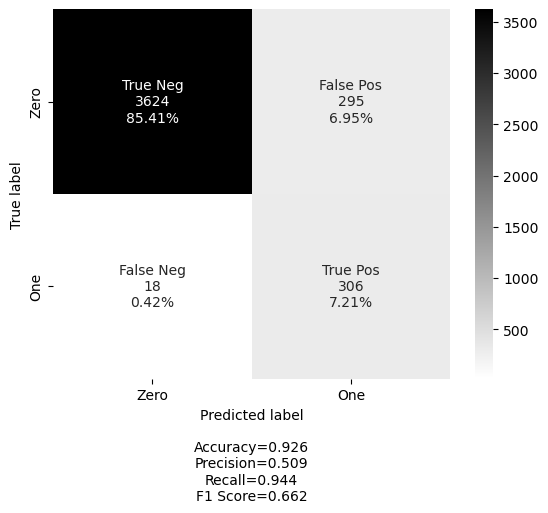

In [43]:
cm = confusion_matrix(y_test, y_pred_class)

labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['Zero', 'One']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='binary')

ROC AUC Score = 0.9345850699


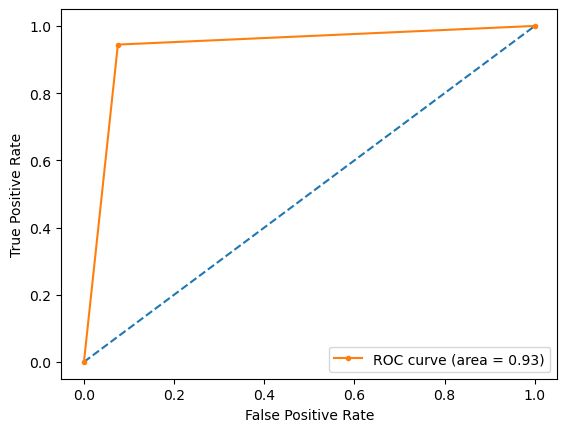

In [44]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred_class)
roc_auc = auc(fpr, tpr)
# Print new ROC AUC score
print('ROC AUC Score = %.10f' % roc_auc)

plt.plot([0,1], [0,1], linestyle='--')
plt.plot(fpr, tpr, marker='.', label='ROC curve (area = %0.2f)' % roc_auc)
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
# show the plot
plt.show()

### 8.6.1 Other Models

In [45]:
random_seed = 9

class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed, 
                                                                 n_jobs=8)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }

In [46]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 2min 26s, sys: 1.6 s, total: 2min 28s
Wall time: 1min 39s


In [47]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
logistic,0.969,0.967,0.710,0.722,0.980,0.772,0.757
mlp,0.967,0.965,0.728,0.725,0.975,0.759,0.741
gradient_boosting,0.980,0.954,0.760,0.546,0.961,0.644,0.631
random_forest,0.979,0.942,1.000,0.630,0.946,0.624,0.592
knn,0.952,0.941,0.429,0.309,0.869,0.443,0.470
naive_bayes,0.806,0.801,0.703,0.738,0.856,0.362,0.341
decision_tree,0.958,0.926,0.611,0.410,0.824,0.457,0.421
ridge,0.905,0.899,0.955,0.944,nan,0.589,0.596


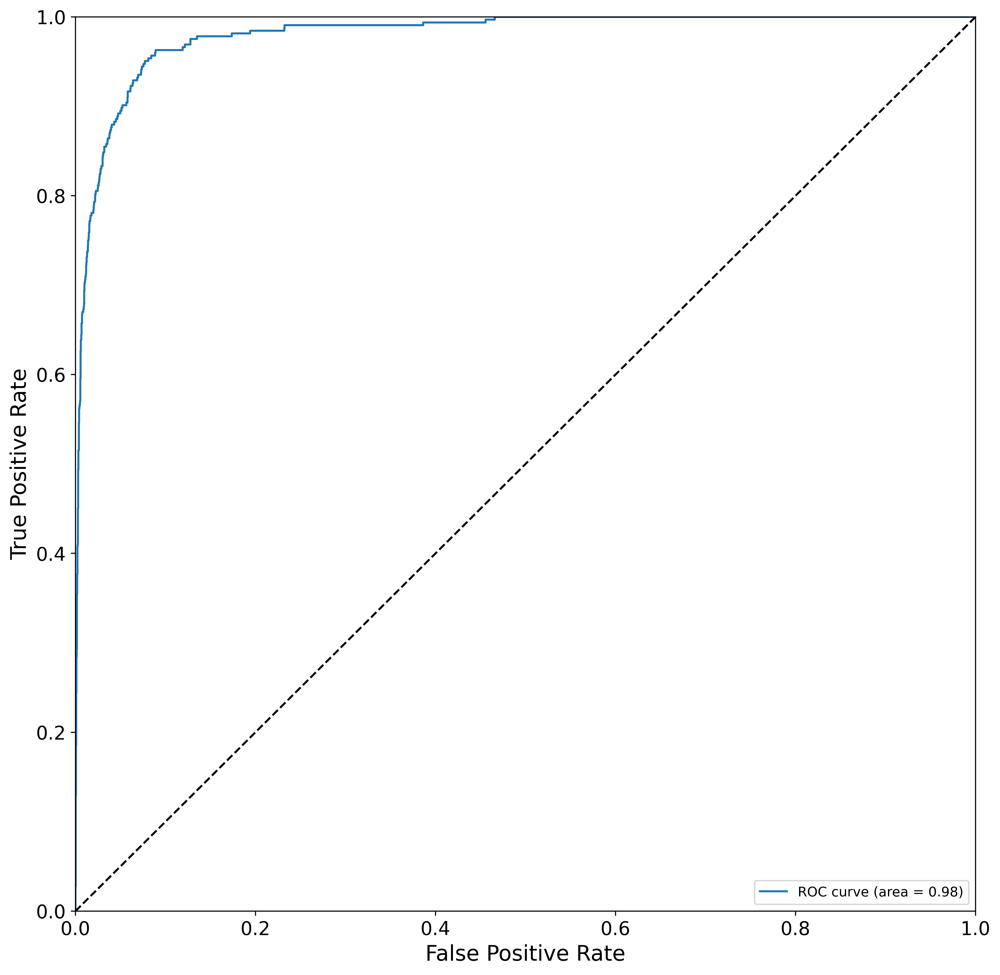

In [48]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['logistic']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['logistic']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

### 8.6.2 Saving Unstructured model

In [158]:
unstructured_logistic_model = class_models['logistic']['fitted']

# Save the model as a pickle in a file
joblib.dump(unstructured_logistic_model, 'unstructured_logistic_model.pkl')

['unstructured_logistic_model.pkl']

# 9. Fusion Model

In [49]:
structured_data.head()

,Unnamed: 0,HADM_ID,ADMISSION_TYPE,ADMISSION_LOCATION,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,ADMISSIONS_DURATION_DAYS,ADMISSIONS_ED_DURATION_HOURS,GENDER,LOS_icustays,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,Glucose_Lab_VALUE_min,Hemoglobin_Lab_VALUE_max,Hemoglobin_Lab_VALUE_mean,Hemoglobin_Lab_VALUE_min,hr_mean,hr_min,hr_max,spO2_mean,spO2_min,spO2_max,resp_rate_mean,resp_rate_min,resp_rate_max,AGE
0,2,124321,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,Medicare,CATHOLIC,MARRIED,WHITE,BRAIN MASS,0,6,0.00,M,1.1862,154.0,133.437500,118.0,13.95,13.243750,12.15,76.694444,59.0,115.0,98.114286,95.0,100.0,17.114286,11.0,23.0,75.0
1,17,165660,ELECTIVE,PHYS REFERRAL/NORMAL DELI,Medicare,NOT SPECIFIED,MARRIED,WHITE,VENTRAL HERNIA/SDA,0,10,0.00,M,4.3483,126.0,111.636364,85.0,14.50,12.222222,10.90,85.586538,67.0,105.0,93.711340,90.0,98.0,18.798077,10.0,28.0,73.0
2,26,101651,EMERGENCY,EMERGENCY ROOM ADMIT,Private,NOT SPECIFIED,MARRIED,WHITE,PNEUMONIA,0,3,3.85,M,0.9252,101.0,74.000000,36.0,12.50,10.980000,9.90,92.590909,76.0,105.0,96.250000,90.0,99.0,23.045455,14.0,30.0,64.0
3,92,112077,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,MARRIED,WHITE,PNEUMONIA,0,4,4.15,M,1.9909,132.0,110.000000,94.0,10.40,9.066667,8.30,106.276596,79.0,136.0,97.170213,90.0,100.0,26.684211,20.0,33.0,77.0
4,118,182383,EMERGENCY,CLINIC REFERRAL/PREMATURE,Medicare,CATHOLIC,SEPARATED,HISPANIC OR LATINO,HYPERKALEMIA;CONGESTIVE HEART FAILURE,0,4,3.28,M,1.0806,155.0,133.937500,122.5,12.80,11.985714,11.30,67.666667,54.0,84.0,95.444444,91.0,100.0,18.962963,14.0,26.0,69.0


In [54]:
structured_data.shape

(18151, 30)

In [52]:
selected_features = ['HADM_ID','ADMISSIONS_DURATION_DAYS',
 'resp_rate_mean',
 'hr_max',
 'hr_min',
 'LOS_icustays',
 'Glucose_Lab_VALUE_min',
 'hr_mean',
 'spO2_mean',
 'AGE',
 'Hemoglobin_Lab_VALUE_mean',
 'resp_rate_min',
 'Hemoglobin_Lab_VALUE_max',
 'Glucose_Lab_VALUE_max',
 'Glucose_Lab_VALUE_mean',
 'spO2_min',
 'Hemoglobin_Lab_VALUE_min',
 'resp_rate_max']

In [53]:
structured_data[selected_features].head()

,HADM_ID,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max
0,124321,6,17.114286,115.0,59.0,1.1862,118.0,76.694444,98.114286,75.0,13.243750,11.0,13.95,154.0,133.437500,95.0,12.15,23.0
1,165660,10,18.798077,105.0,67.0,4.3483,85.0,85.586538,93.711340,73.0,12.222222,10.0,14.50,126.0,111.636364,90.0,10.90,28.0
2,101651,3,23.045455,105.0,76.0,0.9252,36.0,92.590909,96.250000,64.0,10.980000,14.0,12.50,101.0,74.000000,90.0,9.90,30.0
3,112077,4,26.684211,136.0,79.0,1.9909,94.0,106.276596,97.170213,77.0,9.066667,20.0,10.40,132.0,110.000000,90.0,8.30,33.0
4,182383,4,18.962963,84.0,54.0,1.0806,122.5,67.666667,95.444444,69.0,11.985714,14.0,12.80,155.0,133.937500,91.0,11.30,26.0


In [55]:
embeddings_df.head()

,HADM_ID,processed_text,HOSPITAL_EXPIRE_FLAG,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100
0,100003.0,"[medicine, patient, recorded_known, allergies_...",0,-0.449535,-0.214965,0.340791,-0.282814,-0.301238,-0.017811,0.141907,0.660942,0.702251,-0.031225,-0.261309,0.104584,-0.211891,0.051183,-0.356462,-0.182661,-0.124017,0.543945,-0.271150,-0.153129,0.044900,-0.247964,0.805472,0.331339,-0.375521,0.556855,-0.025527,0.723760,-0.416245,0.172189,0.177598,0.402311,-0.504308,-0.031847,-0.019013,-0.938135,0.161725,-0.693478,-0.146987,0.055571,-0.580697,0.529243,0.401604,-0.747263,-0.434112,0.108047,0.214158,-0.163861,0.240023,-0.248900,-0.016455,0.373079,0.262377,0.144832,-0.152806,-0.489300,0.126550,-0.703916,0.422654,0.120453,0.164024,-0.409037,-0.104368,-0.239338,-0.239439,-0.924967,-0.131043,0.191402,-0.015179,0.092081,0.532159,0.597626,0.633870,-0.272042,0.548357,0.385889,0.229613,0.086489,-0.056308,-0.236793,-0.905650,0.123679,0.022972,0.853098,-0.562740,-0.468448,0.122408,-0.477204,-0.571756,0.141066,0.136789,-0.043895,-0.065252,-0.324107,0.294433,0.344982,0.271265,-0.382433,-0.177981,0.051511
1,100010.0,"[urology, penicillins, gross_hematuria, pound_...",0,-0.612006,-0.121414,-0.093115,-0.138146,-0.232053,0.249207,-0.001945,-0.085576,0.576389,-0.680866,-0.196635,0.197814,0.266207,0.256381,0.047389,-0.107916,-0.480725,-0.268346,-0.846248,-0.052235,-0.550833,-0.631467,0.499723,0.143142,-0.203651,0.766726,0.273604,0.294477,-0.013164,-0.433227,0.329196,0.406364,-0.754737,0.338006,-0.646849,-0.753850,-0.247096,-0.403151,0.008577,-0.352983,0.143257,0.461861,0.105815,-0.494180,0.666153,-0.025253,0.707393,0.788122,-0.947600,-0.370697,-0.142957,0.379551,0.579252,-0.315194,-0.185648,0.306208,0.393664,-0.011239,0.227068,0.775765,0.158679,0.231319,0.271970,0.180439,0.748520,-0.105628,0.812753,0.037913,0.333894,0.117616,0.526648,0.245238,-0.025038,0.717172,0.372344,0.114915,0.325047,-0.046600,-0.639612,0.913498,-0.469444,0.886130,-0.196693,0.367695,-0.106179,-0.463415,1.503673,0.946555,-0.923652,-0.556679,0.661385,0.026033,-0.757250,-0.252607,0.259151,0.171132,0.514288,-0.584083,-0.006363,0.561534
2,100012.0,"[cardiothoracic_shellfish, exertional_angina, ...",0,-0.326785,0.034090,-0.522780,0.121285,-0.870555,-0.264440,-0.264838,0.125038,0.048514,-0.385392,0.182777,-0.457397,-0.176131,-0.729269,0.519084,-0.331617,-0.769578,-0.089508,0.413082,0.202329,-0.393697,0.135785,0.379390,0.781406,-0.516097,-0.377674,0.684245,0.772999,0.117207,-0.372729,-0.222557,-1.677023,-0.091777,0.413463,-0.325411,-0.273181,-0.379701,-0.378929,-0.655162,0.473241,0.056208,-0.039021,-0.377448,0.274636,0.786768,-0.207114,1.420063,-0.030848,-0.286943,-0.526123,0.438340,0.178982,0.802723,0.362010,-0.384593,0.590518,0.358744,1.212081,-0.474527,-0.582

In [56]:
embeddings_df.shape

(16971, 103)

## 9.1 Merging Structured and Unstructured Data

In [ ]:
merged_df = pd.merge(df1, df2, on='HADM_ID')


In [57]:
fused_data = pd.merge(structured_data[selected_features], embeddings_df, on = 'HADM_ID', how='inner')

In [58]:
fused_data.head()

,HADM_ID,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max,processed_text,HOSPITAL_EXPIRE_FLAG,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100
0,124321,6,17.114286,115.0,59.0,1.1862,118.0,76.694444,98.114286,75.0,13.243750,11.0,13.95,154.0,133.437500,95.0,12.15,23.0,"[neurosurgery, morphine, seizures, left, crani...",0,0.380156,-0.150646,0.564568,-0.195437,0.062985,-0.093582,0.234458,0.266085,0.740283,-0.531899,0.011052,-0.342926,-0.002042,0.160409,0.181008,-0.191306,-0.493932,0.059995,-0.122049,-0.290312,-0.267473,-0.220754,0.200421,0.561875,-0.322538,0.278825,0.096455,0.030327,-0.464379,-0.208461,-0.220907,0.342073,-0.562344,0.413512,-0.181357,-0.499394,0.103652,-0.499462,-0.093863,0.487909,0.455556,0.176329,0.159548,-0.330719,0.215084,0.046151,0.697165,0.598384,-0.431432,-0.392285,0.430294,0.305684,0.349694,-0.071691,-0.065436,0.458886,0.096442,-0.068917,0.187678,0.374732,0.211460,0.126549,0.174904,0.376541,0.690991,0.238397,0.019855,-0.169602,0.283207,-0.337715,0.220787,0.199580,-0.271165,0.437227,0.569579,0.022522,-0.088934,0.246346,-0.355817,0.353522,-0.187389,0.561691,-0.179630,0.168115,-0.182630,0.133787,0.653315,0.690334,-0.320407,-0.300992,0.364155,-0.032459,-0.689644,-0.103570,0.466247,0.026204,0.510710,-0.479358,-0.397568,-0.031582
1,165660,10,18.798077,105.0,67.0,4.3483,85.0,85.586538,93.711340,73.0,12.222222,10.0,14.50,126.0,111.636364,90.0,10.90,28.0,"[plastic, patient, recorded_known, allergies_d...",0,-0.654098,-0.408150,-0.635483,0.128173,-0.668891,-0.176805,-0.373800,0.270332,0.260322,-0.558935,0.176724,-0.209012,0.130816,-0.291509,0.125487,-0.116786,-0.791344,0.005160,-0.309767,0.156878,-0.947711,-0.280924,0.537607,0.605013,-0.002352,0.105675,0.822743,0.280073,-0.270607,-0.125235,-0.064621,-0.295922,0.042881,0.773339,-0.389916,-0.242261,-0.559145,-0.653110,0.108961,-0.038634,0.161321,0.357777,-0.034504,-0.235880,0.396436,-0.129717,1.206746,0.410083,-0.285136,-0.757160,0.046684,0.539661,0.433035,0.581174,-0.128378,0.385415,0.605654,0.635860,-0.028078,-0.078923,0.496430,0.143160,0.007018,-0.128439,0.798538,0.537163,0.832053,0.387767,0.598439,-0.614835,0.155365,0.335396,-0.207358,0.498359,-0.125654,0.206956,-0.800243,-0.132062,-0.000859,0.336472,-0.196623,0.661845,0.017337,-0.053715,-0.158737,-0.508359,0.444869,0.684279,-0.343707,-0.581258,0.469584,0.093588,-0.960425,-0.231357,0.889347,-0.164134,0.531074,-0.743453,-0.127388,-0.143867
2,101651,3,23.045455,105.0,76.0,0.9252,36.0,92.590909,96.250000,64.0,10.980000,14.0,12.50,101.0,74.000000,90.0,9.90,30.0,"[medicine, patient, re

In [164]:
fused_data.to_csv('fused_data.csv')

In [59]:
fused_data.shape

(18027, 120)

## 9.2 Model Building - Fusion

In [74]:
X = fused_data.drop(["HOSPITAL_EXPIRE_FLAG", "HADM_ID", "processed_text"], axis=1)
y = fused_data["HOSPITAL_EXPIRE_FLAG"]

In [75]:
X.head()

,ADMISSIONS_DURATION_DAYS,resp_rate_mean,hr_max,hr_min,LOS_icustays,Glucose_Lab_VALUE_min,hr_mean,spO2_mean,AGE,Hemoglobin_Lab_VALUE_mean,resp_rate_min,Hemoglobin_Lab_VALUE_max,Glucose_Lab_VALUE_max,Glucose_Lab_VALUE_mean,spO2_min,Hemoglobin_Lab_VALUE_min,resp_rate_max,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100
0,6,17.114286,115.0,59.0,1.1862,118.0,76.694444,98.114286,75.0,13.243750,11.0,13.95,154.0,133.437500,95.0,12.15,23.0,0.380156,-0.150646,0.564568,-0.195437,0.062985,-0.093582,0.234458,0.266085,0.740283,-0.531899,0.011052,-0.342926,-0.002042,0.160409,0.181008,-0.191306,-0.493932,0.059995,-0.122049,-0.290312,-0.267473,-0.220754,0.200421,0.561875,-0.322538,0.278825,0.096455,0.030327,-0.464379,-0.208461,-0.220907,0.342073,-0.562344,0.413512,-0.181357,-0.499394,0.103652,-0.499462,-0.093863,0.487909,0.455556,0.176329,0.159548,-0.330719,0.215084,0.046151,0.697165,0.598384,-0.431432,-0.392285,0.430294,0.305684,0.349694,-0.071691,-0.065436,0.458886,0.096442,-0.068917,0.187678,0.374732,0.211460,0.126549,0.174904,0.376541,0.690991,0.238397,0.019855,-0.169602,0.283207,-0.337715,0.220787,0.199580,-0.271165,0.437227,0.569579,0.022522,-0.088934,0.246346,-0.355817,0.353522,-0.187389,0.561691,-0.179630,0.168115,-0.182630,0.133787,0.653315,0.690334,-0.320407,-0.300992,0.364155,-0.032459,-0.689644,-0.103570,0.466247,0.026204,0.510710,-0.479358,-0.397568,-0.031582
1,10,18.798077,105.0,67.0,4.3483,85.0,85.586538,93.711340,73.0,12.222222,10.0,14.50,126.0,111.636364,90.0,10.90,28.0,-0.654098,-0.408150,-0.635483,0.128173,-0.668891,-0.176805,-0.373800,0.270332,0.260322,-0.558935,0.176724,-0.209012,0.130816,-0.291509,0.125487,-0.116786,-0.791344,0.005160,-0.309767,0.156878,-0.947711,-0.280924,0.537607,0.605013,-0.002352,0.105675,0.822743,0.280073,-0.270607,-0.125235,-0.064621,-0.295922,0.042881,0.773339,-0.389916,-0.242261,-0.559145,-0.653110,0.108961,-0.038634,0.161321,0.357777,-0.034504,-0.235880,0.396436,-0.129717,1.206746,0.410083,-0.285136,-0.757160,0.046684,0.539661,0.433035,0.581174,-0.128378,0.385415,0.605654,0.635860,-0.028078,-0.078923,0.496430,0.143160,0.007018,-0.128439,0.798538,0.537163,0.832053,0.387767,0.598439,-0.614835,0.155365,0.335396,-0.207358,0.498359,-0.125654,0.206956,-0.800243,-0.132062,-0.000859,0.336472,-0.196623,0.661845,0.017337,-0.053715,-0.158737,-0.508359,0.444869,0.684279,-0.343707,-0.581258,0.469584,0.093588,-0.960425,-0.231357,0.889347,-0.164134,0.531074,-0.743453,-0.127388,-0.143867
2,3,23.045455,105.0,76.0,0.9252,36.0,92.590909,96.250000,64.0,10.980000,14.0,12.50,101.0,74.000000,90.0,9.90,30.0,-0.142056,-0.458018,0.387650,0.032214,-0.127169,-0.004614,0.149321,0.454018,0.526529,-0.582931,-0.157652,0.137754,-0.417593,0.461639,-0.201146,0.249372,-0.205424,0.076280,-0.175369,-0.157779,-0.20

In [77]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42,
                                                    stratify=fused_data['HOSPITAL_EXPIRE_FLAG'])
print(len(X_train), len(y_train))
print(len(X_test), len(y_test))

13520 13520
4507 4507


In [78]:
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed, 
                                                                 n_jobs=8)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }

In [79]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 2min 48s, sys: 3.16 s, total: 2min 51s
Wall time: 1min 53s


In [80]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
gradient_boosting,0.982,0.964,0.813,0.642,0.979,0.744,0.736
mlp,0.966,0.965,0.733,0.720,0.976,0.772,0.755
random_forest,0.980,0.947,1.000,0.663,0.956,0.671,0.642
logistic,0.937,0.936,0.359,0.358,0.906,0.480,0.482
naive_bayes,0.811,0.815,0.732,0.685,0.863,0.379,0.342
decision_tree,0.956,0.933,0.579,0.456,0.828,0.526,0.498
knn,0.928,0.921,0.164,0.108,0.760,0.183,0.230
ridge,0.905,0.913,0.964,0.949,nan,0.644,0.643


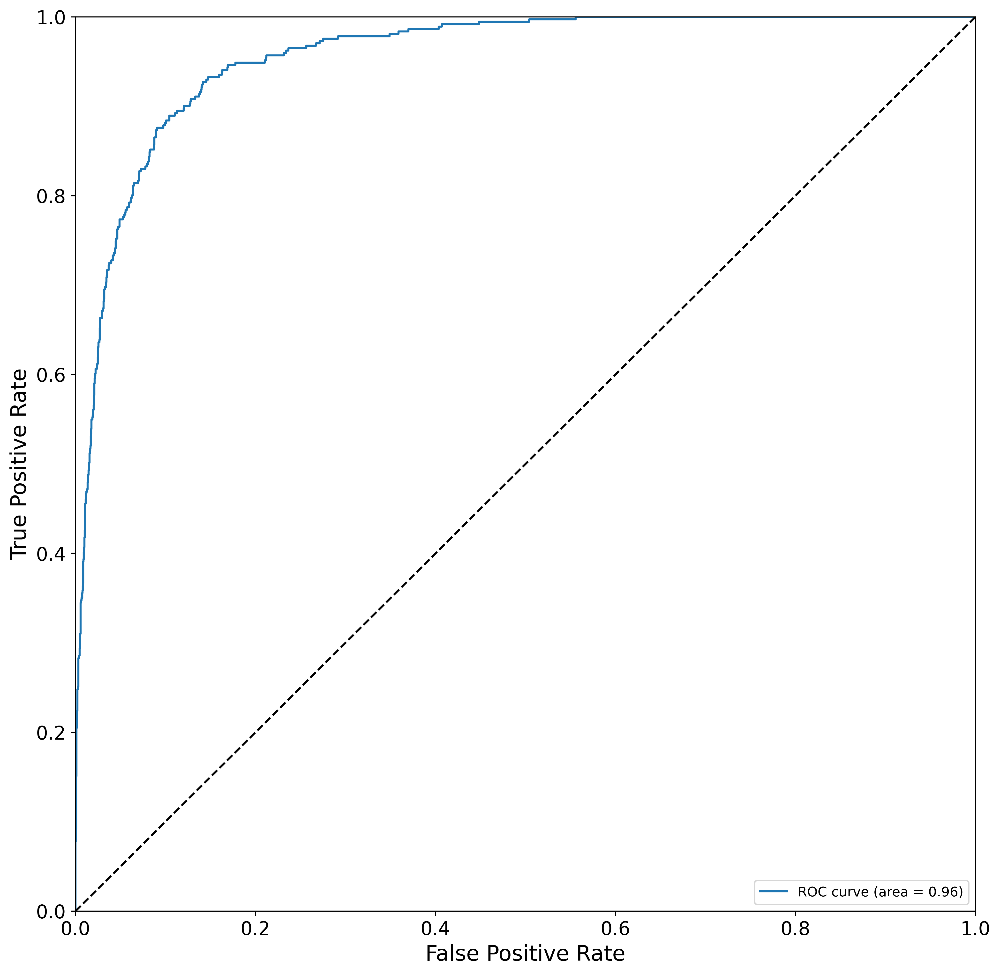

In [83]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['random_forest']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['random_forest']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

In [84]:
importances = class_models['random_forest']['fitted'].feature_importances_
importances

array([0.01055581, 0.00990597, 0.01823535, 0.00539208, 0.00441265,
       0.00372836, 0.00527803, 0.00404012, 0.01397301, 0.00375835,
       0.00258849, 0.00533408, 0.00357492, 0.00428409, 0.01518573,
       0.00344467, 0.00891173, 0.0036352 , 0.0034341 , 0.00549674,
       0.00598777, 0.00942928, 0.00388041, 0.00307397, 0.0142322 ,
       0.00613462, 0.00394547, 0.00423273, 0.00492311, 0.00329796,
       0.00321237, 0.00600441, 0.00253319, 0.00346053, 0.00334713,
       0.00349953, 0.02618977, 0.00334028, 0.00445708, 0.02316485,
       0.00399022, 0.01539262, 0.00287873, 0.01646612, 0.00483224,
       0.01360051, 0.00812295, 0.00469899, 0.00209636, 0.00362352,
       0.00598157, 0.05012247, 0.00370139, 0.00990303, 0.02049655,
       0.03821547, 0.01883142, 0.00253378, 0.00369676, 0.00291452,
       0.00285528, 0.03345033, 0.00296671, 0.00307042, 0.00292795,
       0.01512905, 0.00606771, 0.00295982, 0.00595066, 0.00321809,
       0.03910109, 0.00360701, 0.00392136, 0.00556629, 0.00397

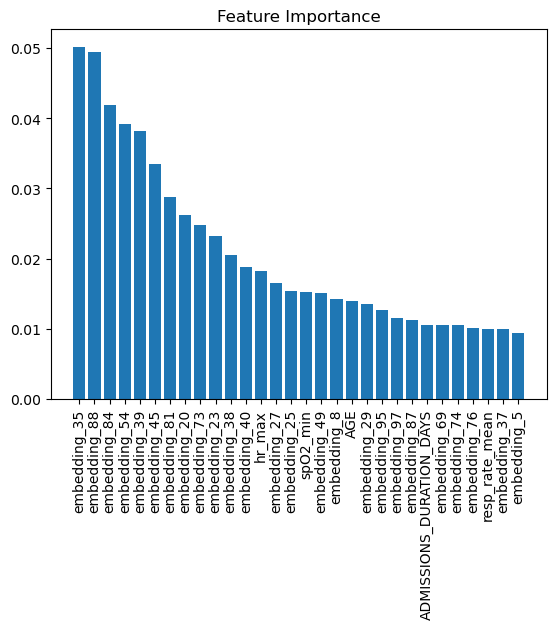

In [94]:
# Get feature importances
importances = class_models['random_forest']['fitted'].feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X_train.columns[i] for i in indices]

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(0,30), importances[indices[:30]])

# Add feature names as x-axis labels
plt.xticks(range(0,30), names[:30], rotation=90)

# Show plot
plt.show()

## 9.3 Saving Fusion Model

In [100]:
fusion_gradient_boosting_model = class_models['gradient_boosting']['fitted']

# Save the model as a pickle in a file
joblib.dump(fusion_gradient_boosting_model, 'fusion_gradient_boosting_model.pkl')

In [105]:
# Load the model from the file
model_from_joblib = joblib.load('fusion_gradient_boosting_model.pkl')

## 10. Dealing with class imbalance

In [17]:
random_seed = 9

In [11]:
data = pd.read_csv('fused_data.csv')

In [13]:
fused_data = data.copy()

In [71]:
X = fused_data.drop(["HOSPITAL_EXPIRE_FLAG", "HADM_ID", "processed_text"], axis=1)
y = fused_data["HOSPITAL_EXPIRE_FLAG"]

In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42,
                                                    stratify=fused_data['HOSPITAL_EXPIRE_FLAG'])
print(len(X_train), len(y_train))
print(len(X_test), len(y_test))

13520 13520
4507 4507


In [18]:
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed, 
                                                                 n_jobs=8)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }



In [19]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 2min 35s, sys: 1.6 s, total: 2min 37s
Wall time: 1min 56s


In [20]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
mlp,0.976,0.968,0.802,0.755,0.982,0.797,0.781
gradient_boosting,0.984,0.964,0.832,0.639,0.979,0.748,0.742
random_forest,0.979,0.947,1.000,0.671,0.956,0.675,0.646
naive_bayes,0.808,0.810,0.733,0.695,0.863,0.376,0.341
decision_tree,0.956,0.934,0.579,0.456,0.827,0.531,0.505
logistic,0.920,0.922,0.048,0.081,0.789,0.146,0.226
knn,0.921,0.915,0.060,0.008,0.618,0.016,0.023
ridge,0.906,0.912,0.965,0.946,nan,0.640,0.640


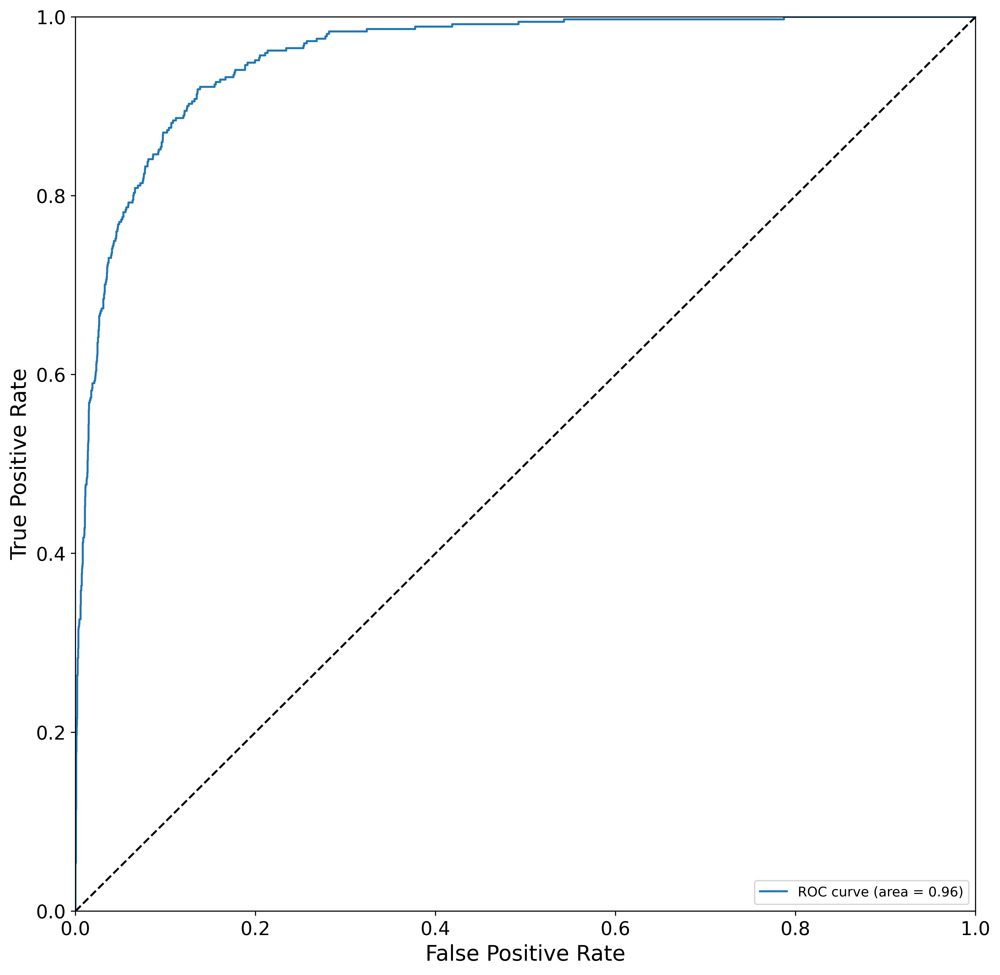

In [21]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['random_forest']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['random_forest']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

## 10.1 Youden's J approach - Threshold Optimization

In [25]:
from sklearn.metrics import roc_curve, auc

y_pred_class = class_models['random_forest']['probs']

# Assuming 'y_test' and 'y_pred_prob' are the true labels and predicted probabilities of the test data
fpr, tpr, thresholds = roc_curve(y_test, y_pred_class)
roc_auc = auc(fpr, tpr)

# calculate Youden's J statistic for each threshold
youden_j = tpr - fpr

# locate the index of the largest Youden's J statistic
ix = np.argmax(youden_j)
best_threshold = thresholds[ix]

# Update predicted class probabilities based on chosen threshold
y_pred_new = (y_pred_class >= best_threshold).astype(int)

# Compute new false positive rate (FPR) and true positive rate (TPR)
fpr_new, tpr_new, _ = roc_curve(y_test, y_pred_new)

# Compute new AUC score
roc_auc_new = auc(fpr_new, tpr_new)

# Print new threshold and ROC AUC score
print('Best Threshold=%f, New ROC AUC Score = %.10f' % (best_threshold, roc_auc_new))


Best Threshold=0.236944, New ROC AUC Score = 0.8916466161


In [30]:
print("Largest Youden\'s J Statistic = %f" %(ix))

Largest Youden's J Statistic = 306.000000


# 10.2 G-mean - Threshold Optimization

In [26]:
y_pred_class = class_models['random_forest']['probs']

# Assuming 'y_test' and 'y_pred_prob' are the true labels and predicted probabilities of the test data
fpr, tpr, thresholds = roc_curve(y_test, y_pred_class)
roc_auc = auc(fpr, tpr)

# calculate the g-mean for each threshold
gmeans = []
for i in range(len(tpr)):
    gmeans.append(np.sqrt(tpr[i] * (1 - fpr[i])))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

Best Threshold=0.242897, G-Mean=0.891


In [27]:
# Update predicted class probabilities based on chosen threshold
y_pred_new = (y_pred_class >= thresholds[ix]).astype(int)

# Compute new false positive rate (FPR) and true positive rate (TPR)
fpr_new, tpr_new, _ = roc_curve(y_test, y_pred_new)

# Compute new AUC score
roc_auc_new = auc(fpr_new, tpr_new)

# Print new ROC AUC score
print('New ROC AUC Score = %.10f' % roc_auc_new)

New ROC AUC Score = 0.8916286945


## 10.3 SMOTE - Over Sampling

SMOTE is an oversampling technique where the synthetic samples are generated for the minority class. This algorithm helps to overcome the overfitting problem posed by random oversampling. It focuses on the feature space to generate new instances with the help of interpolation between the positive instances that lie together.

In [37]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE
from collections import Counter

In [38]:
counter = Counter(y_train)

In [39]:
counter

Counter({0: 12406, 1: 1114})

In [40]:
counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE
smt = SMOTE()
#X_train, y_train = smt.fit_resample(X_train, y_train)
X_train_sm, y_train_sm = smt.fit_resample(X_train, y_train)

counter = Counter(y_train_sm)
print('After',counter)

Before Counter({0: 12406, 1: 1114})
After Counter({0: 12406, 1: 12406})


In [49]:
X_train = X_train_sm 
y_train = y_train_sm
       

In [50]:
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed, 
                                                                 n_jobs=8)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }



In [51]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 4min 52s, sys: 1.61 s, total: 4min 53s
Wall time: 3min 44s


In [52]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
mlp,0.981,0.963,0.986,0.884,0.983,0.799,0.783
gradient_boosting,0.985,0.951,0.989,0.798,0.973,0.729,0.706
random_forest,0.973,0.912,1.000,0.822,0.950,0.606,0.586
decision_tree,0.898,0.839,0.938,0.819,0.878,0.456,0.443
naive_bayes,0.827,0.738,0.931,0.803,0.841,0.335,0.317
logistic,0.745,0.744,0.752,0.712,0.802,0.314,0.278
knn,0.896,0.731,0.990,0.482,0.666,0.228,0.147
ridge,0.945,0.918,0.980,0.927,nan,0.650,0.645


Insights:

MLP and gradient boosting have improved in terms of accuracy and recall on the test set, while random forest and decision tree have slightly decreased in performance. Naive Bayes has improved in terms of accuracy but has slightly lower recall on the test set. Logistic regression and KNN have similarly low performance in both tables.

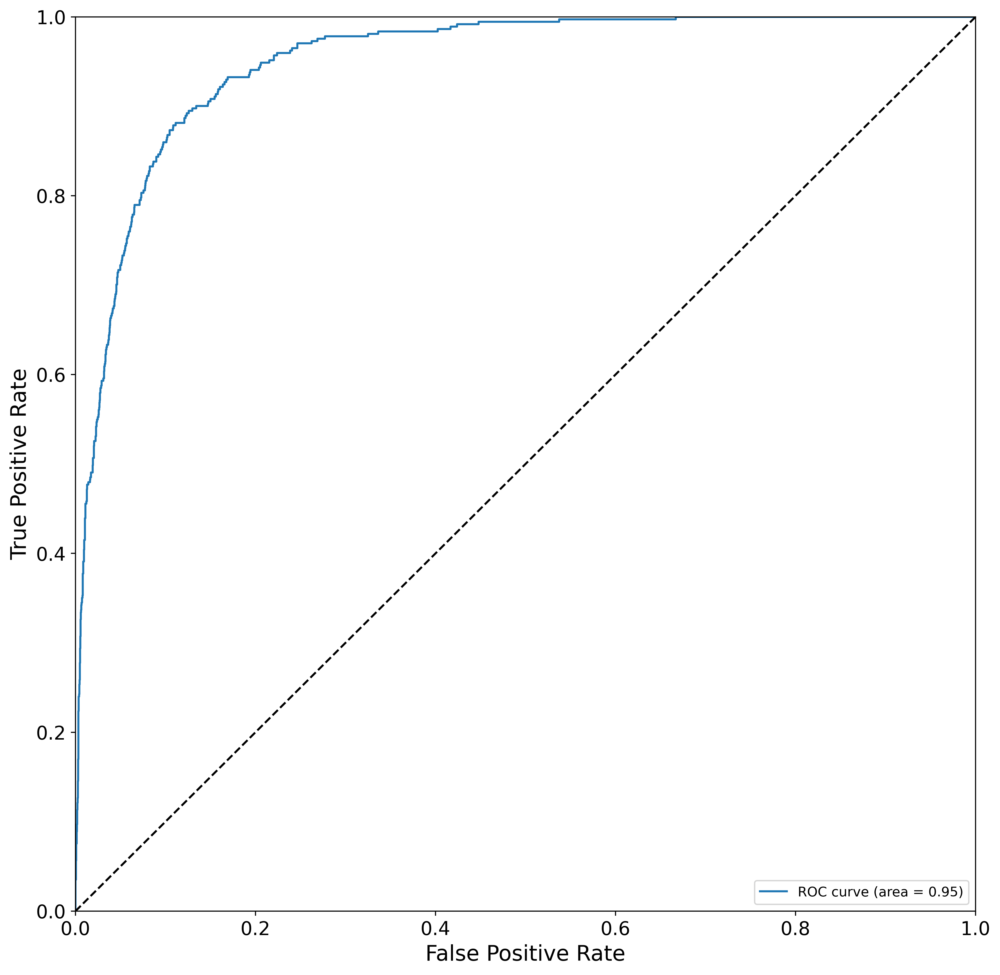

In [53]:
plt.figure(figsize = (12,12), dpi=400)
plt.tick_params(axis = 'both', which = 'major', labelsize = 14)
fpr, tpr, _ = metrics.roc_curve(y_test, class_models['random_forest']['probs'])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models['random_forest']['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Positive Rate', fontsize = 16)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")
plt.show()

## 10.4 ADASYN: Adaptive Synthetic Sampling Approach

ADASYN is a generalized form of the SMOTE algorithm. This algorithm also aims to oversample the minority class by generating synthetic instances for it. But the difference here is it considers the density distribution, ri which decides the no. of synthetic instances generated for samples which difficult to learn. Due to this, it helps in adaptively changing the decision boundaries based on the samples difficult to learn. This is the major difference compared to SMOTE.

In [57]:
from imblearn.over_sampling import ADASYN

counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using ADASYN
ada = ADASYN(random_state=130)
X_train_ada, y_train_ada = ada.fit_resample(X_train, y_train)

counter = Counter(y_train_ada)
print('After',counter)

Before Counter({0: 12406, 1: 1114})
After Counter({0: 12406, 1: 12394})


In [58]:
X_train = X_train_ada
y_train = y_train_ada

In [59]:
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()}, 
        'ridge':{'model': linear_model.RidgeClassifierCV(cv=5, alphas=[1e-3, 1e-2, 1e-1, 1],\
                                                         class_weight='balanced')},  
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=random_seed)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)}, 
        #Naive Bayes
        'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model':ensemble.RandomForestClassifier(max_depth=11,\
                                                                 class_weight='balanced', random_state=random_seed, 
                                                                 n_jobs=8)},
        #Neural Networks
        'mlp':{'model':make_pipeline(StandardScaler(),\
                                     neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=500,\
                                                   early_stopping=True, random_state=random_seed))}
    }

In [60]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 4min 43s, sys: 1.45 s, total: 4min 45s
Wall time: 3min 45s


In [61]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
mlp,0.974,0.959,0.983,0.916,0.985,0.788,0.775
gradient_boosting,0.984,0.952,0.989,0.798,0.973,0.731,0.708
random_forest,0.973,0.913,1.000,0.801,0.951,0.603,0.580
decision_tree,0.901,0.829,0.948,0.752,0.847,0.420,0.395
naive_bayes,0.826,0.732,0.937,0.809,0.841,0.332,0.315
logistic,0.755,0.767,0.748,0.693,0.794,0.329,0.291
knn,0.892,0.718,0.989,0.485,0.660,0.221,0.138
ridge,0.944,0.918,0.975,0.933,nan,0.652,0.648


MLP, gradient boosting, and random forest have slightly decreased in performance, while decision tree has decreased significantly in terms of accuracy and recall on the test set. Naive Bayes has decreased in terms of accuracy but has slightly higher recall on the test set. Logistic regression has improved slightly in terms of accuracy and recall on the test set.

## 10.5 Hybrid Techniques

### 10.5.1 Hybridization: SMOTE + Tomek Links

Hybridization techniques involve combining both undersampling and oversampling techniques. This is done to optimize the performance of classifier models for the samples created as part of these techniques.

SMOTE+TOMEK is such a hybrid technique that aims to clean overlapping data points for each of the classes distributed in sample space. After the oversampling is done by SMOTE, the class clusters may be invading each other’s space. As a result, the classifier model will be overfitting. Now, Tomek links are the opposite class paired samples that are the closest neighbors to each other. Therefore the majority of class observations from these links are removed as it is believed to increase the class separation near the decision boundaries. Now, to get better class clusters, Tomek links are applied to oversampled minority class samples done by SMOTE. Thus instead of removing the observations only from the majority class, we generally remove both the class observations from the Tomek links.

In [67]:
from imblearn.combine import SMOTETomek

counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE + Tomek
smtom = SMOTETomek(random_state=139)
X_train_smtom, y_train_smtom = smtom.fit_resample(X_train, y_train)

counter = Counter(y_train_smtom)
print('After',counter)

Before Counter({0: 12323, 1: 12323})
After Counter({0: 12321, 1: 12321})


In [68]:
X_train = X_train_smtom
y_train = y_train_smtom

In [69]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 4min 45s, sys: 1.5 s, total: 4min 47s
Wall time: 3min 41s


In [70]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
mlp,0.980,0.964,0.988,0.889,0.984,0.801,0.786
gradient_boosting,0.985,0.951,0.989,0.801,0.973,0.731,0.707
random_forest,0.973,0.914,1.000,0.795,0.951,0.603,0.579
decision_tree,0.901,0.829,0.947,0.744,0.849,0.418,0.391
naive_bayes,0.826,0.732,0.936,0.809,0.842,0.331,0.314
logistic,0.742,0.717,0.773,0.704,0.789,0.291,0.249
knn,0.893,0.718,0.991,0.482,0.660,0.220,0.136
ridge,0.944,0.919,0.975,0.933,nan,0.653,0.650


MLP, gradient boosting, random forest, and ridge regression models have slightly lower accuracy and recall scores on the test set compared to models using unbalanced data.

However, there is also a slight drop in performance for some models such as logistic regression, decision tree, and KNN models. These models have lower accuracy, recall, and F1 scores on the test set in the third table compared to the previous table.

### 10.5.3 Hybridization: SMOTE + ENN

SMOTE + ENN is another hybrid technique where more no. of observations are removed from the sample space. Here, ENN is yet another undersampling technique where the nearest neighbors of each of the majority class is estimated. If the nearest neighbors misclassify that particular instance of the majority class, then that instance gets deleted.

Integrating this technique with oversampled data done by SMOTE helps in doing extensive data cleaning. Here on misclassification by NN’s samples from both the classes are removed. This results in a more clear and concise class separation.

In [72]:
from imblearn.combine import SMOTEENN

counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE + ENN
smenn = SMOTEENN()
X_train_smenn, y_train_smenn = smenn.fit_resample(X_train, y_train)

counter = Counter(y_train_smenn)
print('After',counter)

Before Counter({0: 12321, 1: 12321})
After Counter({1: 11655, 0: 8183})


In [73]:
X_train = X_train_smenn
y_train = y_train_smenn

In [74]:
%%time
for model_name in class_models.keys():
    print(model_name)
    fitted_model = class_models[model_name]['model'].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    if model_name == 'ridge':
        y_test_pred = fitted_model.predict(X_test) 
    else:
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    class_models[model_name]['fitted'] = fitted_model
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred)
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred)
    if model_name != 'ridge':
        class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob)
    else:
        class_models[model_name]['ROC_AUC_test'] = np.nan
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred)
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

logistic
ridge
decision_tree
knn
naive_bayes
gradient_boosting
random_forest
mlp
CPU times: user 3min 52s, sys: 1.27 s, total: 3min 53s
Wall time: 2min 56s


In [75]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test',\
                                                               'Recall_train', 'Recall_test',\
                                                               'ROC_AUC_test', 'F1_test', 'MCC_test']]
class_metrics.sort_values(by='ROC_AUC_test', ascending=False).style.\
    format(dict(zip(class_metrics.columns, ['{:.3f}']*7))).\
    background_gradient(cmap='plasma', low=1, high=0.1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.1, subset=['Recall_train', 'Recall_test',\
                                                                 'ROC_AUC_test', 'F1_test', 'MCC_test'])

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,ROC_AUC_test,F1_test,MCC_test
mlp,0.987,0.959,0.996,0.916,0.984,0.788,0.775
gradient_boosting,0.989,0.936,0.995,0.860,0.971,0.688,0.670
random_forest,0.981,0.899,1.000,0.846,0.950,0.579,0.565
decision_tree,0.917,0.809,0.967,0.827,0.861,0.416,0.406
naive_bayes,0.857,0.722,0.949,0.860,0.850,0.337,0.331
logistic,0.777,0.636,0.851,0.792,0.784,0.264,0.231
knn,0.970,0.622,0.999,0.585,0.641,0.203,0.119
ridge,0.954,0.908,0.979,0.943,nan,0.628,0.628


MLP model still had high accuracy and recall on the train and test sets, but its F1 score and MCC decreased. The gradient boosting model had higher performance on the test set, while the random forest model had lower performance. The naive Bayes model had a slight improvement, but the decision tree, logistic, and KNN models had lower performance